# PROJECT OVERVIEW

# LOAD & PROCESS RAW STOCK DATA

In [1]:
# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload


## IMPORT STANDARD PACKAGES
from bs_ds.imports import *
from pprint import pprint

# Import my custom functions 
import functions_combined_BEST as ji
import my_keras_functions as jik
import bs_ds as bs


# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Set pd.set_options for tweet visibility
pd.set_option('display.max_colwidth',100)

# Reload modules in case files have been updated
reload(jik)
reload(ji)

bs_ds  v0.8.9 loaded.  Read the docs: https://bs-ds.readthedocs.io/en/latest/index.html
For convenient loading of standard modules use: from bs_ds.imports import *



Package,Handle,Description
bs_ds,bs,Custom data science bootcamp student package
matplotlib,mpl,Matplotlib's base OOP module with formatting artists
matplotlib.pyplot,plt,Matplotlib's matlab-like plotting module
numpy,np,scientific computing with Python
pandas,pd,High performance data structures and tools
seaborn,sns,High-level data visualization library based on matplotlib


Reloading my_keras_functions...
Reloading functions_combined_BEST...


<module 'functions_combined_BEST' from 'D:\\Users\\James\\Dropbox (Personal)\\CODING\\_FLATIRON\\Mod5_FinalProject\\dsc-5-capstone-project-online-ds-ft-021119\\functions_combined_BEST.py'>

In [2]:
# DISPLAY CODE TO BE USED BELOW TO LOAD AND PROCESS STOCK DATA
functions_used=['ji.load_processed_stock_data', # This script combines the oriignal 4 used:
                'ji.load_raw_stock_data_from_txt',
                'ji.set_timeindex_freq','ji.custom_BH_freq',
               'ji.get_technical_indicators']

ji.ihelp_menu(functions_used)

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

In [3]:
## Load in raw text file with minute-resolutin S&P 500 prices
raw_stock_df = ji.load_raw_stock_data_from_txt()
stock_df = ji.get_technical_indicators(raw_stock_df,make_price_from='BidClose')

# SELECT DESIRED COLUMNS
stock_df = raw_stock_df[[
    'price','ma7','ma21','26ema','12ema','MACD','20sd',
    'upper_band','lower_band','ema','momentum']].copy()#,'filled_timebin'

# Make stock_price for twitter functions
stock_df.dropna(inplace=True)
stock_df.to_csv('data/_stock_df_with_technical_indicators_08_23_2019.csv')
ji.index_report(stock_df)
display(stock_df.head(3))

There are 12 '0' values for 'BidClose'
	Replaced 0 with np.nan. There are 12 null values to address.
	since fill_or_drop_null=drop, dropping null values from BidClose.
Setting the timeindex to freqCBH
Index When:	Freq:	Index Start		Index End:
Pre-Change	None	2016-12-01 09:30:00	2019-08-22 16:00:00
Post-Change	<CustomBusinessHour: CBH=09:30-16:30>	2016-12-01 09:30:00	2019-08-22 15:30:00

Filled 611# of rows using method ffill
No Remaining Null Values


,Date,Time,BidOpen,BidHigh,BidLow,BidClose,AskOpen,AskHigh,AskLow,AskClose,date_time_index,filled_timebin
date_time_index,,,,,,,,,,,,
2016-12-01 09:30:00,12/01/2016,09:30,93.78,93.99,93.78,93.95,94.05,94.05,93.97,94.04,2016-12-01 09:30:00,False
2016-12-01 10:30:00,12/01/2016,10:30,94.16,94.16,94.09,94.10,94.17,94.17,94.10,94.11,2016-12-01 10:30:00,False
2016-12-01 11:30:00,12/01/2016,11:30,94.16,94.17,94.15,94.17,94.17,94.18,94.16,94.18,2016-12-01 11:30:00,False
2016-12-01 12:30:00,12/01/2016,12:30,94.21,94.21,94.21,94.21,94.22,94.22,94.22,94.22,2016-12-01 12:30:00,False
2016-12-01 13:30:00,12/01/2016,13:30,93.96,93.96,93.96,93.96,93.97,93.97,93.97,93.97,2016-12-01 13:30:00,False


DatetimeIndex(['2016-12-01 09:30:00', '2019-08-22 15:30:00'], dtype='datetime64[ns]', name='date_time_index', freq=None) <CustomBusinessHour: CBH=09:30-16:30>
* Index Endpoints:
	2016-12-29 15:30:00 -- to -- 2019-08-22 15:30:00
* Index Freq:
	<CustomBusinessHour: CBH=09:30-16:30>


,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum
date_time_index,,,,,,,,,,,
2016-12-29 15:30:00,96.27,96.864898,96.277007,96.573856,96.730494,0.156639,1.002051,98.281110,94.272904,96.263988,89.27
2016-12-30 09:30:00,96.38,96.850204,96.293537,96.571218,96.721997,0.150779,0.980655,98.254848,94.332227,96.341329,89.38
2016-12-30 10:30:00,96.21,96.831633,96.307891,96.566317,96.709593,0.143275,0.959724,98.227340,94.388442,96.253776,89.21


In [4]:
ji.disp_df_head_tail(stock_df)

,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum
date_time_index,,,,,,,,,,,
2016-12-29 15:30:00,96.27,96.8649,96.277,96.5739,96.7305,0.156639,1.00205,98.2811,94.2729,96.264,89.27
2016-12-30 09:30:00,96.38,96.8502,96.2935,96.5712,96.722,0.150779,0.980655,98.2548,94.3322,96.3413,89.38
2016-12-30 10:30:00,96.21,96.8316,96.3079,96.5663,96.7096,0.143275,0.959724,98.2273,94.3884,96.2538,89.21


,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum
date_time_index,,,,,,,,,,,
2019-08-22 13:30:00,115.51,114.248,115.833,115.581,114.894,-0.686406,2.4793,120.792,110.875,115.381,108.51
2019-08-22 14:30:00,115.38,114.24,115.805,115.579,114.906,-0.672785,2.4607,120.726,110.884,115.38,108.38
2019-08-22 15:30:00,115.46,114.238,115.776,115.577,114.919,-0.658449,2.44276,120.662,110.891,115.433,108.46


In [5]:
stock_df['price'].iplot()

In [6]:
fig = ji.plotly_time_series(stock_df['price'])

In [5]:
# # Load stock_df data from functions detailed above
# """NOTE: current processed filename ready for modeling is: processed_datafile"""
# processed_datafile = '_stock_df_with_technical_indicators.csv'

# # LOAD IN FULL STOCK DATASET 
# full_df = ji.load_processed_stock_data()

# # SELECT DESIRED COLUMNS
# stock_df = full_df[[
#     'price','ma7','ma21','26ema','12ema','MACD',
#     '20sd','upper_band','lower_band','ema','momentum','filled_timebin'
# ]].copy()

# # print(stock_df.index.freq)
# display(stock_df.head(3))
# fig = ji.plotly_time_series(stock_df['price'])

In [6]:
reload(ji)

# Plot technical indicators to be used
fig = ji.plotly_technical_indicators(stock_df);

Reloading functions_combined_BEST...


In [7]:
# ## SAVE FULL CSV WITH TECH INDICATORS
# def save_df_to_csv_ask_to_overwrite(stock_df, filename = '_stock_df_with_technical_indicators.csv',):
#     import os
#     current_files = os.listdir()

#     processed_data_filename = filename#'_stock_df_with_technical_indicators.csv'

#     # check if csv already exists
#     if processed_data_filename not in current_files:

#         stock_df.to_csv(processed_data_filename)

#     # Ask the user to overwrite existing file
#     else:

#         print('File already exists.')
#         check = input('Overwrite?(y/n):')

#         if check.lower() == 'y':
#             stock_df.to_csv(processed_data_filename)
#             print(f'File {processed_data_filename} was saved.')
    
#         else:
#             print('No file was saved.')
            
# # save_df_to_csv_ask_to_overwrite(stock_df,'stock_df_for_modeling.csv')

## Checking for Stationarity and Trends

In [8]:
fun_used=['stationarity_check', 'adf_test']
ihelp_menu(fun_used)

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

Results of Dickey-Fuller Test:
	If p<.05 then timeseries IS stationary.
Test Statistic                   -1.881389
p-value                           0.340866
#Lags Used                        0.000000
Number of Observations Used    4361.000000
Critical Value (1%)              -3.431850
Critical Value (5%)              -2.862203
Critical Value (10%)             -2.567123
dtype: float64


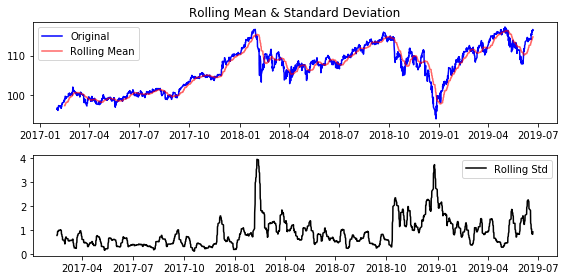

In [9]:
## STATIONARITY CHECK
# Check if stationary 
ji.stationarity_check(stock_df,  window=70, col='price',freq=ji.custom_BH_freq())

In [10]:
## SEASONAL DECOMPOSITION
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(stock_df['price'], freq=35)#35=1 business week

# with plt.rc_context({'figure.figsize': (8,5)}):
#     result.plot();

## Interactive plot of seasonal decomposition
stock_observed = result.observed.rename('true price')
stock_trend = result.trend.rename('trend')
stock_seasonal = result.seasonal.rename('seasonal')
stock_residual = result.resid.rename('residual')

## Concatenate decomposition components
df_decomp = pd.concat([stock_observed,stock_trend, stock_seasonal, stock_residual],axis=1)

# Plotly Plot of Result
my_layout = ji.def_my_layout_solar_theme()
df_decomp.iplot(asDates=True,subplots=True,shape=(4,1), layout=my_layout,shared_xaxes=True)

# Get ADF Stationarity Check for all components
for col in df_decomp.columns:
    print('---'*20)
    print(f"Column: {col}")
    print('---'*10)
    ji.adf_test(df_decomp[col])
    print('---'*20,'\n')

------------------------------------------------------------
Column: true price
------------------------------
Augmented Dickey-Fuller Test: 
ADF test statistic        -1.881389
p-value                    0.340866
# lags used                0.000000
# observations          4361.000000
critical value (1%)       -3.431850
critical value (5%)       -2.862203
critical value (10%)      -2.567123
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary
------------------------------------------------------------ 

------------------------------------------------------------
Column: trend
------------------------------
Augmented Dickey-Fuller Test: 
ADF test statistic        -1.469995
p-value                    0.548299
# lags used               31.000000
# observations          4296.000000
critical value (1%)       -3.431873
critical value (5%)       -2.862213
critical value (10%)      -2.567128
Weak evidence against the null hyp

# INITIAL MODEL 

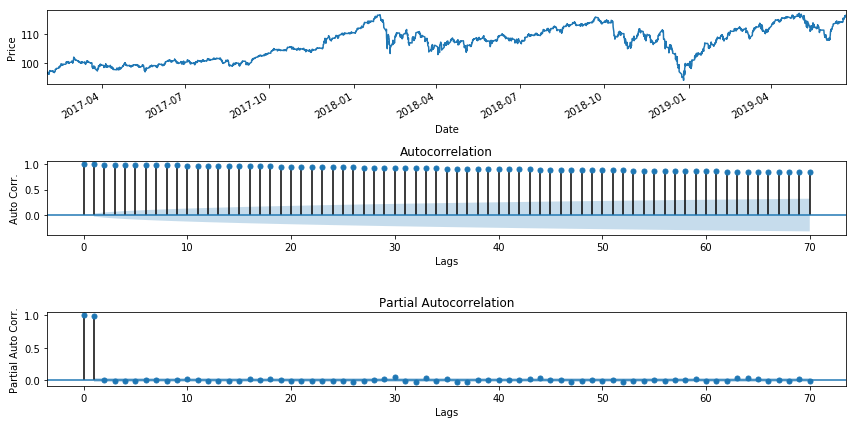

In [11]:
skip=False
## VISUALIZE PACF AND ACF FUNCTIONS
if skip==False:
    ## VISUALIZE PACF AND ACF FUNCTIONS
    from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
    plot_df = stock_df['price']

    # Create subplots 
    fig,ax = plt.subplots(nrows=3,ncols=1, figsize=(12,6),sharex=False)
    plot_df.plot(ax=ax[0])
    
    ## Set labels for subplot axes
    ax[-1].set(xlabel='Date')
    x_labels = ['Date','Lags','Lags']
    y_labels = ['Price','Auto Corr.','Partial Auto Corr.']
    ax_labels = list(zip(x_labels,y_labels))
    
    for i, (x_label,y_label) in enumerate(ax_labels):
        ax[i].set(ylabel=y_label, xlabel=x_label)

    # Plot acf and pacf
    num_lags = 70
    plot_acf(plot_df,ax=ax[1] , lags=num_lags);
    plot_pacf(plot_df,ax=ax[2],lags=num_lags);
    plt.tight_layout()


## Pyramind ARIMA GridSearch 
#### **Using `pmdarima` to grid search for best ARIMA model type and orders**

- Using `auto_arima` from `pmdarima`

- SARIMA involves multiple sets of hyperparameters:
    - For base model: a set of p,d,q parameters
    - For seasonal model:a set of P,D,Q for the seasonal components.
    - m = the number of time periods to include in the season 
    
- Set start and max values for each parameter
    - i.e. `start_p=0, max_p = 10`
- For seasonal data, setting `m` indicates how many periods should be considered part of the season.


- **Below is from ["Predicitng the Sotck Market Using Machine Learning and Deep Learning."](https://www.analyticsvidhya.com/blog/2018/10/predicting-stock-price-machine-learningnd-deep-learning-techniques-python/):**
> Below are the steps you should follow for implementing auto ARIMA:
    1. Load the data: This step will be the same. Load the data into your notebook
    2. Preprocessing data: The input should be univariate, hence drop the other columns
    3. Fit Auto ARIMA: Fit the model on the univariate series
    4. Predict values on validation set: Make predictions on the validation set
    5. Calculate RMSE: Check the performance of the model using the predicted values against the actual values

In [12]:
ji.reload([jik,ji])


df_decomp.dropna(inplace=True)
df_decomp.head(2)

Reloading my_keras_functions...
Reloading functions_combined_BEST...


,true price,trend,seasonal,residual
date_time_index,,,,
2017-02-03 11:30:00,97.41,96.909429,-0.030535,0.531107
2017-02-03 12:30:00,97.45,96.923143,-0.026372,0.553229


In [13]:
## PREPARE DATA FOR PMD_ARIMA
arima_model_params={}
arima_model_params['data_params'] = ji.def_data_params(df_decomp,
                                                 num_test_days=10, num_train_days=365, 
                                                 days_for_x_window=1, verbose=0)

###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
dp = arima_model_params['data_params']
df_train, df_test = ji.train_test_split_by_last_days(df_decomp,
                                                     periods_per_day = dp['periods_per_day'], 
                                                     num_test_days   =  dp['num_test_days'],
                                                     num_train_days  =  dp['num_train_days'],
                                                     verbose=0,plot_col='true price', iplot=True)

display(df_train.head(2).style.set_caption('df_train'),df_test.head(2).style.set_caption('df_test'))

None

,true price,trend,seasonal,residual
date_time_index,,,,
2018-01-10 13:30:00,112.56,112.881,0.0820817,-0.402939
2018-01-10 14:30:00,112.41,112.939,0.0997379,-0.629166


,true price,trend,seasonal,residual
date_time_index,,,,
2019-06-05 12:30:00,111.41,111.118,0.071262,0.220738
2019-06-05 13:30:00,111.66,111.288,0.0820817,0.290204


In [14]:
## RUN AUTO ARIMA GRID SEARCH
skip=True
if skip==False:
    auto_arima_clock = bs.Clock()
    auto_arima_clock.tic()
    from pmdarima.arima import auto_arima
    train_data=df_train['price'].values
    
    auto_arima_model = auto_arima(train_data, start_p=1, start_q=1, D=1, max_p=2,max_q=2,
                       trace=True,seasonal=True,m=35,)
    auto_arima_clock.toc()
    
    display(auto_arima_model.summary())


___
**Results of the Auto-Arima searching with training data set:**
- Training Set= all data less the last 90 days:

`Model:		SARIMAX(0, 1, 0)x(1, 0, 1, 35)	`
- **New Result (08/06)**
    - `order= (0,1,0),seasonal_order=(0,1,1,35)`
- So what is this really saying?
    - p,d,q = (0,1,0)
        - AR (p) = 0
        - Difference=1
        - MA order(q)=0 
        
    - P,D,Q,m = (1,0,1,35)
        - Seasonal AR(P) = 1
        - Seasonal Differencing =0
        - Seasonal MA(Q)
        - Steps per season (m) = 35 (set by user)

`statsmodels` version of SARIMA called SARIMAX adds an eXogenous variable to the regression.
- Read this: https://www.analyticsvidhya.com/blog/2018/08/auto-arima-time-series-modeling-python-r/


- WHEN I SWITCH TO DAILY DATA:
`Model:	SARIMAX(1, 1, 1)x(1, 0, 1, 5)`
 
### Now implement suggested SARIMAX model

In [15]:
## IMPLEMENT SUGGESTED SARIMAX MODEL
skip=True
if skip==False:
    clock_sarimax = bs.Clock()
    
    train_data = df_train['true price'].values.reshape(-1,1)
    exog_data = df_train['trend'].values.reshape(-1,1)
    print(exog_data.shape, train_data.shape)
    
    from statsmodels.tsa.statespace.sarimax import SARIMAX
    
    clock_sarimax.tic()
    # Fit ARIMA: order=(1, 0, 0) seasonal_order=(1, 1, 0, 35); AIC=2881.238, BIC=2905.991, Fit time=52.449 seconds
    sarimax_model = SARIMAX(train_data, 
                            order= (0,1,0),
                            seasonal_order=(0,1,1,35),
                            enforce_invertibility=False)#,trend=exog_data) 
    results=sarimax_model.fit()
    clock_sarimax.toc()
    display(results.summary())
    

In [16]:
skip=True
if skip==False:
    # Get test and train data 
    test_data = df_test['true price']
    train_data = df_train
    
    ## EVALUATE MODEL
    from sklearn.metrics import mean_absolute_error, mean_squared_error
    
    # Get predictions
    start = len(train_data)
    end = start + len(test_data) - 1
    
    predictions =results.predict(start=start,end=end)#).rename('SARIMA Model')
    days_per_period=7
    
#     # Run custom regression evaluation function
#     res_df = ji.evaluate_regression(test_data,predictions, metrics=['r2','RMSE','MAE','U'])

    
    # Combine preds and true into one df
    df_predictions_sarima = pd.concat([test_data,pd.Series(predictions, 
                                                           index=test_data.index,
                                                           name='predicted_price')],axis=1)
    df_predictions_sarima.dropna(inplace=True)

    
    # Calculate  rmse
    rmse_sarima = np.sqrt(mean_squared_error(df_predictions_sarima['true price'],df_predictions_sarima['predicted_price']))
    print(f"RMSE: {rmse_sarima.round(3)}")

    
    def plot_arima_preds(train_data, df_predictions_sarima):
    ## Plot results
        fig, ax  = plt.subplots(nrows=1,ncols=2, figsize=(10,4))

        ax[0].plot(train_data['true price'].iloc[-120*days_per_period:], color='orange',label='Training Price')#.plot(label='price - train')
        ax[0].plot(df_predictions_sarima['true price'], label='True Price', color='blue')
        ax[0].plot(df_predictions_sarima['predicted_price'], label='Predicted Price',color='green')

        ax[0].set_ylabel('Stock Price')
        ax[0].set_xlabel('Business Day - Hour Resolution')

        ax[1].plot(df_predictions_sarima['true price'],color='blue', label='True Price')
        ax[1].plot(df_predictions_sarima['predicted_price'], color='green',label='Predicted Price')    

        ax[0].xaxis.set_tick_params(rotation=30)
        ax[1].xaxis.set_tick_params(rotation=30)

        plt.suptitle('SARIMAX Model',y=1.01)
        plt.legend()
        plt.tight_layout()
        #     plt.text('2018-10-01',113,f"RMSE: {rmse_sarima.round(3)}", fontdict={'fontsize':10, 'fontweight':'medium'})
        plt.show()
        return fig, ax
    # Run custom regression evaluation function
    res_df = ji.evaluate_regression(test_data,predictions, metrics=['r2','RMSE','MAE','U'], display_thiels_u_info=True)
    display(res_df)
    plot_arima_preds(train_data,df_predictions_sarima)

# KERAS NLP CLASSIFICATION

In [17]:
stock_df.head()

,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum
date_time_index,,,,,,,,,,,
2017-01-31 15:30:00,96.52,96.781837,96.768844,96.737074,96.721769,-0.015306,0.448862,97.666567,95.871120,96.444183,89.52
2017-02-01 09:30:00,96.94,96.796327,96.769252,96.739835,96.727060,-0.012775,0.447625,97.664501,95.874002,96.774728,89.94
2017-02-01 10:30:00,96.71,96.810816,96.766599,96.739430,96.726646,-0.012784,0.446030,97.658659,95.874538,96.731576,89.71
2017-02-01 11:30:00,96.50,96.822245,96.765782,96.736190,96.721159,-0.015031,0.443451,97.652683,95.878881,96.577192,89.50
2017-02-01 12:30:00,96.44,96.834490,96.765578,96.732193,96.714357,-0.017836,0.440726,97.647030,95.884127,96.485731,89.44


In [18]:
ihelp(ji.load_twitter_df_stock_price)

------------------------------------------------------------------------------------
------ HELP ------------------------------------------------------------------------

Help on function load_twitter_df_stock_price in module functions_combined_BEST:

load_twitter_df_stock_price()
    ###################### TWITTER AND STOCK PRICE DATA ######################
    ## twitter_df, stock_price = load_twitter_df_stock_price()
    ## twitter_df = get_stock_prices_for_twitter_data(twitter_df, stock_prices)

------------------------------------------------------------------------------------
------ SOURCE ----------------------------------------------------------------------


```python
def load_twitter_df_stock_price():# del stock_price
    from IPython.display import display
    try: stock_price
    except NameError: stock_price = None
    if stock_price is  None:    
        print('loading stock_price')
        stock_price = load_stock_price_series()
    else:
        print('using pre-existing stock_price')

    # Make sure stock_price is loaded as minute data
    stock_price = stock_price.asfreq('T')
    stock_price.dropna(inplace=True)
    stock_price.sort_index(inplace=True)

    ## LOAD TWEETS, SELECT THE PROPER DATE RANGE AND COLUMNS
    # twitter_df = load_twitter_df(verbose=0)
    try: twitter_df
    except NameError: twitter_df=None
    if twitter_df is None:
        print('Loading twitter_df')
        twitter_df= load_raw_twitter_file()
        twitter_df = full_twitter_df_processing(twitter_df,cleaned_tweet_col='clean_content')

    stock_price.sort_index(inplace=True)
    twitter_df.sort_index(inplace=True)
    
    display(twitter_df.head())
    print(stock_price.index[0],stock_price.index[-1])
    print(twitter_df.index[0],twitter_df.index[-1])
    
    return twitter_df, stock_price

```

In [19]:
## REPLACE THIS CELL WITH USE OF FULL_TWITTER_PROCESSING OR TEXT CLASS
# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload


## IMPORT STANDARD PACKAGES
from bs_ds.imports import *
from pprint import pprint

# Import my custom functions 
import functions_combined_BEST as ji
import my_keras_functions as jik
import function_widgets as fw
import bs_ds as bs

# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()


bs.big_pandas()
# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Reload modules in case files have been updated
reload(jik)
reload(ji)

## Load in twitter data and stock_price in minute resolution
twitter_df,stock_price = ji.load_twitter_df_stock_price()
# Limit tweets by avialable stock data    
twitter_df = twitter_df.loc[stock_price.index[0]:stock_price.index[-1]]


# twitter_df.head()
twitter_df = ji.get_stock_prices_for_twitter_data(twitter_df,stock_price)
df_tokenize=twitter_df.copy()

## Create integer version of 'delta_price_class'
df_tokenize['delta_price_class_int']=df_tokenize['delta_price_class'].apply(lambda x: 1 if x=='pos' else 0) #y = [1 if x=='pos' else 0  for x in df_sampled['delta_price_class']]
display(df_tokenize.head())

class_counts = df_tokenize['delta_price_class'].value_counts()
print(class_counts)

display.max_columns=None
display.expand_frame_repr=False
display.max_rows=None
display.max_info_columns=500
display.precision=4
Reloading my_keras_functions...
Reloading functions_combined_BEST...
loading stock_price
Loading twitter_df


,source,content,date,retweet_count,favorite_count,is_retweet,id_str,has_RT,starts_RT,content_starts_RT,clean_content,content_min_clean,content_hashtags,hashtag_strings,content_mentions,mention_strings,clean_content_stop,clean_content_stop_tokens,case_ratio,sentiment_scores,compound_score,sentiment_class,neg,neu,pos
date,,,,,,,,,,,,,,,,,,,,,,,,,
2017-01-20 12:31:53,Twitter for Android,It all begins today! I will see you at 11:00 A.M. for the swearing-in. THE MOVEMENT CONTINUES - ...,2017-01-20 12:31:53,70523,268372,False,822421390125043713,False,False,[],It all begins today! I will see you at 11:00 A.M. for the swearing-in. THE MOVEMENT CONTINUES - ...,It all begins today! I will see you at 11:00 A.M. for the swearing-in. THE MOVEMENT CONTINUES - ...,[],,[],,begins today see swearing movement continues work begins,"[begins, today, see, swearing, movement, continues, work, begins]",0.3304,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,pos,0.000,1.000,0.000
2017-01-20 17:51:25,Twitter for iPhone,Today we are not merely transferring power from one Administration to another or from one party ...,2017-01-20 17:51:25,20125,109640,False,822501803615014918,False,False,[],Today we are not merely transferring power from one Administration to another or from one party ...,Today we are not merely transferring power from one Administration to another or from one party ...,[],,[],,today merely transferring power one administration another one party another transferring,"[today, merely, transferring, power, one, administration, another, one, party, another, transfer...",0.0148,"{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.2144}",0.2144,pos,0.000,0.919,0.081
2017-01-20 17:51:58,Twitter for iPhone,power from Washington D.C. and giving it back to you the American People. #InaugurationDay,2017-01-20 17:51:58,18362,91143,False,822501939267141634,False,False,[],power from Washington D.C. and giving it back to you the American People.,power from Washington D.C. and giving it back to you the American People. #InaugurationDay,[#InaugurationDay],#InaugurationDay,[],,power washington c giving back american people,"[power, washington, c, giving, back, american, people]",0.0778,"{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.34}",0.3400,pos,0.000,0.844,0.156
2017-01-20 17:52:45,Twitter for iPhone,What truly matters is not which party controls our government but whether our government is cont...,2017-01-20 17:52:45,42790,180394,False,822502135233384448,False,False,[],What truly matters is not which party controls our government but whether our government is cont...,What truly matters is not which party controls our government but whether our government is cont...,[],,[],,truly matters party controls government whether government controlled people,"[truly, matters, party, controls, government, whether, government, controlled, people]",0.0086,"{'neg': 0.079, 'neu': 0.776, 'pos': 0.145, 'compound': 0.0954}",0.0954,pos,0.079,0.776,0.145
2017-01-20 17:53:17,Twitter for iPhone,January 20th 2017 will be remembered as the day the people became the rulers of this nation again.,2017-01-20 17:53:17,60604,218555,False,822502270503972872,False,False,[],January 20th 2017 will be remembered as the day the people became the rulers of this nation again.,January 20th 2017 will be remembered as the day the people became the rulers of this nation again.,[],,[],,january th remembered day people became rulers nation,"[january, th, remembered, day, people, became, rulers, nation]",0.0102,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,pos,0.000,1.000,0.000


2017-01-20 09:30:00 2019-06-21 16:00:00
2017-01-20 12:31:53 2019-06-20 00:12:31


,source,content,date,retweet_count,favorite_count,is_retweet,id_str,has_RT,starts_RT,content_starts_RT,clean_content,content_min_clean,content_hashtags,hashtag_strings,content_mentions,mention_strings,clean_content_stop,clean_content_stop_tokens,case_ratio,sentiment_scores,compound_score,sentiment_class,neg,neu,pos,day,time,dayofweek,B_day,B_shifted,B_time,B_dt_index,time_shift,B_dt_minutes,stock_price_results,null_results,B_ts_rounded,pre_tweet_price,mins_after_tweet,B_ts_post_tweet,post_tweet_price,delta_time,delta_price,delta_price_class,delta_price_class_int
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-01-20 12:31:53,Twitter for Android,It all begins today! I will see you at 11:00 A.M. for the swearing-in. THE MOVEMENT CONTINUES - ...,2017-01-20 12:31:53,70523,268372,False,822421390125043713,False,False,[],It all begins today! I will see you at 11:00 A.M. for the swearing-in. THE MOVEMENT CONTINUES - ...,It all begins today! I will see you at 11:00 A.M. for the swearing-in. THE MOVEMENT CONTINUES - ...,[],,[],,begins today see swearing movement continues work begins,"[begins, today, see, swearing, movement, continues, work, begins]",0.3304,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,pos,0.000,1.000,0.000,2017-01-20,12:31:53,Friday,2017-01-20,False,12:31:53,2017-01-20 12:31:53,0 days,2017-01-20 12:32:00,"{'B_ts_rounded': 2017-01-20 12:32:00, 'pre_tweet_price': 96.19, 'mins_after_tweet': 60, 'B_ts_po...",False,2017-01-20 12:32:00,96.19,60.0,2017-01-20 13:32:00,96.37,01:00:00,0.18,pos,1
2017-01-20 17:51:25,Twitter for iPhone,Today we are not merely transferring power from one Administration to another or from one party ...,2017-01-20 17:51:25,20125,109640,False,822501803615014918,False,False,[],Today we are not merely transferring power from one Administration to another or from one party ...,Today we are not merely transferring power from one Administration to another or from one party ...,[],,[],,today merely transferring power one administration another one party another transferring,"[today, merely, transferring, power, one, administration, another, one, party, another, transfer...",0.0148,"{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'compound': 0.2144}",0.2144,pos,0.000,0.919,0.081,2017-01-20,17:51:25,Friday,2017-01-20,False,17:51:25,2017-01-20 17:51:25,0 days,2017-01-20 17:51:00,"{'B_ts_rounded': 2017-01-23 09:30:00, 'pre_tweet_price': 96.23, 'mins_after_tweet': 60, 'B_ts_po...",False,2017-01-23 09:30:00,96.23,60.0,2017-01-23 10:30:00,96.00,01:00:00,-0.23,neg,0
2017-01-20 17:51:58,Twitter for iPhone,power from Washington D.C. and giving it back to you the American People. #InaugurationDay,2017-01-20 17:51:58,18362,91143,False,822501939267141634,False,False,[],power from Washington D.C. and giving it back to you the American People.,power from Washington D.C. and giving it back to you the American People. #InaugurationDay,[#InaugurationDay],#InaugurationDay,[],,power washington c giving back american people,"[power, washington, c, giving, back, american, people]",0.0778,"{'neg': 0.0, 'neu': 0.844, 'pos': 0.156, 'compound': 0.34}",0.3400,pos,0.000,0.844,0.156,2017-01-20,17:51:58,Friday,2017-01-20,False,17:51:58,2017-01-20 17:51:58,0 days,2017-01-20 17:52:00,"{'B_ts_rounded': 2017-01-23 09:30:00, 'pre_tweet_price': 96.23, 'mins_after_tweet': 60, 'B_ts_po...",False,2017-01-23 09:30:00,96.23,60.0,2017-01-23 10:30:00,96.00,01:00:00,-0.23,neg,0
2017-01-20 17:52:45,Twitter for iPhone,What truly matters is not which party controls our government but whether our government is cont...,2017-01-20 17:52:45,42790,180394,False,822502135233384448,False,False,[],What truly matters is not which party controls our government but whether our government is cont...,What truly matters is not which party controls our government but whether our government is cont...,[],,[],,truly matters party controls government whether government controlled people,"[truly, matters, party, controls, government, whether, government, co

neg    4652
pos    3790
Name: delta_price_class, dtype: int64


In [20]:
## SAMPLE ONLY TWEETS WITHIN 1 DAY OF STOCK MARKET PRICE DATA
df_sampled = df_tokenize.loc[df_tokenize['delta_time']<'1 day']

## Check for class value counts to see if resampling/balancing is needed
class_counts = df_sampled['delta_price_class_int'].value_counts()
print('%: ',class_counts/len(df_sampled))
class_counts

%:  1    0.5923
0    0.4077
Name: delta_price_class_int, dtype: float64


1    3781
0    2603
Name: delta_price_class_int, dtype: int64

In [21]:
def undersample_df_to_match_classes(df,class_column='delta_price_class' , verbose=1):
    """Resamples (undersamples) input df so that the classes in class_column have equal number of occruances."""
    
    ##  Get value counts and classes
    class_counts = df[class_column].value_counts()
    classes = list(class_counts.index)
    class0, class1 = classes

    if verbose>0:
        print('Class Value Counts:')
        print('%: ',class_counts/len(df))

    ## Check counts to determine which classes' counts should be matched
    if class_counts[classes[0]] > class_counts[classes[1]]:
        class_to_match = classes[1]
        
    elif class_counts[classes[1]] > class_counts[classes[0]]:
        class_to_match = classes[0]
    else:
        raise Exception('Classes are already balanced')
        
    # get number of samples to match
    count_to_match = class_counts[class_to_match]

    ## Separate classes to sample count_to_match from each.
    df_sampled_class0 =  df.loc[df[class_column] == classes[0]].sample(n=count_to_match)
    df_sampled_class1 =  df.loc[df[class_column] == classes[1]].sample(n=count_to_match)
    
    ## Combine class dfs and sort_index
    df_sampled = pd.concat([df_sampled_class0,df_sampled_class1], axis=0)
    df_sampled.sort_index(inplace=True)
    
    return df_sampled

df_sampled = undersample_df_to_match_classes(df_sampled, class_column='delta_price_class_int')

ji.display_random_tweet_by_column(df_sampled,as_df=True) 

Class Value Counts:
%:  1    0.5923
0    0.4077
Name: delta_price_class_int, dtype: float64


,tweet
column,
content,RT @USCG: We know how much you love your pets and want to keep them safe from flooding. 🐶 #HurricaneFlorence#Florencehttps://t.co/kfzNsx1…
content_min_clean,We know how much you love your pets and want to keep them safe from flooding. 🐶 #HurricaneFlorence#Florence …
clean_content,We know how much you love your pets and want to keep them safe from flooding. 🐶 …
clean_content_stop,know much love pets want keep safe flooding
clean_content_stop_tokens,"['know', 'much', 'love', 'pets', 'want', 'keep', 'safe', 'flooding']"


#### Word2Vec

In [23]:
# import functions_classes as jic
# ji.reload([jic,ji])

# TWEETS = ji.TEXT(df_sampled,text_data_col = 'content_min_clean')
# # print(len(TWEETS.wv.vocab))
# TWEETS.fit_models()
# TWEETS.FreqDist

In [24]:
# from nltk import regexp_tokenize
# pattern = "([a-zA-Z]+(?:'[a-z]+)?)"
# text_data = df_sampled['content_min_clean'].apply(lambda x: regexp_tokenize(x, pattern))
# text_data

In [25]:
# ji.disp_df_head_tail(df_sampled[['delta_price','delta_price_class']])

In [22]:
## NEW FUNCTIONS FOR WORD2VEC AND KERAS TOKENIZATION/SEQUENCE GENERATION
def make_word2vec_model(df, text_column='content_min_clean', regex_pattern ="([a-zA-Z]+(?:'[a-z]+)?)",
                       vector_size=300,window=3,min_count=1,workers=3,epochs=10,summary=True, return_full=False):
    
    ## Regexp_tokenize text_column
    from nltk import regexp_tokenize
    text_data = df[text_column].apply(lambda x: regexp_tokenize(x, regex_pattern))

    ## Instantiate Word2Vec Model
    from gensim.models import Word2Vec
    vector_size = 300
    wv_keras = Word2Vec(text_data, size=vector_size, window=window, min_count=min_count, workers=workers)
    
    # Train Word2Vec Model
    wv_keras.train(text_data,total_examples=wv_keras.corpus_count, epochs=epochs)

    
    ## Display summary
    if summary:
        wv = wv_keras.wv
        vocab_size = len(wv_keras.wv.vocab)
        print(f'Word2Vec model trained using:   min_count={min_count}, window={window}, over {epochs} epochs.')
        print(f'There are {vocab_size} words the vocabulary, with a vector size {vector_size}.')
        if return_full:
            ans = 'full model'
        else:
            ans = 'model.wv'
        
        print(f'- output is {ans}')
        
    if return_full:
        return wv_keras
    else:
        return wv_keras.wv
    
def get_wv_from_word2vec(word2vec_model):
    """Checks if model is full word2vec or .wv attribute. 
    Returns wv."""
    import gensim 
    if isinstance(word2vec_model,gensim.models.word2vec.Word2Vec):
        wv = word2vec_model.wv
    elif isinstance(w2v_model,gensim.models.keyedvectors.Word2VecKeyedVectors):
        wv = word2vec_model
    return wv



def make_embedding_matrix(word2vec_model,verbose=1):#,X_sequences = None,input_size=None):#, return_matrix=False, return_layer=True):
        """Uses the word2vec model to construct an embedding_layer for Keras models.
        To override the default size of the input for the embedding layer, provide an input_size value
        (which will likely be the size of hte vocabulary being fed in for predictions)."""
        import numpy as np
        import pandas as pd     
        
        wv = get_wv_from_word2vec(word2vec_model)
        vocab_size = len(wv.vocab)
        vector_size = wv.vector_size
            
        ## Create the embedding matrix from the vectors in wv model 
        embedding_matrix = np.zeros((vocab_size + 1, vector_size))
        for i, vec in enumerate(wv.vectors):
            embedding_matrix[i] = vec
            embedding_matrix.shape
            
        if verbose:
            print(f'embedding_matrix.shape = {embedding_matrix.shape}')
        
        return embedding_matrix

def make_keras_embedding_layer(word2vec_model,X_sequences,embedding_matrix= None):
        """Creates an embedding layer for Kera's neural networks using the 
        embedding matrix and text X_sequences"""
        if embedding_matrix is None:
            embedding_matrix = make_embedding_matrix(word2vec_model,verbose=0)
        
        wv = get_wv_from_word2vec(word2vec_model)
        vocab_size = len(wv.vocab)
        vector_size = wv.vector_size
                
        from keras import layers         
        embedding_layer =layers.Embedding(vocab_size+1,
                                          vector_size,
                                          input_length=X_sequences.shape[1],
                                          weights=[embedding_matrix],
                                          trainable=False)
        return embedding_layer

    
def get_tokenizer_and_text_sequences(word2vec_model,text_data):    
    # sentences_train =text_data # df_tokenize['tokens'].values
    from keras.preprocessing.text import Tokenizer
    wv = get_wv_from_word2vec(word2vec_model)

    tokenizer = Tokenizer(num_words=len(wv.vocab))
    
    ## FIGURE OUT WHICH VERSION TO USE WITH SERIES:
    tokenizer.fit_on_texts(text_data)
#     tokenizer.fit_on_texts(list(text_data)) 

    word_index = tokenizer.index_word
    reverse_index = {v:k for k,v in word_index.items()}
    
    # return integer-encoded sentences
    from keras.preprocessing import text, sequence
    X = tokenizer.texts_to_sequences(text_data)
    X = sequence.pad_sequences(X)
    return tokenizer, X


########################################################################################    
    
## FITING WORD2VEC AND TOKENIZER    
text_column='content_min_clean'
w2v_model = make_word2vec_model(df_sampled, text_column='content_min_clean',return_full=False)



## Get X_sequences and y data
tokenizer, X_sequences = get_tokenizer_and_text_sequences(w2v_model, df_sampled[text_column])
print('X_sequences shape=',X_sequences.shape)
y = df_sampled['delta_price_class_int'].values

Word2Vec model trained using:   min_count=1, window=3, over 10 epochs.
There are 12181 words the vocabulary, with a vector size 300.
- output is model.wv


Using TensorFlow backend.


X_sequences shape= (5206, 116)


In [23]:
## Test reverse tokenization/sequencing
back2text = tokenizer.sequences_to_texts(X_sequences)
print('length text == len(df): ',len(back2text) == len(df_sampled))

back2text[0]

length text == len(df):  True


'it all begins today i will see you at 11 00 a m for the swearing in the movement continues the work begins'

In [24]:
## Get training/test split
X_train, X_test, y_train, y_test = ji.train_test_val_split(X_sequences, y, test_size=0.1, val_size=0)

In [25]:
## Get embedding matrix for model
embedding_matrix = make_embedding_matrix(w2v_model)

# Get wv, vocab_size from word2vec
wv = get_wv_from_word2vec(w2v_model)
vocab_size = len(wv.vocab)


# defining loss function for model
def my_rmse(y_true,y_pred):
    """RMSE calculation using keras.backend"""
    from keras import backend as kb
    sq_err = kb.square(y_pred - y_true)
    mse = kb.mean(sq_err,axis=-1)
    rmse =kb.sqrt(mse)
    return rmse

# CREATING CALLBACKS
from keras import callbacks
filepath = 'models/checkpoints/twitterNLP/twitterBLP_model1_weights.ep{epoch:02d}-acc{acc:.2f}.hdf5'
ji.create_required_folders(filepath)

checkpoint = callbacks.ModelCheckpoint(filepath=filepath, monitor='acc',mode='min',
                                       save_best_only=True, verbose=1)
early_stop = callbacks.EarlyStopping(monitor='acc',mode='min',patience=1,min_delta=.001,verbose=1)
callbacks = [checkpoint]#,early_stop]

embedding_matrix.shape = (12182, 300)
Finished. All required folders have been created.


In [95]:
def evaluate_classification(model, history, X_train,X_test,y_train,y_test, 
                            conf_matrix_classes= ['Stock Increase','Stock Decrease'],
                            normalize_conf_matrix=True,save_conf_matrix_png=True,
                            png_filename = 'results/confusion_matrix.png'):
    """Evaluates kera's model's performance, plots model's history,displays classification report,
    and plots a confusion matrix. 
    Returns df classification report and confusion matrix's fig object."""
    import functions_combined_BEST as ji
    from sklearn.metrics import roc_auc_score, roc_curve, classification_report
    from sklearn.metrics import confusion_matrix
    import bs_ds as bs
    
    
    results_list=[['Metric','Value']]
    metric_list = ['accuracy','precision','recall','f1']

    ji.plot_keras_history(history)

    print('\n')
    print('---'*40)
    print('\tEVALUATE MODEL:')
    print('---'*40)

    loss_train, accuracy_train = model.evaluate(X_train, y_train, verbose=True)
    print(f'Training Accuracy:{accuracy_train}')

    loss_test, accuracy_test = model.evaluate(X_test, y_test, verbose=True)
    print(f'Testing Accuracy:{accuracy_test}\n')

    y_hat_train = model.predict_classes(X_train)
    y_hat_test = model.predict_classes(X_test)
    
    print('---'*40)
    print('CLASSIFICATION REPORT:')
    print('---'*40)

    report_str = classification_report(y_test,y_hat_test)
    report_dict = classification_report(y_test,y_hat_test,output_dict=True)
    
    df_report =pd.DataFrame.from_dict(report_dict,orient='index')#class_rows,orient='index')
    df_report.reset_index(inplace=True)
    display(df_report.style.hide_index().set_caption('Classification Report'))
    
    conf_mat = confusion_matrix(y_test, y_hat_test)
    
    
    mpl.rcParams['figure.figsize'] = (8,4)
    fig = ji.plot_confusion_matrix(conf_mat,classes=['Stock Increase','Stock Decrease'],
                                   normalize=normalize_conf_matrix)
    if save_conf_matrix_png:
        fig.savefig(png_filename,facecolor='white', format='png', frameon=True)
    return df_report, fig

In [42]:
from keras import models, layers, optimizers, regularizers

model0 = models.Sequential()

## Get and add embedding_layer
embedding_layer = make_keras_embedding_layer(w2v_model, X_train)
model0.add(embedding_layer)

model0.add(layers.LSTM(units=100, return_sequences=False,dropout=0.5)) #kernel_regularizer=regularizers.l2(.01)))#return_sequences=False))#,
# model0.add(layers.LSTM(units=50, return_sequences=False,dropout=0.5, recurrent_dropout=0.2)) 
# model0.add(layers.LSTM(units=100, return_sequences=False))#return_sequences=False))#, kernel_regularizer=regularizers.l2(.01)))

# model0.add(layers.GlobalMaxPooling1D())
# model0.add(layers.Dropout(0.2))
model0.add(layers.Dense(units=50, activation='relu'))#, activation='tan' # activation='relu'))#removed 08/21

model0.add(layers.Dense(1, activation='sigmoid'))

model0.compile(loss='binary_crossentropy',optimizer="adam",metrics=['acc'])#,'val_acc'])#, callbacks=callbacks)
model0.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_8 (Embedding)      (None, 116, 300)          3654600   
_________________________________________________________________
lstm_11 (LSTM)               (None, 100)               160400    
_________________________________________________________________
dense_9 (Dense)              (None, 50)                5050      
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 51        
Total params: 3,820,101
Trainable params: 165,501
Non-trainable params: 3,654,600
_________________________________________________________________


------------------------------------------------------------------------------------------------------------------------
	FITTING MODEL:
------------------------------------------------------------------------------------------------------------------------ 

Train on 4216 samples, validate on 469 samples
Epoch 1/3
4216/4216 [==============================] - 22s 5ms/step - loss: 0.6958 - acc: 0.4979 - val_loss: 0.6929 - val_acc: 0.5352
Epoch 2/3
4216/4216 [==============================] - 19s 4ms/step - loss: 0.6935 - acc: 0.4995 - val_loss: 0.6900 - val_acc: 0.5330
Epoch 3/3
4216/4216 [==============================] - 17s 4ms/step - loss: 0.6914 - acc: 0.5228 - val_loss: 0.6906 - val_acc: 0.5181


Lap #,Start Time,Duration,Label
TOTAL,08/23/19 - 12:03:11 PM,"0 min, 58.341 sec",completed 3 epochs


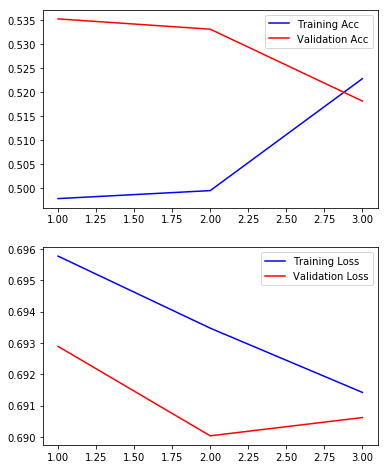



------------------------------------------------------------------------------------------------------------------------
	EVALUATE MODEL:
------------------------------------------------------------------------------------------------------------------------
4685/4685 [==============================] - 7s 1ms/step
Training Accuracy:0.5304162220168648
521/521 [==============================] - 1s 2ms/step
Testing Accuracy:0.4856046065831139

------------------------------------------------------------------------------------------------------------------------
CLASSIFICATION REPORT:
------------------------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.47      0.74      0.58       247
           1       0.52      0.25      0.34       274

   micro avg       0.49      0.49      0.49       521
   macro avg       0.50      0.50      0.46       521
weighted avg    

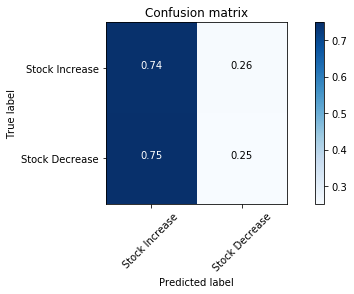

In [43]:
run_me=True
if run_me:
    clock = bs.Clock(verbose=0)
    print('---'*40)
    print('\tFITTING MODEL:')
    print('---'*40,'\n')

    clock.tic('starting keras .fit')

    num_epochs = 3
    history0 = model0.fit(X_train, y_train, epochs=num_epochs, verbose=True, 
                          validation_split=0.1, batch_size=400)#, validation_data=(X_val))
    
    
    clock.toc(f'completed {num_epochs} epochs')
    ji.evaluate_classification(model0,history0, X_train, X_test,y_train, y_test)

Reloading my_keras_functions...
Reloading functions_combined_BEST...
------------------------------------------------------------------------------------------
	TRAINING HISTORY:
------------------------------------------------------------------------------------------


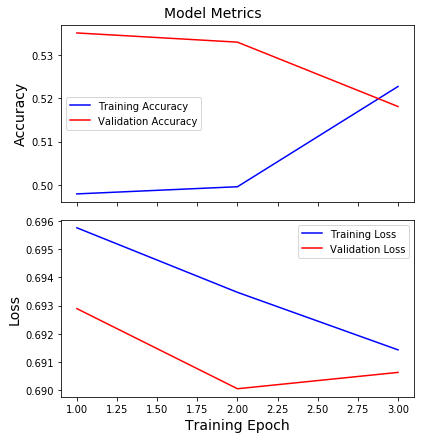



------------------------------------------------------------------------------------------
	EVALUATE MODEL:
------------------------------------------------------------------------------------------

- Evaluating Training Data:
4685/4685 [==============================] - 8s 2ms/step
    - Accuracy:0.5304
    - Loss:0.6899

- Evaluating Test Data:
521/521 [==============================] - 1s 2ms/step
    - Accuracy:0.4856
    - Loss:0.6967

------------------------------------------------------------------------------------------
	CLASSIFICATION REPORT:
------------------------------------------------------------------------------------------


index,precision,recall,f1-score,support
0,0.473008,0.744939,0.578616,247
1,0.522727,0.251825,0.339901,274
macro avg,0.497867,0.498382,0.459259,521
micro avg,0.485605,0.485605,0.485605,521
weighted avg,0.499156,0.485605,0.453073,521


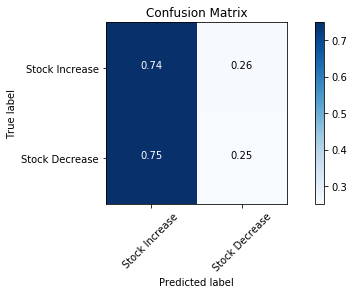


 Raw Confusion Matrix Counts:
[[184  63]
 [205  69]]


In [291]:
ji.reload([jik,ji])
df_class_report0,fig00=ji.evaluate_classification(model0,history0,
                           X_train, X_test,
                          y_train, y_test,
                          save_conf_matrix_png=False)

### GRU

In [44]:
## GRU Model
from keras import models, layers, optimizers, regularizers

model0B = models.Sequential()

## Get and add embedding_layer
embedding_layer = make_keras_embedding_layer(w2v_model, X_train)
model0B.add(embedding_layer)

# model0B.add(layers.GRU(units=50, dropout=0.5, recurrent_dropout=0.2,return_sequences=True)) 
model0B.add(layers.GRU(units=50, dropout=0.3, recurrent_dropout=0.2))

# model0.add(layers.Dense(units=50, activation='relu'))#, activation='tan' # activation='relu'))#removed 08/21

model0B.add(layers.Dense(1, activation='sigmoid'))

model0B.compile(loss='binary_crossentropy',optimizer="adam",metrics=['acc'])#,'val_acc'])#, callbacks=callbacks)
model0B.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_9 (Embedding)      (None, 116, 300)          3654600   
_________________________________________________________________
gru_2 (GRU)                  (None, 50)                52650     
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 51        
Total params: 3,707,301
Trainable params: 52,701
Non-trainable params: 3,654,600
_________________________________________________________________


--- CLOCK STARTED @:    08/23/19 - 12:04:29 PM --- 
Train on 4216 samples, validate on 469 samples
Epoch 1/5
4216/4216 [==============================] - 17s 4ms/step - loss: 0.7133 - acc: 0.4969 - val_loss: 0.6976 - val_acc: 0.4819

Epoch 00001: acc improved from 0.51044 to 0.49692, saving model to models/checkpoints/twitterNLP/twitterBLP_model1_weights.ep01-acc0.50.hdf5
Epoch 2/5
4216/4216 [==============================] - 27s 6ms/step - loss: 0.6989 - acc: 0.5209 - val_loss: 0.6986 - val_acc: 0.4989

Epoch 00002: acc did not improve from 0.49692
Epoch 3/5
4216/4216 [==============================] - 30s 7ms/step - loss: 0.6941 - acc: 0.5221 - val_loss: 0.7034 - val_acc: 0.4670

Epoch 00003: acc did not improve from 0.49692
Epoch 4/5
4216/4216 [==============================] - 13s 3ms/step - loss: 0.6937 - acc: 0.5256 - val_loss: 0.7023 - val_acc: 0.5267

Epoch 00004: acc did not improve from 0.49692
Epoch 5/5
4216/4216 [==============================] - 13s 3ms/step - loss: 0.6958

Lap #,Start Time,Duration,Label
TOTAL,08/23/19 - 12:04:29 PM,"1 min, 42.047 sec",--


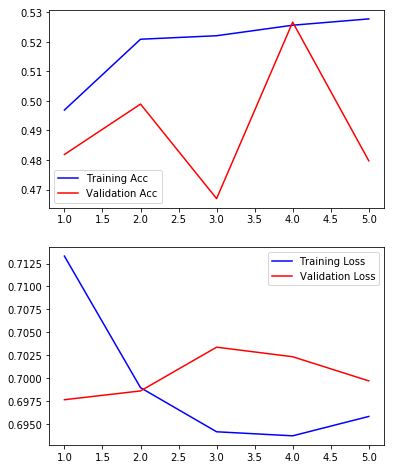



------------------------------------------------------------------------------------------------------------------------
	EVALUATE MODEL:
------------------------------------------------------------------------------------------------------------------------
4685/4685 [==============================] - 4s 924us/step
Training Accuracy:0.5338313768105929
521/521 [==============================] - 0s 944us/step
Testing Accuracy:0.5451055664476187

------------------------------------------------------------------------------------------------------------------------
CLASSIFICATION REPORT:
------------------------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.54      0.29      0.38       247
           1       0.55      0.77      0.64       274

   micro avg       0.55      0.55      0.55       521
   macro avg       0.54      0.53      0.51       521
weighted avg

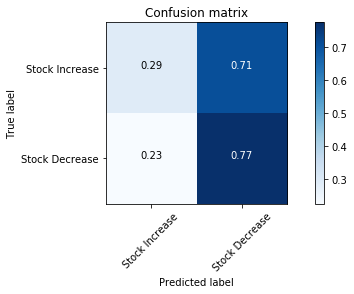

In [45]:
num_epochs = 5

clock = bs.Clock()
clock.tic()
historyB = model0B.fit(X_train, y_train, epochs=num_epochs, verbose=True, validation_split=0.1,
                     callbacks=callbacks,batch_size=300)#, validation_data=(X_val))
clock.toc()
evaluate_classification(model0B, historyB, X_train, X_test, y_train,y_test)

Reloading my_keras_functions...
Reloading functions_combined_BEST...
------------------------------------------------------------------------------------------
	TRAINING HISTORY:
------------------------------------------------------------------------------------------


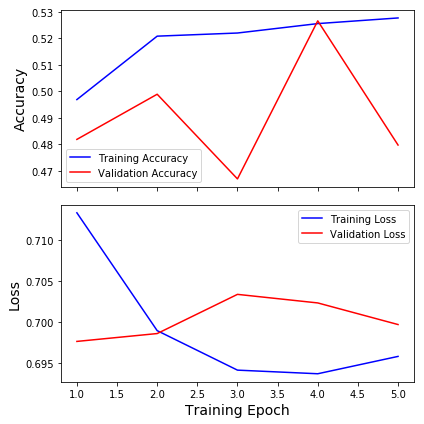



------------------------------------------------------------------------------------------
	EVALUATE MODEL:
------------------------------------------------------------------------------------------

- Evaluating Training Data:
4685/4685 [==============================] - 4s 836us/step
    - Accuracy:0.5338
    - Loss:0.6874

- Evaluating Test Data:
521/521 [==============================] - 0s 785us/step
    - Accuracy:0.5451
    - Loss:0.6875

------------------------------------------------------------------------------------------
	CLASSIFICATION REPORT:
------------------------------------------------------------------------------------------


index,precision,recall,f1-score,support
0,0.5373,0.2915,0.378,247
1,0.5478,0.7737,0.6415,274
macro avg,0.5426,0.5326,0.5097,521
micro avg,0.5451,0.5451,0.5451,521
weighted avg,0.5428,0.5451,0.5165,521


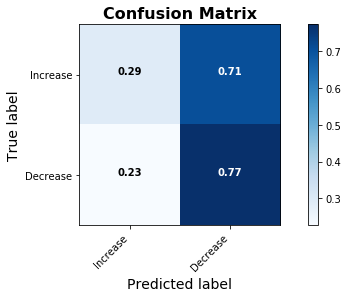

In [317]:
reload([jik,ji])
ji.evaluate_classification(model0B,historyB,
                           X_train,X_test,y_train, y_test,
                           save_conf_matrix_png=True,
                           png_filename='results/confusion_matrix_NLP_gru.png');

### NLP FIGURES 

In [146]:
twitter_df.head()
ji.display_random_tweet_by_column(twitter_df)

* TWEETED ON 2018-04-01 13:56:34

- col='content'':

      Border Patrol Agents are not allowed to properly do their job at the Border because of ridiculous liberal (Democrat) laws like Catch &amp; Release. Getting more dangerous. “Caravans” coming. Republicans must go to Nuclear Option to pass tough laws NOW. NO MORE DACA DEAL! 


- col='content_min_clean'':

      Border Patrol Agents are not allowed to properly do their job at the Border because of ridiculous liberal (Democrat) laws like Catch &amp; Release. Getting more dangerous. “Caravans” coming. Republicans must go to Nuclear Option to pass tough laws NOW. NO MORE DACA DEAL! 


- col='clean_content'':

      Border Patrol Agents are not allowed to properly do their job at the Border because of ridiculous liberal (Democrat) laws like Catch &amp; Release. Getting more dangerous. “Caravans” coming. Republicans must go to Nuclear Option to pass tough laws NOW. NO MORE DACA DEAL! 


- col='clean_content_stop'':

      border patrol 

In [147]:
# Generate wordclouds
display(twitter_df.head(2))
print(twitter_df.columns)
def get_group_texts_for_word_cloud(twitter_df, text_column='content_min_clean', groupby_column='delta_price_class'):
    
    groups = twitter_df.groupby(groupby_column).groups
    group_df_dict = {}
    for group in groups.keys():
        group_df = twitter_df.groupby(groupby_column).get_group(group)
        group_df_dict[group]= {'df':group_df}
        
    
    group_text_dict = {}
    for k,v in group_df_dict.items():
        df = v['df']
        
        from nltk import regexp_tokenize
        pattern = "([a-zA-Z]+(?:'[a-z]+)?)"
        text = df[text_column] #.apply(lambda x: regexp_tokenize(x,pattern))
        text = ','.join(text.values)
        
        text_tokens = regexp_tokenize(text, pattern)
        
        group_text_dict[k]={}
        group_df_dict[k]['text_tokens']= text_tokens
        group_text_dict[k]['tokens']=text_tokens
        
        text_joined = ' '.join(text_tokens)
        
        group_df_dict[k]['joined']=text_joined
        group_text_dict[k]['joined']=text_joined
        
    return group_df_dict, group_text_dict
#     print(text_tokens[:10])
twitter_df_groups,twitter_group_text = get_group_texts_for_word_cloud(twitter_df, 
                                                                      text_column='clean_content_stop', 
                                                                      groupby_column='delta_price_class')

,source,content,date,retweet_count,favorite_count,is_retweet,id_str,has_RT,starts_RT,content_starts_RT,...,stock_price_results,null_results,B_ts_rounded,pre_tweet_price,mins_after_tweet,B_ts_post_tweet,post_tweet_price,delta_time,delta_price,delta_price_class
date,,,,,,,,,,,,,,,,,,,,,
2017-01-20 12:31:53,Twitter for Android,It all begins today! I will see you at 11:00 A...,2017-01-20 12:31:53,70523,268372,False,822421390125043713,False,False,[],...,"{'B_ts_rounded': 2017-01-20 12:32:00, 'pre_twe...",False,2017-01-20 12:32:00,96.19,60.0,2017-01-20 13:32:00,96.37,01:00:00,0.18,pos
2017-01-20 17:51:25,Twitter for iPhone,Today we are not merely transferring power fro...,2017-01-20 17:51:25,20125,109640,False,822501803615014918,False,False,[],...,"{'B_ts_rounded': 2017-01-23 09:30:00, 'pre_twe...",False,2017-01-23 09:30:00,96.23,60.0,2017-01-23 10:30:00,96.00,01:00:00,-0.23,neg


Index(['source', 'content', 'date', 'retweet_count', 'favorite_count',
       'is_retweet', 'id_str', 'has_RT', 'starts_RT', 'content_starts_RT',
       'clean_content', 'content_min_clean', 'content_hashtags',
       'hashtag_strings', 'content_mentions', 'mention_strings',
       'clean_content_stop', 'clean_content_stop_tokens', 'case_ratio',
       'sentiment_scores', 'compound_score', 'sentiment_class', 'neg', 'neu',
       'pos', 'day', 'time', 'dayofweek', 'B_day', 'B_shifted', 'B_time',
       'B_dt_index', 'time_shift', 'B_dt_minutes', 'stock_price_results',
       'null_results', 'B_ts_rounded', 'pre_tweet_price', 'mins_after_tweet',
       'B_ts_post_tweet', 'post_tweet_price', 'delta_time', 'delta_price',
       'delta_price_class'],
      dtype='object')


In [119]:
bs.reset_pandas()
n=10
print(twitter_df_groups['neg']['text_tokens'][:n])
print(twitter_df_groups['pos']['text_tokens'][:n])

print(twitter_group_text['neg'][:n])
print(twitter_group_text['pos'][:n])

html.border has been deprecated, use display.html.border instead
(currently both are identical)


: boolean
    use_inf_as_null had been deprecated and will be removed in a future
    version. Use `use_inf_as_na` instead.

['Today', 'we', 'are', 'not', 'merely', 'transferring', 'power', 'from', 'one', 'Administration']
['It', 'all', 'begins', 'today', 'I', 'will', 'see', 'you', 'at', 'A']
['Today', 'we', 'are', 'not', 'merely', 'transferring', 'power', 'from', 'one', 'Administration']
['It', 'all', 'begins', 'today', 'I', 'will', 'see', 'you', 'at', 'A']


In [ ]:
reload([jik,ji])
# ji.compare_word_clouds(text1=' '.join(twitter_df_groups['pos']['text_tokens']),
#                        label1='Stock Market Increased',
#                      text2= ' '.join(twitter_df_groups['neg']['text_tokens'])
#                        ,label2='Stock Market Decreased',
#                       twitter_shaped = True)

Reloading functions_combined_BEST...


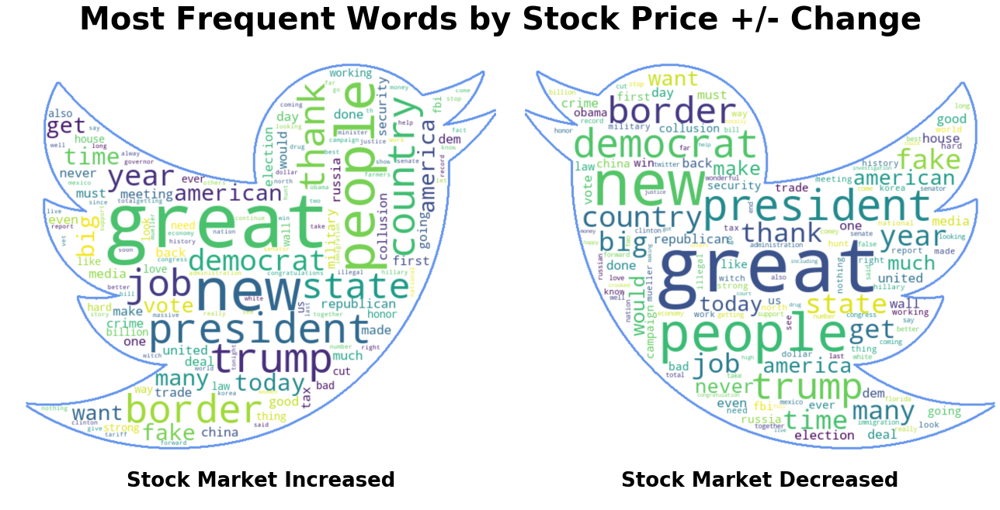

figured saved as figures/Most Frequent Words by Stock Price +_- Change.png


In [261]:
ji.compare_word_clouds(text1=twitter_df_groups['pos']['joined'],
                       label1='Stock Market Increased',
                       text2= twitter_df_groups['neg']['joined'],
                       label2='Stock Market Decreased',
                       twitter_shaped = True,
                       suptitle_y_loc=0.75, suptitle_text='Most Frequent Words by Stock Price +/- Change',
                       save_file=True,filepath_folder='figures/',
                      **{'subplot_titles_fontdict':
                         {'fontsize':26,
                         'fontweight':'bold'
                         },
                        'suptitle_fontdict':{
                         'fontsize':40,
                         'fontweight':'bold'
                        }
                        });

In [156]:
pos_dist[pos_not_neg[0]]

4

In [193]:
def compare_freq_dists_unique_words(text1=twitter_df_groups['pos']['text_tokens'],
                                    label1='Price Increased',
                                    text2=twitter_df_groups['neg']['text_tokens'],
                                    label2='Price Decreased',top_n=20, display_dfs=True,
                                    return_as_dicts=False):
    from nltk import FreqDist
    import bs_ds as bs
    import pandas as pd
    text1_dist = FreqDist(text1)#twitter_df_groups['text1']['text_tokens'])
    text1_words = list(text1_dist.keys())
    
    text2_dist = FreqDist(text2)#twitter_df_groups['text2']['text_tokens'])
    text2_words = list(text2_dist.keys())

    text2_not_text1 = {k:v for k,v in text2_dist.items() if k not in text1_dist.keys()}
    text1_not_text2 = {k:v for k,v in text1_dist.items() if k not in text2_dist.keys()}

    df_text2_words = pd.DataFrame.from_dict(text2_not_text1,orient='index',columns=['Frequency'])
    df_text1_words = pd.DataFrame.from_dict(text1_not_text2,orient='index',columns=['Frequency'])

    dfs = ['df_text2_words','df_text1_words']
    for df in dfs:
        df_ = eval(df)
        df_.sort_values('Frequency',ascending=False,inplace=True)
        name= df.split('_')[1].title()

        df_.index.name=f'Unique {name} Words'
        df_.reset_index(inplace=True)

    if display_dfs:
        dfs_1 = df_text1_words.head(top_n).style.hide_index().set_caption(label1)
        dfs_2 = df_text2_words.head(top_n).style.hide_index().set_caption(label2)
        bs.display_side_by_side(dfs_1,dfs_2)

    if return_as_dicts == False:
        return  df_text1_words, df_text2_words
    else:
        return  text1_not_text2, text2_not_text1

df_pos_words, df_neg_words = compare_freq_dists_unique_words(top_n=50)
pos_freq_dict, neg_freq_dict = compare_freq_dists_unique_words(return_as_dicts=True, display_dfs=False)

Unique Text1 Words,Frequency
wallace,9
banks,8
epa,7
roll,7
provided,7
homes,7
sri,6
tradition,6
lanka,6
marsha,5


Reloading functions_combined_BEST...


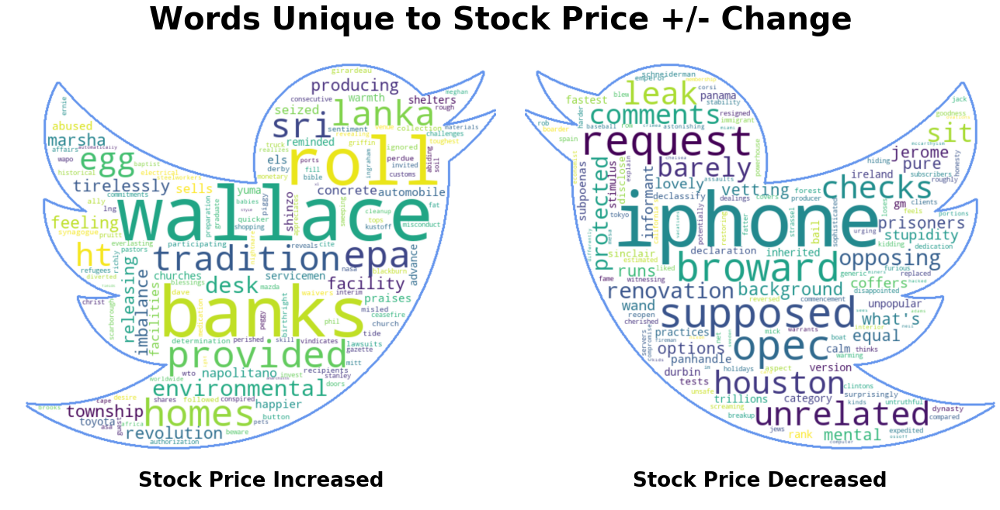

figured saved as figures/Words Unique to Stock Price +_- Change.png


In [259]:
## WORDCLOUD OF WORDS UNIQUE TO TWEETS THAT INCREASED VS DECREASED STOCK PRICE
ji.reload(ji)
ji.compare_word_clouds(text1= pos_freq_dict,label1='Stock Price Increased',
                      text2=neg_freq_dict, label2='Stock Price Decreased',
                      twitter_shaped=True, from_freq_dicts=True,suptitle_y_loc=0.75,
                      suptitle_text='Words Unique to Stock Price +/- Change',
                       save_file=True,filepath_folder='figures/',
                      **{'subplot_titles_fontdict':
                         {'fontsize':26,
                         'fontweight':'bold'
                         },
                        'suptitle_fontdict':{
                         'fontsize':40,
                         'fontweight':'bold'
                        }
                        });

In [ ]:
## Word Cloud for unique words.
# - need to create body of test 

Reloading my_keras_functions...
Reloading functions_combined_BEST...


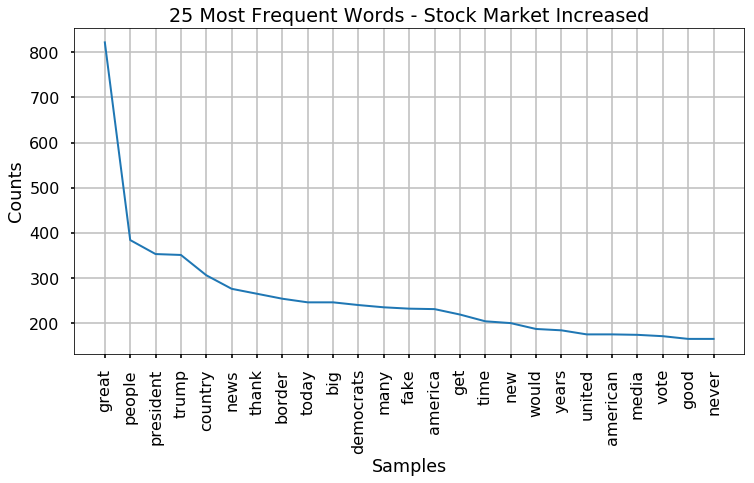

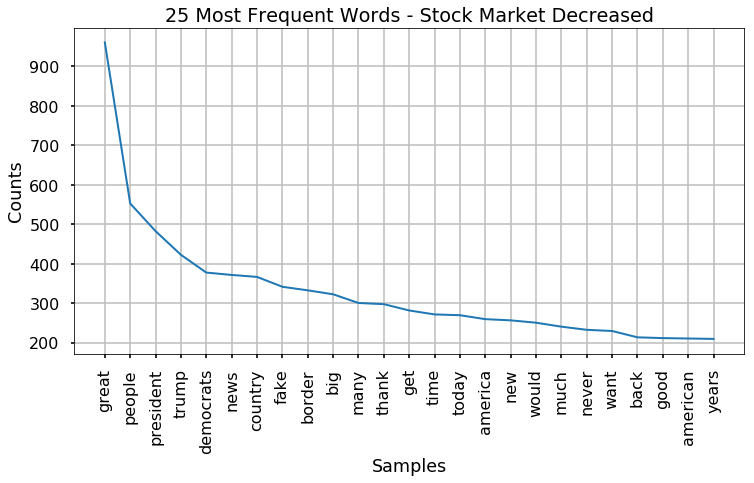

In [149]:
reload([jik,ji])
ji.compare_freq_dists(text1=twitter_df_groups['pos']['text_tokens'],
                       label1='Stock Market Increased',
                       text2= twitter_df_groups['neg']['text_tokens'],
                       label2='Stock Market Decreased',
                       top_n=25)

In [48]:
ji.reload([jik,ji])
ji.save_model_weights_params(model0B,filename_prefix='models/_best_twitter_gru50u')

Reloading my_keras_functions...
Reloading functions_combined_BEST...
Model saved as models/_best_twitter_gru50u_08-23-2019_1216pm.json
Weights saved as models/_best_twitter_gru50u_08-23-2019_1216pm_weights.h5


['models/_best_twitter_gru50u_08-23-2019_1216pm',
 'models/_best_twitter_gru50u_08-23-2019_1216pm_weights.h5',
 'models/_best_twitter_gru50u_08-23-2019_1216pm_model_layers.xlsx',
 '']

# KERAS STOCK PRICE MODELING

## KERAS MODEL 1: Using only stock `price` alone

In [36]:
# Display help menu for functions used above
ji.ihelp_menu(function_names=['ji.def_data_params',
              'ji.train_test_split_by_last_days',
              'ji.make_scaler_library',
              'ji.transform_cols_from_library'])

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

In [37]:
from keras import layers
ihelp(layers.Embedding)

------------------------------------------------------------------------------------
------ HELP ------------------------------------------------------------------------

Help on class Embedding in module keras.layers.embeddings:

class Embedding(keras.engine.base_layer.Layer)
 |  Turns positive integers (indexes) into dense vectors of fixed size.
 |  eg. [[4], [20]] -> [[0.25, 0.1], [0.6, -0.2]]
 |  
 |  This layer can only be used as the first layer in a model.
 |  
 |  # Example
 |  
 |  ```python
 |    model = Sequential()
 |    model.add(Embedding(1000, 64, input_length=10))
 |    # the model will take as input an integer matrix of size (batch, input_length).
 |    # the largest integer (i.e. word index) in the input should be
 |    # no larger than 999 (vocabulary size).
 |    # now model.output_shape == (None, 10, 64), where None is the batch dimension.
 |  
 |    input_array = np.random.randint(1000, size=(32, 10))
 |  
 |    model.compile('rmsprop', 'mse')
 |    output_array =

```python
class Embedding(Layer):
    """Turns positive integers (indexes) into dense vectors of fixed size.
    eg. [[4], [20]] -> [[0.25, 0.1], [0.6, -0.2]]

    This layer can only be used as the first layer in a model.

    # Example

    ```python
      model = Sequential()
      model.add(Embedding(1000, 64, input_length=10))
      # the model will take as input an integer matrix of size (batch, input_length).
      # the largest integer (i.e. word index) in the input should be
      # no larger than 999 (vocabulary size).
      # now model.output_shape == (None, 10, 64), where None is the batch dimension.

      input_array = np.random.randint(1000, size=(32, 10))

      model.compile('rmsprop', 'mse')
      output_array = model.predict(input_array)
      assert output_array.shape == (32, 10, 64)
    ```

    # Arguments
        input_dim: int > 0. Size of the vocabulary,
            i.e. maximum integer index + 1.
        output_dim: int >= 0. Dimension of the dense embedding.
        embeddings_initializer: Initializer for the `embeddings` matrix
            (see [initializers](../initializers.md)).
        embeddings_regularizer: Regularizer function applied to
            the `embeddings` matrix
            (see [regularizer](../regularizers.md)).
        embeddings_constraint: Constraint function applied to
            the `embeddings` matrix
            (see [constraints](../constraints.md)).
        mask_zero: Whether or not the input value 0 is a special "padding"
            value that should be masked out.
            This is useful when using [recurrent layers](recurrent.md)
            which may take variable length input.
            If this is `True` then all subsequent layers
            in the model need to support masking or an exception will be raised.
            If mask_zero is set to True, as a consequence, index 0 cannot be
            used in the vocabulary (input_dim should equal size of
            vocabulary + 1).
        input_length: Length of input sequences, when it is constant.
            This argument is required if you are going to connect
            `Flatten` then `Dense` layers upstream
            (without it, the shape of the dense outputs cannot be computed).

    # Input shape
        2D tensor with shape: `(batch_size, sequence_length)`.

    # Output shape
        3D tensor with shape: `(batch_size, sequence_length, output_dim)`.

    # References
        - [A Theoretically Grounded Application of Dropout in
           Recurrent Neural Networks](http://arxiv.org/abs/1512.05287)
    """

    @interfaces.legacy_embedding_support
    def __init__(self, input_dim, output_dim,
                 embeddings_initializer='uniform',
                 embeddings_regularizer=None,
                 activity_regularizer=None,
                 embeddings_constraint=None,
                 mask_zero=False,
                 input_length=None,
                 **kwargs):
        if 'input_shape' not in kwargs:
            if input_length:
                kwargs['input_shape'] = (input_length,)
            else:
                kwargs['input_shape'] = (None,)
        super(Embedding, self).__init__(**kwargs)

        self.input_dim = input_dim
        self.output_dim = output_dim
        self.embeddings_initializer = initializers.get(embeddings_initializer)
        self.embeddings_regularizer = regularizers.get(embeddings_regularizer)
        self.activity_regularizer = regularizers.get(activity_regularizer)
        self.embeddings_constraint = constraints.get(embeddings_constraint)
        self.mask_zero = mask_zero
        self.supports_masking = mask_zero
        self.input_length = input_length

    def build(self, input_shape):
        self.embeddings = self.add_weight(
            shape=(self.input_dim, self.output_dim),
            initializer=self.embeddings_initializer,
            name='embeddings',
            regularizer=self.embeddings_regularizer,
            constraint=self.embeddings_constraint,
            dtype=self.dtype)
        self.built = True

    def compute_mask(self, inputs, mask=None):
        if not self.mask_zero:
            return None
        output_mask = K.not_equal(inputs, 0)
        return output_mask

    def compute_output_shape(self, input_shape):
        if self.input_length is None:
            return input_shape + (self.output_dim,)
        else:
            # input_length can be tuple if input is 3D or higher
            in_lens = to_list(self.input_length, allow_tuple=True)
            if len(in_lens) != len(input_shape) - 1:
                raise ValueError(
                    '"input_length" is %s, but received input has shape %s' %
                    (str(self.input_length), str(input_shape)))
            else:
                for i, (s1, s2) in enumerate(zip(in_lens, input_shape[1:])):
                    if s1 is not None and s2 is not None and s1 != s2:
                        raise ValueError(
                            '"input_length" is %s, but received input has shape %s' %
                            (str(self.input_length), str(input_shape)))
                    elif s1 is None:
                        in_lens[i] = s2
            return (input_shape[0],) + tuple(in_lens) + (self.output_dim,)

    def call(self, inputs):
        if K.dtype(inputs) != 'int32':
            inputs = K.cast(inputs, 'int32')
        out = K.gather(self.embeddings, inputs)
        return out

    def get_config(self):
        config = {'input_dim': self.input_dim,
                  'output_dim': self.output_dim,
                  'embeddings_initializer':
                      initializers.serialize(self.embeddings_initializer),
                  'embeddings_regularizer':
                      regularizers.serialize(self.embeddings_regularizer),
                  'activity_regularizer':
                      regularizers.serialize(self.activity_regularizer),
                  'embeddings_constraint':
                      constraints.serialize(self.embeddings_constraint),
                  'mask_zero': self.mask_zero,
                  'input_length': self.input_length}
        base_config = super(Embedding, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

```

In [38]:
## IMPORT PACKAGES
from bs_ds.imports import *
import functions_combined_BEST as ji
import my_keras_functions as jik

# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload

# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()

# Reload modules in case files have been updated
reload(jik)
reload(ji)

# Suppress warnings
ji.quiet_mode()
reload(jik)
reload(ji)

Reloading my_keras_functions...
Reloading functions_combined_BEST...
Reloading my_keras_functions...
Reloading functions_combined_BEST...


<module 'functions_combined_BEST' from 'D:\\Users\\James\\Dropbox (Personal)\\CODING\\_FLATIRON\\Mod5_FinalProject\\dsc-5-capstone-project-online-ds-ft-021119\\functions_combined_BEST.py'>

#### NOTE ON PARAMETERS TO CHANGE:
- PARAMETERS TO CHANGE ARE LOCATED WITHIN HASHTAG COMMENTED BANNER SECTIONS
    - Header = `######## Name of section to be edited #######`
    - Footer = `#############################################`
    <br><br>
- **For `ji.def_data_params`:**
    - `num_test_days` = number of days left for test dataset
    - `num_train_days` = number of days prior to test_days to use as training dataset
    - `days_for_x_window` = number of days that should be analyzed together (binned for predictions)
    
    
- **For `ji.make_train_test_series_gens`:**
    - `n_features` = number of features/cols to use (for first model, =1, for second model =# of columns)
    - `batch_size` = 1 -  recommendation for timeseries predictions
    
    
- **For `_def_callbacks_and_params_`:**
    - `loss_function` for model checkpoints
    - `patience` = # of epochs without change before early stopping
    - `min_delta` = threshold for change to be considered significant (and therefore counts as new result)
    <br><br>
    
- **For `_def_callbacks_and_params_`:**
    - `loss` = Loss function for training
    -  `metrics` = Metrics to track during fit (['acc','mae'],)
    - `optimizer`= Optimizer to use during compiling ('optimizers.Nadam())

In [39]:
stock_df = ji.load_processed_stock_data()

>> File found. Loading _stock_df_with_technical_indicators.csv


In [40]:
reload([jik,ji])
################# USER PARAMETERS: Define data parameters for train_test_split  ##############
model_params={}
model_params['data_params'] = ji.def_data_params(stock_df,
                                                 num_test_days=10, num_train_days=365, 
                                                 days_for_x_window=1, verbose=0)
###############################################################################################


###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
dp = model_params['data_params']
df_train, df_test = ji.train_test_split_by_last_days(stock_df,
                                                     periods_per_day = dp['periods_per_day'], 
                                                     num_test_days   =  dp['num_test_days'],
                                                     num_train_days  =  dp['num_train_days'],
                                                     verbose=0, iplot=False)

display(df_train.head(2).style.set_caption('df_train - pre-scaling'))
# ji.display_dict_dropdown(model_params)

###### RESCALE DATA USING MinMaxScalers FIT ON TRAINING DATA's COLUMNS ######
scaler_library, df_train, model_params = ji.make_scaler_library(df_train, 
                                                                transform=True,
                                                                model_params=model_params,
                                                                verbose=2)

df_test = ji.transform_cols_from_library(df_test,col_list=None,col_scaler_dict=scaler_library,
                                                      scaler_library=scaler_library,inverse=False)

# Show transformed dataset
display( df_train.head(2).round(3).style.set_caption('training data - scaled'))#,
#         df_test.head(2).round(3).style.set_caption('test data'))



################# USER PARAMETERS: Define n_Features and batch sizes for generators  ##############
# Create timeseries generators
train_generator, test_generator, model_params =\
    ji.make_train_test_series_gens( df_train['price'], df_test['price'],
                                   n_features=1,batch_size=1, model_params=model_params,
                                   verbose=0)
ji.display_dict_dropdown(model_params)
###############################################################################################

# # ji.display_dict_dropdown(model_params)
# funcs_make_model = ['make_train_test_series_gens','def_callbacks_and_params',
#                   'def_compile_params_optimizer','make_model1'] 
# ihelp_menu(funcs_make_model)

Reloading my_keras_functions...
Reloading functions_combined_BEST...


,Date,Time,BidOpen,BidHigh,BidLow,BidClose,AskOpen,AskHigh,AskLow,AskClose,date_time_index.1,filled_timebin,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,date_time_index
date_time_index,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-15 09:30:00,01/12/2018,15:30,114,114,114,114,114,114,114,114,2018-01-12 15:30:00,True,114,112.6,111,110.7,112,1.33,1.187,113.4,108.7,114,107,2018-01-15 09:30:00
2018-01-15 10:30:00,01/12/2018,15:30,114,114,114,114,114,114,114,114,2018-01-12 15:30:00,True,114,112.6,111.1,110.7,112.1,1.34,1.209,113.5,108.7,114,107,2018-01-15 10:30:00


These columns were excluded due to incompatible dtypes.
['Date', 'Time', 'date_time_index.1', 'filled_timebin', 'date_time_index']



,Date,Time,BidOpen,BidHigh,BidLow,BidClose,AskOpen,AskHigh,AskLow,AskClose,date_time_index.1,filled_timebin,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,date_time_index
date_time_index,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-15 09:30:00,01/12/2018,15:30,0.86,0.86,0.86,0.861,0.859,0.859,0.86,0.86,2018-01-12 15:30:00,True,0.861,0.805,0.7,0.668,0.755,0.919,0.173,0.551,0.726,0.86,0.861,2018-01-15 09:30:00
2018-01-15 10:30:00,01/12/2018,15:30,0.86,0.86,0.86,0.861,0.859,0.859,0.86,0.86,2018-01-12 15:30:00,True,0.861,0.808,0.702,0.671,0.758,0.921,0.177,0.556,0.725,0.86,0.861,2018-01-15 10:30:00


------------ Dictionary Contents ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 10, 'n…

In [41]:
# ihelp(ji.make_train_test_series_gens)

In [42]:
def _def_callbacks_and_params_(model_params=None,loss_function='mae',checkpoint_mode='min',filepath=None,
                             stop_mode='min',patience=1,min_delta=.001,verbose=1):
    import functions_combined_BEST as ji
    

            ########## Define loss function and callback params ##########
    callback_params ={}
    callback_params['custom_loss_function'] = loss_function
    callback_params['ModelCheckpoint'] = {'monitor': loss_function, 'mode':checkpoint_mode}
    callback_params['EarlyStopping'] = {'monitor':loss_function, 'mode':stop_mode, 
                                        'patience':patience, 'min_delta':min_delta}

    # CREATING CALLBACKS
    from keras import callbacks

    if filepath is None:
        filepath = f"models/checkpoints/model1_weights_{ji.auto_filename_time(prefix=None)}.hdf5"

    if 'my_rmse' in loss_function:
        import functions_combined_BEST as ji
        loss_function = ji.my_rmse
#         my_rmse=my_rmse
#         loss_function = my_rmse

    # Create ModelCheckPoint
    fun_params=callback_params['ModelCheckpoint']
    checkpoint = callbacks.ModelCheckpoint(filepath=filepath, monitor=loss_function, mode=fun_params['mode'],
                                           save_best_only=True, verbose=verbose)
    # Create EarlyStopping
    fun_params=callback_params['EarlyStopping']
    early_stop = callbacks.EarlyStopping(monitor=loss_function, mode=fun_params['mode'], patience=fun_params['patience'],
                                         min_delta=fun_params['min_delta'],verbose=verbose)
    callbacks = [checkpoint,early_stop]

    if model_params is None:
        model_params=callback_params
    else:
        model_params['callbacks'] = callback_params
    return callbacks, model_params

################# USER PARAMS: Create ModelCheckpoint and early Stopping callbacks ###################
callbacks, model_params = \
    _def_callbacks_and_params_(model_params, loss_function='my_rmse',
                               checkpoint_mode='min', stop_mode = 'min',
                                patience=1, min_delta=0.001, verbose=1)
######################################################################################################


def _def_compile_params_optimizer_(loss='my_rmse',metrics=['acc','my_rmse'],optimizer='optimizers.Nadam()',model_params=None):
    ####### Specify additional model parameters
    from keras import optimizers
         
    compile_params={}
    compile_params['loss']= loss#{'my_rmse':my_rmse}
    compile_params['metrics'] = metrics#['acc',my_rmse]
    
    if type(optimizer) is str:
        optimizer_name = optimizer
        optimizer = eval(optimizer_name)
    else:
        optimizer_name = optimizer.__class__().__str__()
        
    compile_params['optimizer'] = optimizer
    compile_params['optimizer_name'] = optimizer_name#'optimizers.Nadam()'

    if model_params is not None:
        model_params['compile_params'] = compile_params
    else:
        model_params=compile_params
    
    return model_params


################## Add compiler parameters to model_params ############################
model_params = _def_compile_params_optimizer_(
    loss='my_rmse', 
    metrics=['acc','mae'],
    optimizer='optimizers.Nadam()', 
    model_params=model_params)
########################################################################################
ji.display_dict_dropdown(model_params)

------------ Dictionary Contents ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 10, 'n…

In [43]:
# Create keras model from model_params
def _make_model1_(model_params, summary=True):
    from keras.models import Sequential
    from keras.layers import Bidirectional, Dense, LSTM, Dropout
    from IPython.display import display
    from keras.regularizers import l2

    # Specifying input shape (size of samples, rank of samples?)
    n_input = model_params['input_params']['n_input']
    n_features = model_params['input_params']['n_features']
    print(f'input shape: ({n_input},{n_features}')
    input_shape=(n_input, n_features)
    
    # Create model architecture
    model = Sequential()
    model.add(LSTM(units=50, input_shape =input_shape,return_sequences=True))#,  kernel_regularizer=l2(0.01),recurrent_regularizer=l2(0.01),
#     model.add(Dropout(0.2))
    model.add(LSTM(units=50, activation='relu'))
    model.add(Dense(1))

    # load compile params and compile
    comp_params = model_params['compile_params']
    # metrics = comp_params['metrics']
    loss=comp_params['loss']
    metrics=comp_params['metrics']
    
    if 'my_rmse' in loss or 'my_rmse' in metrics:

        def check_loss_metrics_for_my_rmse(loss,metrics):
            metric_function = metrics
            loss_function = loss
            
            import functions_combined_BEST as ji
            for i,idx in enumerate(metrics):
                if 'my_rmse' in metrics[i]:
                    metric_function[i]=ji.my_rmse
            
            if 'my_rmse' in loss:
                loss_function=ji.my_rmse
                
            return loss_function, metric_function
        
        loss_function,metric_function = check_loss_metrics_for_my_rmse(loss,metrics)
        
    model.compile(loss=loss_function, metrics=metric_function,
                  optimizer=comp_params['optimizer'])##eval(comp_params['optimizer']), metrics=metrics)#optimizer=optimizers.Nadam()
    

    if summary is True:
        display(model.summary())
        
#     if return_params:
#         model_params['compile_params']['loss'] = loss_str
#         model_params['compile_params']['metrics'] = metrics_str
#         return model, model_params
    return model
#########################################################################################

model1=_make_model1_(model_params)

# Display all parameters used to create model
ji.display_dict_dropdown(model_params,title='Parameters for Keras Model')

input shape: (7,1
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 7, 50)             10400     
_________________________________________________________________
lstm_4 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 51        
Total params: 30,651
Trainable params: 30,651
Non-trainable params: 0
_________________________________________________________________


None

------------ Parameters for Keras Model ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 10, 'n…

------------------------------------------------------------
	FITTING MODEL:
------------------------------------------------------------ 

--- CLOCK STARTED @:    08/22/19 - 04:53:15 PM           Label:            --- 
Epoch 1/3
 - 37s - loss: 0.0386 - acc: 0.0012 - mean_absolute_error: 0.0386
Epoch 2/3
 - 36s - loss: 0.0239 - acc: 0.0012 - mean_absolute_error: 0.0239
Epoch 3/3
 - 34s - loss: 0.0175 - acc: 0.0012 - mean_absolute_error: 0.0175
--- TOTAL DURATION   =  1 min, 57.508 sec --- 


Lap #,Start Time,Duration,Label
TOTAL,08/22/19 - 04:53:15 PM,"1 min, 57.508 sec",




------------------------------------------------------------------------------------
	EVALUATE MODEL:
------------------------------------------------------------------------------------


,Training Data,Test Data
acc,0.0012,0.0000
loss,0.0123,0.0113
mean_absolute_error,0.0123,0.0113


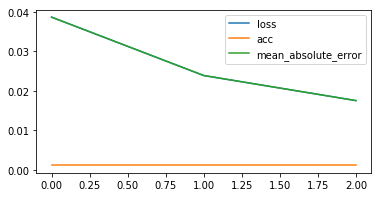

In [44]:
def _fit_model_(model,train_generator,model_params=None,epochs=None,callbacks=None,verbose=2,workers=3):
    import bs_ds as bs
    import functions_combined_BEST as ji
    from IPython.display import display

    quiet_command = ji.quiet_mode(True,True,True)
    exec(quiet_command)
    
    if model_params is None:
        model_params={}
    model_params['fit_params'] = {'epochs':epochs}#,'callbacks':callbacks}

    # Instantiating clock timer
    clock = bs.Clock()

    print('---'*20)
    print('\tFITTING MODEL:')
    print('---'*20,'\n')     
    
    # start the timer
    clock.tic('')

    # Fit the model
    fit_params = model_params['fit_params']
    if callbacks is None:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'], 
                                       verbose=2, use_multiprocessing=True, workers=3)
    else:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'],
                                       callbacks=callbacks,
                                       verbose=2,use_multiprocessing=True, workers=3)
    # model_results = model.history.history
    clock.toc('')
    
    return model,model_params,history


#########################################################################################
# Fit keras model to train_generator

model1,model_params,history =_fit_model_(model1,train_generator,
                                          model_params=model_params,
                                          epochs=3,callbacks=callbacks)

# Get results from model.evaluate_generator()
eval_results = ji.evaluate_model_plot_history(model1, train_generator, test_generator)

### Model 1 Results

In [45]:
ji.reload([jik,ji])

### PREFER NEW WAY - GET DF_MODEL FIRST THEN GET EVALUATE_REGRESSION INFORMATION?
## Get true vs pred data as a dataframe and iplot
df_model1 = ji.get_model_preds_df(model1, 
                                  test_generator = test_generator,
                                  true_train_series = df_train['price'],
                                  true_test_series = df_test['price'],
                                  include_train_data=True,
                                  model_params = model_params,
                                  preds_from_gen = True, 
                                  preds_from_train_preds = True, 
                                  preds_from_test_preds = True,
                                  plot_with_train_data=True,
                                 inverse_tf = True, 
                                  iplot = False)
# display(df_model1.head())
ji.plotly_true_vs_preds_subplots(df_model_preds=df_model1,
                                 true_train_col='true_train_price',
                                 true_test_col='true_test_price',
                                pred_test_columns='pred_from_gen')
# Get evaluation metrics
regr_evals = ji.get_evaluate_regression_dict(df_model1,
                                             metrics=['r2', 'mae', 'U'],
                                             show_results_df=True, 
                                             return_as_styled_df=True)#return_as_df=True)

Reloading my_keras_functions...
Reloading functions_combined_BEST...
63 63 63
Removed i_.
Using all columns...


,true_train_price,true_test_price,pred_from_gen,pred_from_test_preds,pred_from_train_preds
2018-01-15 09:30:00,113.98,NaN,NaN,NaN,NaN
2018-01-15 10:30:00,113.98,NaN,NaN,NaN,NaN
2018-01-15 11:30:00,113.98,NaN,NaN,NaN,NaN
2018-01-15 12:30:00,113.98,NaN,NaN,NaN,NaN
2018-01-15 13:30:00,113.98,NaN,NaN,NaN,NaN


,R²,MAE,U
Prediction Source,,,
from_gen,0.863,0.262,1.382
from_test_preds,-22.52,3.879,17.99
from_train_preds,-31.01,4.773,21


Reloading my_keras_functions...
Reloading functions_combined_BEST...


Pred Shifted,R^2,RMSE,U
-4,0.788,0.389,1.521
-3,0.833,0.357,1.389
-2,0.883,0.306,1.178
-1,0.947,0.21,0.829
0,0.863,0.345,1.382
1,0.771,0.447,1.839
2,0.708,0.508,2.094
3,0.649,0.561,2.317


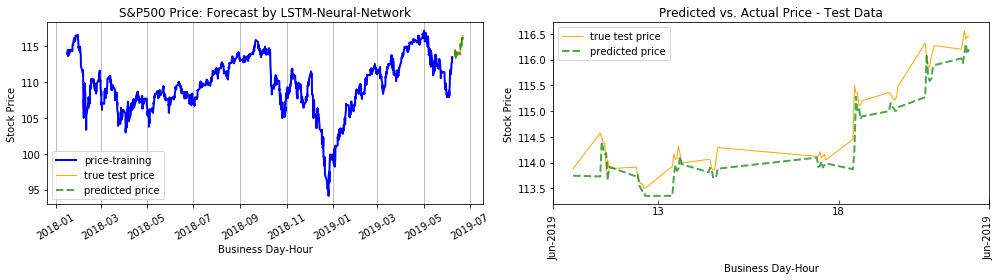

In [173]:
# Compare predictions if predictions timebins shifted
reload([jik,ji])
df_results, dfs_results1, df_shifted =\
ji.compare_eval_metrics_for_shifts(df_model1['true_test_price'],
                                   df_model1['pred_from_gen'],
                                   shift_list=np.arange(-4,4,1),
                                   true_train_series_to_add=df_model1['true_train_price'],
                                   display_results=True,
                                   display_U_info=False,
                                   return_results=True,
                                   return_styled_df=True,
                                   return_shifted_df=True)

ji.plot_true_vs_preds_subplots(df_model1['true_train_price'],
                               df_model1['true_test_price'],
                               df_model1['pred_from_gen'],subplots=True);



In [47]:
funcs_fit_eval_model=['ji.get_model_preds_df',
                      'ji.get_evaluate_regression_dict',
                      'ji.evaluate_regression',
                      'ji.compare_eval_metrics_for_shifts',
                      'ji.thiels_U'
                     ]
ihelp_menu(funcs_fit_eval_model)

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

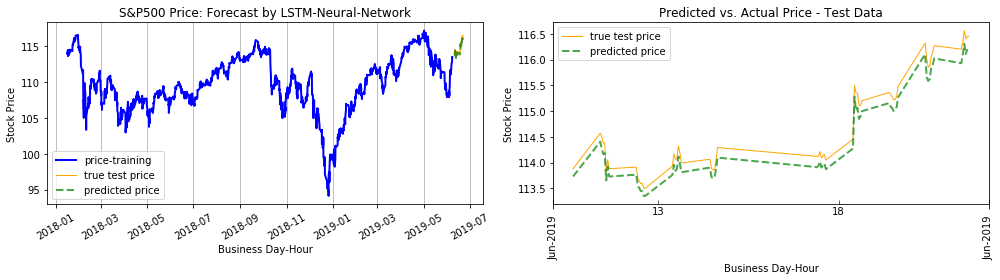

In [48]:
ji.plot_true_vs_preds_subplots(df_model1['true_train_price'],
                               df_model1['true_test_price'],
                               df_model1['pred_from_gen'].shift(-1),
                               subplots=True);


In [49]:
funs=['ji.make_qgrid_model_menu',
      'ji.display_dict_dropdown',
      'ji.save_model_weights_params']

ihelp_menu(funs)

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

In [50]:
## SHOW AND EXORT ALL MODEL LAYER CONFIGURATION PARAMS
display_summary = False
if display_summary:
    model_summary_df = ji.make_qgrid_model_menu(model1,return_df=True)
    ji.display_dict_dropdown(model_params)

In [51]:
save_model=False
if save_model ==True:
    ji.save_model_weights_params(model1,
                                 model_params=model_params,
                                 filename_prefix='models/best_stock/model1_goodU_0-2',
                                 auto_increment_name=True,
                                 auto_filename_suffix=True, 
                                 suffix_time_format='%m-%d-%y_%I%M%p',
                                 save_model_layer_config_xlsx=True)

In [ ]:
# ## GET SHIFTED RESULTS FOR PREDS FROM GENERATOR
# df_shifted = jik.compare_u_for_shifts(df_model1['true_from_gen'],df_model1['pred_from_gen'],
#                         shift_list=np.arange(-4,4,1),
#                         plot_all=False, plot_best=True,
#                         color_coded=True,return_results=False,
#                                      return_shifted_df=True)

# ## GET SHIFTED RESULTS FOR PREDS FROM TRAIN PREDS
# df_shifted2 = jik.compare_u_for_shifts(df_model1['true_from_gen'],df_model1['pred_from_train_preds'],
#                         shift_list=np.arange(-4,4,1),
#                         plot_all=False, plot_best=True,
#                         color_coded=True,return_results=False,
#                                      return_shifted_df=True)
# # res_df = ji.compare_time_shifted_model(df_model1,)

# res_df_gen = ji.compare_time_shifted_model(df_model1,true_colname='true_from_gen',
#                                       pred_colname='pred_from_gen',show_U_info=False,
#                                           caption='From Generator')

# res_df_from_train = ji.compare_time_shifted_model(df_model1,true_colname='true_from_train_preds',
#                                       pred_colname='pred_from_train_preds', show_U_info=False,
#                                                  caption='From Preds of Train Preds')

# res_df_from_test = ji.compare_time_shifted_model(df_model1,true_colname='true_from_test_preds',
#                                       pred_colname='pred_from_test_preds', show_U_info=False,
#                                                  caption='From Preds of Test Preds')

In [ ]:
# ##### SUPER IMPORTANT CELL
# scaled_train_data = df_train['price']
# scaled_test_data = df_test['price']

# get_model_preds_from_preds= ji.get_model_preds_from_preds
# def get_preds_from_preds(model1,scaled_train_data, scaled_test_data,
#                          model_params=None, n_input=None, n_features=None, 
#                          build_preds_from_train=True, return_df=True,suffix=None):
    
#     """ Gets predictions from model using using its own predictions as the subsequent input.
#     Must provide a model_params dictionary with 'input_params' OR must define ('n_input','n_features').
    
#     * IF build_preds_from_train is True:
#         1. starting true time series for predictions is the last rows [-n_input:] from training data.
#         2. output predicitons will be the same length as the input scaled_test_data
    
#     * IF build_preds_from_train is False:
#         1. starting true time series for predictions is the first rows [:n_input] from test data.
#         2. output predicitons will be shorter by n_input # of rows
#         """
#     test_predictions = []
#     first_eval_batch=[]
#     index_tracker = []
    
#     if model_params is not None:
#         n_input= model_params['input_params']['n_input']
#         n_features = model_params['input_params']['n_features']

#     if model_params is None:
#         if n_input is None or n_features is None:
#             raise Exception('Must provide model params or define n_input and n_features')
        

#     preds_out = [['i','index','pred']]
    
#     # SAVING COPY OF INPUT TEST DATA
#     scaled_test_series = scaled_test_data.copy() 

#     ## SAVING TRAIN AND TEST DATA INDICES AND VALUES
#     train_data_index = scaled_train_data.index
#     scaled_train_data = scaled_train_data.values
#     test_data_index = scaled_test_data.index
#     scaled_test_data = scaled_test_data.values
    
    
#     ## PREPARE THE FIRST EVAL BATCH TIMESERIES FROM TRAIN OR TEST DATA
#     # Change parameters depending on if from train or test data
#     if build_preds_from_train:
        
#         # If using trianing data loop through full test data
#         loop_length = range(len(scaled_test_data))
        
#         # take the last window size of data from training data 
#         first_eval_batch = scaled_train_data[-n_input:]
#         first_batch_idx = train_data_index[-n_input:]
        
#         # set the true index to test_data_index
#         true_index_out = test_data_index
        
#     # Set the loop to be from n_input # of rows into test_data
#     else:
#         loop_length = range(n_input,len(scaled_test_data))
#         first_eval_batch = scaled_test_data[:n_input]
#         true_index_out =  test_data_index[n_input:]
      
    
#     # reshape first batch of data for model.predict 
#     current_batch = first_eval_batch.reshape((1, n_input, n_features))

    
#     ## LOOP THROUGH REMAINING TIMEBINS USING CURRENT PREDICITONS AS NEW DATA FOR NEXT
#     for i in loop_length:

#         # get prediction 1 time stamp ahead ([0] is for grabbing just the number instead of [array])
#         current_pred = model.predict(current_batch)[0]        
#         # store prediction
#         test_predictions.append(current_pred) 

#         # update batch to now include prediction and drop first value
#         current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)
        
#         ## Append the data to the output df list
#         preds_out.append([i,test_data_index[i],current_pred[0]])


#     ## If returning a dataframe,prepare and rename with suffix
#     if return_df:
#         res_df = bs.list2df(preds_out)
#         res_df['index'] = pd.to_datetime(res_df['index'])
#         res_df.set_index('index',inplace=True)
        
#         # adding true price
#         res_df['true'] = scaled_test_series.loc[true_index_out]
#         res_df=res_df[['i','true','pred']]
        
#         if suffix is not None:
#             colnames = [name+suffix for name in res_df.columns]
#         else:
#             colnames = res_df.columns
            
#         res_df.columns=colnames
#         return res_df #test_predictions, checks
    
#     # Else just return array of predictions
#     else:
#         return test_predictions

    
    
# def get_model_preds_from_gen(model,test_generator,true_test_data,model_params=None,
#                        n_input=None, n_features=None, suffix=None, return_df=False):
#         """
#         Gets prediction from model using the generator's timeseries using model.predict_generator()
#         Must provide a model_params dictionary with 'input_params' OR must define ('n_input','n_features').

#         """
#         if model_params is not None:
#             n_input= model_params['input_params']['n_input']
#             n_features = model_params['input_params']['n_features']

#         if model_params is None:
#             if n_input is None or n_features is None:
#                 raise Exception('Must provide model params or define n_input and n_features')

#         # GET TRUE VALUES AND DATETIME INDEX FROM GENERATOR
        
#         # Get true time index from the generator's start_index and end_index 
#         gen_index = true_test_data.index[test_generator.start_index:test_generator.end_index+1]
#         gen_true_targets = test_generator.targets[test_generator.start_index:test_generator.end_index+1]
        
        
#         # Generate predictions from the test_generator
#         gen_preds = model.predict_generator(test_generator)
#         gen_preds_flat = gen_preds.ravel()
        
#         gen_true_targets = gen_true_targets.ravel()
        
        
#         # RETURN OUTPUT AS DATAFRAME OR ARRAY OF PREDS
#         if return_df:
#             # Combine the outputs
#             gen_pred_df = pd.DataFrame({'index':gen_index,'true':gen_true_targets,'pred':gen_preds_flat})
#             gen_pred_df['index'] = pd.to_datetime(gen_pred_df['index'])
#             gen_pred_df.set_index('index',inplace=True)

#             if suffix is not None:
#                 colnames = [name+suffix for name in gen_pred_df.columns]
#             else:
#                 colnames = gen_pred_df.columns
#             return gen_pred_df
#         else:
#             return gen_preds


# def compare_model_pred_methods(model, true_train_series,true_test_series, test_generator=None,
#                                model_params=None, n_input=None, n_features=None, from_gen=True,
#                                from_train_series = True, from_test_series=True, 
#                                iplot=True, plot_with_train_data=True,return_df=True, inverse_tf=True):
#     """ Gets predictions for training data from the 3 options: 
#     1) from generator  --  len(output) = (len(true_test_series)-n_input)
#     2) from predictions on test data  --  len(output) = (len(true_test_series)-n_input)
#     3) from predictions on train data -- len(true_test_series)
#     """
#         if model_params is not None:
#             n_input= model_params['input_params']['n_input']
#             n_features = model_params['input_params']['n_features']

#         if model_params is None:
#             if n_input is None or n_features is None:
#                 raise Exception('Must provide model params or define n_input and n_features')
                
#         if from_gen is True and test_generator is None:
#             raise Exception('If from_gen=True, must provide generator.')

                
#         ### GET the 3 DIFERENT TYPES OF PREDICTIONS    
#         df_list = []
#         if from_gen:
#             gen_df = ji.get_model_preds_from_gen(model, test_generator,true_test_series,
#                                                  model_params=model_params, n_input=n_input, n_features=n_features, 
#                                                 suffix='_from_gen',return_df=True)    
#             df_list.append(gen_df)

#         if from_test_series:
#             func_df_from_test = ji.get_model_preds_from_preds(model, true_train_series,true_test_series,
#                                                           model_params=model_params, n_input=n_input, 
#                                                           n_features=n_features, suffix='_from_test',
#                                                           build_preds_from_train=False, return_df=True)
#             df_list.append(func_df_from_test)

#         if from_train_series:
#             func_df_from_train  = ji.get_model_preds_from_preds(model,true_train_series,true_test_series,
#                                                                 model_params=model_params, n_input=n_input,
#                                                                 suffix='_from_train', build_preds_from_train=True,
#                                                             return_df=True)
#             df_list.append(func_df_from_train)

#         # bs.display_side_by_side(func_df,func_df_from_train)

#         df_all_preds = pd.concat([df for df in df_list],axis=1)
#         df_all_preds = bs.drop_cols(df_all_preds,['i_'])


#         if inverse_tf:
#             df_out = ji.transform_cols_from_library(df_all_preds,single_scaler=model_params['scaler_library']['price'],inverse=True)
#         else:
#             df_out = df_all_preds

#         if iplot:
#             if plot_with_train_data is False:
#                 ji.plotly_time_series(df_out)
#             else:
#                 true_train_price = ji.inverse_transform_series(true_train_series,model_params['scaler_library']['price'])
#                 df_plot = pd.concat([true_train_price,df_out],axis=1)
#                 ji.plotly_time_series(df_plot)

#         if return_df:
#             return df_out

In [ ]:
# df_all_preds = ji.compare_model_pred_methods(model1, true_train_series=df_train['price'],
#                                              true_test_series=df_test['price'], test_generator=test_generator,
#                                              model_params=model_params,  n_input=None, n_features=None,
#                                              from_gen=True, from_train_series = True, from_test_series=True,
#                                              iplot=True, plot_with_train_data=True, return_df=True, inverse_tf=True) 


In [ ]:
stop

## 🧧BOOKMARK🧧 EXPORTING RESULTS

In [220]:
table_styles = [dict(selector='td,body',props=[('border','1px solid black'),
                                         ('border-collapse','collapse')]),
                 dict(selector='td:nth-child(1)', props=[('font-weight','bold')]),
                dict(selector='th',props=[('border','1px solid black'),
                                         ('border-collapse','collapse')]),                
                dict(selector='tr :nth-child(:even)',props=[('background-color','blue')])
                ]

# dfs_results1.set_table_styles(table_styles) 

html_df = dfs_results1.set_table_styles(table_styles).render()
with open('assets/model_1_time_shifted_results_to_test_1.html','w') as file:
    file.write(html_df)
    

from IPython.display import HTML
HTML(html_df)

Pred Shifted,R^2,RMSE,U
-4,0.788,0.389,1.521
-3,0.833,0.357,1.389
-2,0.883,0.306,1.178
-1,0.947,0.21,0.829
0,0.863,0.345,1.382
1,0.771,0.447,1.839
2,0.708,0.508,2.094
3,0.649,0.561,2.317


In [225]:
HTML(df_results.to_html(index=False))
df2png(df_results.to_html(index=False))

Finished. All required folders have been created.
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               



In [ ]:
# table_css = """
table.dataframe{
    border: 1px solid black;
    
                                         ('border-collapse','collapse')]),
                 dict(selector='td:nth-child(1)', props=[('font-weight','bold')]),
                dict(selector='th',props=[('border','1px solid black'),
                                         ('border-collapse','collapse')]),                
                dict(selector='tr :nth-child(:even)',props=[('background-color','blue')])
                ]
                
                """

In [162]:
run_me =True
dfs_test = dfs_results1

html_df = dfs_test.render()
pprint(html_df)

('<style  type="text/css" >\n'
 '    #T_5fccf468_c53c_11e9_9e50_f48e38b6371frow0_col0 {\n'
 '            text-align:  center;\n'
 '            text-align:  center;\n'
 '            text-align:  center;\n'
 '            text-align:  center;\n'
 '        }    #T_5fccf468_c53c_11e9_9e50_f48e38b6371frow0_col1 {\n'
 '            text-align:  center;\n'
 '            text-align:  center;\n'
 '            text-align:  center;\n'
 '            text-align:  center;\n'
 '        }    #T_5fccf468_c53c_11e9_9e50_f48e38b6371frow0_col2 {\n'
 '            background-color:  #78c679;\n'
 '            color:  #000000;\n'
 '            text-align:  center;\n'
 '            background-color:  #78c679;\n'
 '            color:  #000000;\n'
 '            text-align:  center;\n'
 '            background-color:  #78c679;\n'
 '            color:  #000000;\n'
 '            text-align:  center;\n'
 '            background-color:  #78c679;\n'
 '            color:  #000000;\n'
 '            text-align:  center;\n'

In [228]:
# Commented this out so that computers without imgkit can run the notebook. 
# Export pandas tables to images using imgkit and wkhtmltopdf
import imgkit
import os 
import time

reload([ji])
def df2png(df, filename_prefix = 'results/summary_table',sep='_',filename_suffix='',file_ext='.png',
           auto_filename_suffix=True, check_if_exists=True,save_excel=True,auto_increment_name=True, CSS=''):
    '''Accepts a dataframe and a filename (without extention). Saves an image of the stylized table.'''
    # Now save the css and html dataframe to the same text file before conversion
    import imgkit
    import os 
    import time
    import functions_combined_BEST as ji
    

    
    ## Specify file_format for imgkit
    if '.png' not in file_ext:
        file_format = file_ext.replace('.','')
        imgkitoptions = {'format':file_format}
    else:
        imgkitoptions = {'format':'png'}
     
    ## Provide path to required wkhtmltoimage.exe
    exe_path = "C:\\Program Files\\wkhtmltopdf\\bin\\wkhtmltoimage.exe"
    imgconfig = imgkit.config(wkhtmltoimage = exe_path) #'C:/Users/james/Anaconda3/envs/learn-env-ext/Lib/site-packages/wkhtmltopdf/bin/wkhtmltoimage.exe')

    ## CREATE ANY MISSING FOLDERS FOR DESIRED FOLDERPATH
    ji.create_required_folders(filename_prefix)
    
    ## CREATING FILENAMES
    # add auto suffix
    if auto_filename_suffix:
        suffix_time_format = '%m-%d-%Y_%I%M%p'
        filename = ji.auto_filename_time(prefix=filename_prefix, sep=sep, timeformat=suffix_time_format )
    else:
        filename = filename_prefix

    ## Add suffix to filename
    full_filename = filename + sep + filename_suffix + file_ext


    ## CHECK_IF_FILE_EXISTS
    if check_if_exists:
        import os
        import pandas as pd
        current_files = os.listdir()
        
        # check if file already exists and raise errror if no auto_increment_name
        if full_filename in current_files and auto_increment_name==False:
            raise Exception('Filename already exists')
        
        # if file already exists, find version number and increase by 1 
        elif full_filename in current_files and auto_increment_name==True:
        
            # check if filename ends in version #
            import re
            num_ending = re.compile(r'[vV].?(\d+)')#.json')
            
            curr_file_num = num_ending.findall(full_filename)
            if len(curr_file_num)==0:
                v_num = '_v01'
            else:
                v_num = f"_{int(curr_file_num)+1}"

            ## CHANGE FOR FILE EXTENTSION TYPE
            full_filename = filename +sep+ v_num +file_ext
            print(f'{filename} already exists... incrementing filename to {full_filename}.')

    
    
    ## Make temp filename for css/html text file export
    base_filename = full_filename.split('.')[0]
    text_file_name = base_filename +'_to_convert.html'
    
    ## Add text_file_name to Path [cant remmeber why?]
    from pathlib import Path
    config = Path(text_file_name)    
    if config.is_file():
        # Store configuration file values
        os.remove(text_file_name)

    
    ### GET HTML TABLE TO OUTPUT
    # Check df is styler or normal df
    if isinstance(df,pd.io.formats.style.Styler):
        html_df = df.render()
        
        if save_excel == True:
            df.to_excel(base_filename+'.xlsx')
            
    elif isinstance(df, pd.DataFrame):
        html_df = df.to_html()
        
        if save_excel == True:
            df.to_excel(base_filename+'.xlsx')
    elif isinstance(df,str):
        html_df=df

    
    ## Create text file with CSS and dataframe as cs
    with open(text_file_name,'a') as text_file:
        text_file.write(CSS)
        text_file.write(html_df)
#         text_file.close()

    ## Create image filename and produce figure from text file
    imagename = base_filename+file_ext
    imgkit.from_file(text_file_name, imagename, options = imgkitoptions, config=imgconfig)
    
    # report
    print('')

    ## delete temporary text file
    os.remove(text_file_name)
    
    return 


if run_me:
    df2png(dfs_results1,filename_prefix='results/model1_eval_metrics_shifted')

Reloading functions_combined_BEST...
Finished. All required folders have been created.
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               



In [165]:
import imgkit
exe_path = "C:\\Program Files\\wkhtmltopdf\\bin\\wkhtmltoimage.exe"
imgconfig = imgkit.config(wkhtmltoimage = exe_path)
filename = ji.auto_filename_time(prefix='assets/model_1_results')
filename+='.png'
print(filename)

imgkit.from_string(html_df,filename,options={'format':'png'}, config=imgconfig)

assets/model_1_results_08-22-2019_0825pm.png
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


True

In [120]:
# def get_css():
#     css_style = """
#     table.dataframe{
#         text-align: center;
#     }
#     table.dataframe td, table.dataframe th { 
#         border-collapse:collapse;
#     }
#     table.dataframe th {
#         text-align: center;
#         background-color: #000000;
#         color: #ffffff;
#         font-weight: bold;
#         font-size: 12pt
#         font-weight: bold;
#         padding: 0.5em 0.5em;
#     }
#     table.dataframe td:not(:th){
#         background-color: gainsboro;
#         font-size: 10pt;
#         padding: 0.7em 1em;
#     }
#     table.dataframe tr:not(:last-child) {
#         border-bottom: 1px solid gainsboro;
#     }
#     table.dataframe {
#         background-color: gainsboro; 
#         border: 2px solid black;
#     }
#     table.dataframe th:not(:empty), table.dataframe td{
#         border-right: 1px solid white;
#     }
#     table.dataframe td:not(:empty){
#         text-align: center
#     }
#     """
#     return css_style

In [121]:
dfs_test

Pred Shifted,R²,RMSE,U
-4,0.788,0.389,1.521
-3,0.833,0.357,1.389
-2,0.883,0.306,1.178
-1,0.947,0.21,0.829
0,0.863,0.345,1.382
1,0.771,0.447,1.839
2,0.708,0.508,2.094
3,0.649,0.561,2.317


In [122]:
print(dfs_test.render())

<style  type="text/css" >
    #T_363ca3a4_c524_11e9_8c86_f48e38b6371frow0_col0 {
            text-align:  center;
            text-align:  center;
            text-align:  center;
            text-align:  center;
            text-align:  center;
            text-align:  center;
        }    #T_363ca3a4_c524_11e9_8c86_f48e38b6371frow0_col1 {
            text-align:  center;
            text-align:  center;
            text-align:  center;
            text-align:  center;
            text-align:  center;
            text-align:  center;
        }    #T_363ca3a4_c524_11e9_8c86_f48e38b6371frow0_col2 {
            background-color:  #78c679;
            color:  #000000;
            text-align:  center;
            background-color:  #78c679;
            color:  #000000;
            text-align:  center;
            background-color:  #78c679;
            color:  #000000;
            text-align:  center;
            background-color:  #78c679;
            color:  #000000;
            text-ali

In [123]:
# if run_me:
#     # display styled df
#     display(dfs_results1)

#     # can exports style, data separately
#     style_used = dfs_results1.export()
#     df_from_styler = dfs_results1.data

#     # Can convert stylers to html using .render()
#     html_table = dfs_results1.render()


#     display(dfs_results1.data)

In [171]:
pd.set_option('display.html.border',2)


In [172]:
## UPDATE STYLE
dfs_test.set_table_styles(
[dict(selector="th", props=[("background-color", "black"),
                            ("color","white")]),
 dict(selector= "th,td", props=[('border', '1px solid black')]),
 #('border','2px'), ('border-color','black')
 dict(selector='td:nth-child(1)', props=[('font-weight','bold')]),

]   
)
dfs_test

Pred Shifted,R^2,RMSE,U
-4,0.788,0.389,1.521
-3,0.833,0.357,1.389
-2,0.883,0.306,1.178
-1,0.947,0.21,0.829
0,0.863,0.345,1.382
1,0.771,0.447,1.839
2,0.708,0.508,2.094
3,0.649,0.561,2.317


In [142]:
df2png(dfs_test,filename_prefix='results/model1_eval_metrics_shifted',auto_filename_suffix=False,
      auto_increment_name=False)

Finished. All required folders have been created.
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               



<img src='results/model1_eval_metrics_shifted_.png'>

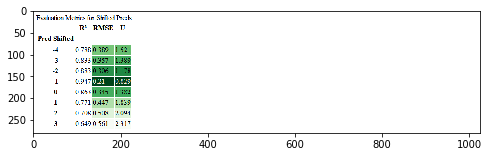

In [62]:
img= plt.imread('results/model1_eval_metrics_shifted_.png')
plt.imshow(img)

In [ ]:
html_df = df.to_html(notebook=True,justify='center')
from bs4 import BeautifulSoup
soup=BeautifulSoup(html_df,'lxml')
# with open('html_df.html','w') as file:
#     file.write(html_df)

table_style=soup.find_all('style')
table[0]

In [ ]:
try_css = """
<style >
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
"""
reset_css = ' '
HTML("<style>{}</style>".format(reset_css))

In [ ]:
print(dfs_results1.data.to_html())

In [ ]:
# run_me=True
# if run_me:
from IPython.display import HTML
my_file = "df_css_style.css"
blog_file = "blog_css.css"
default = "default_html_for_df.html"

with open(my_file,'r') as file:
    my_css = file.read()

test_css = 'table.dataframe th{background-color:red}'
HTML("<style>{}</style>".format(test_css))#my_css))

In [ ]:
import json
json.loads(my_css)
# type(my_css)

In [ ]:
ihelp(dfs_results1,True,False)

In [ ]:
# display(regr_evals,dfs_results1)
dfs_results1.data

In [ ]:
dfs_html = dfs_results1.render()
pprint(dfs_html)

## KERAS MODEL 2: Using stock price + technical indicators


In [ ]:
## IMPORT PACKAGES
from bs_ds.imports import *
import functions_combined_BEST as ji
import my_keras_functions as jik

# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload

# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()

# Reload modules in case files have been updated
reload(jik)
reload(ji)

## check for stock_df
try: stock_df
except NameError:
    stock_df= None
    
if stock_df is None:
    stock_df = ji.load_processed_stock_data()
    
## check for df_train 
try: df_train
except NameError:
    df_train = None
try: df_test
except NameError:
    df_test = None
    
if df_train is None or df_test is None:
    use_prior_train_test_data = False
    print('Training or test data not found')
else:
    use_prior_train_test_data =  True

In [ ]:
stock_df = raw_stock_df[[
    'price','ma7','ma21','26ema','12ema','MACD','20sd',
    'upper_band','lower_band','ema','momentum']].copy()#,'filled_timebin'
stock_df.dropna(inplace=True)
stock_df.head()

In [ ]:
use_prior_train_test_data=False
if use_prior_train_test_data == False:
    print('Making new df_train and df_test')
    ################# USER PARAMETERS: Define data parameters for train_test_split  ##############
    model_params={}
    model_params['data_params'] = ji.def_data_params(stock_df,
                                                     num_test_days=10, num_train_days=365, 
                                                     days_for_x_window=2, verbose=0)
    ###############################################################################################


    ###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
    dp = model_params['data_params']
    df_train, df_test = ji.train_test_split_by_last_days(stock_df,
                                                         periods_per_day = dp['periods_per_day'], 
                                                         num_test_days   =  dp['num_test_days'],
                                                         num_train_days  =  dp['num_train_days'],
                                                         verbose=0, iplot=False)

    display(df_train.head(2).style.set_caption('df_train - pre-scaling'))
    # ji.display_dict_dropdown(model_params)

    ###### RESCALE DATA USING MinMaxScalers FIT ON TRAINING DATA's COLUMNS ######
    scaler_library, df_train, model_params = ji.make_scaler_library(df_train, 
                                                                    transform=True,
                                                                    model_params=model_params,
                                                                    verbose=2)

    df_test = ji.transform_cols_from_library(df_test,col_list=None,col_scaler_dict=scaler_library,
                                                          scaler_library=scaler_library,inverse=False)

    # Show transformed dataset
display( df_train.head(2).round(3).style.set_caption('training data - scaled'))#,
    #         df_test.head(2).round(3).style.set_caption('test data'))



################# USER PARAMETERS: Define n_Features and batch sizes for generators  ##############
# Create timeseries generators
train_generator, test_generator, model_params =\
    ji.make_train_test_series_gens(train_data_series=df_train, test_data_series=df_test,y_cols='price',
                                   n_features=len(df_train.columns),batch_size=1, model_params=model_params,
                                   verbose=0)
ji.display_dict_dropdown(model_params)

train_generator[0][0].shape

In [ ]:
###############################################################################################

# # ji.display_dict_dropdown(model_params)
# funcs_make_model = ['make_train_test_series_gens','def_callbacks_and_params',
#                   'def_compile_params_optimizer','make_model1'] 
# ihelp_menu(funcs_make_model)

def _def_callbacks_and_params_(model_params=None,loss_function='mae',checkpoint_mode='min',filepath=None,
                             stop_mode='min',patience=1,min_delta=.005,verbose=1):
    import functions_combined_BEST as ji
    

            ########## Define loss function and callback params ##########
    callback_params ={}
    callback_params['custom_loss_function'] = loss_function
    callback_params['ModelCheckpoint'] = {'monitor': loss_function, 'mode':checkpoint_mode}
    callback_params['EarlyStopping'] = {'monitor':loss_function, 'mode':stop_mode, 
                                        'patience':patience, 'min_delta':min_delta}

    # CREATING CALLBACKS
    from keras import callbacks

    if filepath is None:
        filepath = f"models/checkpoints/model1_weights_{ji.auto_filename_time(prefix=None)}.hdf5"

    if 'my_rmse' in loss_function:
        import functions_combined_BEST as ji
        loss_function = ji.my_rmse
#         my_rmse=my_rmse
#         loss_function = my_rmse

    # Create ModelCheckPoint
    fun_params=callback_params['ModelCheckpoint']
    checkpoint = callbacks.ModelCheckpoint(filepath=filepath, monitor=loss_function, mode=fun_params['mode'],
                                           save_best_only=True, verbose=verbose)
    # Create EarlyStopping
    fun_params=callback_params['EarlyStopping']
    early_stop = callbacks.EarlyStopping(monitor=loss_function, mode=fun_params['mode'], patience=fun_params['patience'],
                                         min_delta=fun_params['min_delta'],verbose=verbose)
    callbacks = [checkpoint,early_stop]

    if model_params is None:
        model_params=callback_params
    else:
        model_params['callbacks'] = callback_params
    return callbacks, model_params

################# USER PARAMS: Create ModelCheckpoint and early Stopping callbacks ###################
callbacks, model_params = \
    _def_callbacks_and_params_(model_params, loss_function='my_rmse',
                               checkpoint_mode='min', stop_mode = 'min',
                                patience=1, min_delta=0.005, verbose=1)
######################################################################################################


def _def_compile_params_optimizer_(loss='my_rmse',metrics=['acc','my_rmse'],optimizer='optimizers.Nadam()',model_params=None):
    ####### Specify additional model parameters
    from keras import optimizers
         
    compile_params={}
    compile_params['loss']= loss#{'my_rmse':my_rmse}
    compile_params['metrics'] = metrics#['acc',my_rmse]
    
    if type(optimizer) is str:
        optimizer_name = optimizer
        optimizer = eval(optimizer_name)
    else:
        optimizer_name = optimizer.__class__().__str__()
        
    compile_params['optimizer'] = optimizer
    compile_params['optimizer_name'] = optimizer_name#'optimizers.Nadam()'

    if model_params is not None:
        model_params['compile_params'] = compile_params
    else:
        model_params=compile_params
    
    return model_params


################## Add compiler parameters to model_params ############################
model_params = _def_compile_params_optimizer_(
    loss='my_rmse', 
    metrics=['acc','mae'],
    optimizer='optimizers.Nadam()', 
    model_params=model_params)
########################################################################################
ji.display_dict_dropdown(model_params)

# Create keras model from model_params
def _make_model2_(model_params, summary=True):
    from keras.models import Sequential
    from keras.layers import Bidirectional, Dense, LSTM, Dropout
    from IPython.display import display
    from keras.regularizers import l2

    # Specifying input shape (size of samples, rank of samples?)
    n_input = model_params['input_params']['n_input']
    n_features = model_params['input_params']['n_features']
    print(f'input shape: ({n_input},{n_features}')
    input_shape=(n_input, n_features)
    
    # Create model architecture
    model = Sequential()
    model.add(LSTM(units=50, input_shape =input_shape,return_sequences=True))#,  kernel_regularizer=l2(0.01),recurrent_regularizer=l2(0.01),
    model.add(Dropout(0.2))
    model.add(LSTM(units=50, activation='relu'))
    model.add(Dense(1))

    # load compile params and compile
    comp_params = model_params['compile_params']
    # metrics = comp_params['metrics']
    loss=comp_params['loss']
    metrics=comp_params['metrics']
    
    if 'my_rmse' in loss or 'my_rmse' in metrics:

        def check_loss_metrics_for_my_rmse(loss,metrics):
            metric_function = metrics
            loss_function = loss
            
            import functions_combined_BEST as ji
            for i,idx in enumerate(metrics):
                if 'my_rmse' in metrics[i]:
                    metric_function[i]=ji.my_rmse
            
            if 'my_rmse' in loss:
                loss_function=ji.my_rmse
                
            return loss_function, metric_function
        
        loss_function,metric_function = check_loss_metrics_for_my_rmse(loss,metrics)
        
    model.compile(loss=loss_function, metrics=metric_function,
                  optimizer=comp_params['optimizer'])##eval(comp_params['optimizer']), metrics=metrics)#optimizer=optimizers.Nadam()
    

    if summary is True:
        display(model.summary())
        
#     if return_params:
#         model_params['compile_params']['loss'] = loss_str
#         model_params['compile_params']['metrics'] = metrics_str
#         return model, model_params
    return model
#########################################################################################

model2=_make_model2_(model_params)

# Display all parameters used to create model
ji.display_dict_dropdown(model_params,title='Parameters for Keras Model')

In [ ]:
_3

In [ ]:
def _fit_model_(model,train_generator,model_params=None,epochs=None,callbacks=None,verbose=2,workers=3):
    import bs_ds as bs
    import functions_combined_BEST as ji
    from IPython.display import display

    quiet_command = ji.quiet_mode(True,True,True)
    exec(quiet_command)
    
    if model_params is None:
        model_params={}
    model_params['fit_params'] = {'epochs':epochs}#,'callbacks':callbacks}

    # Instantiating clock timer
    clock = bs.Clock()

    print('---'*20)
    print('\tFITTING MODEL:')
    print('---'*20,'\n')     
    
    # start the timer
    clock.tic('')

    # Fit the model
    fit_params = model_params['fit_params']
    if callbacks is None:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'], 
                                       verbose=2, use_multiprocessing=True, workers=3)
    else:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'],
                                       callbacks=callbacks,
                                       verbose=2,use_multiprocessing=True, workers=3)
    # model_results = model.history.history
    clock.toc('')
    
    return model,model_params,history


#########################################################################################
# Fit keras model to train_generator

model2,model_params,history =_fit_model_(model2,train_generator,
                                          model_params=model_params,
                                          epochs=5,callbacks=callbacks)

# Get results from model.evaluate_generator()
eval_results = ji.evaluate_model_plot_history(model2, train_generator, test_generator)


#########################################################################################
#########################################################################################

# ji.reload([jik,ji])
### PREFER NEW WAY - GET DF_MODEL FIRST THEN GET EVALUATE_REGRESSION INFORMATION?
## Get true vs pred data as a dataframe and iplot
df_model2 = ji.get_model_preds_df(model2, test_generator=test_generator,
                                  true_train_series = df_train['price'],
                                  true_test_series = df_test['price'],
                                  model_params=model_params,
                                  preds_from_gen=True, 
                                  preds_from_train_preds=False, 
                                  preds_from_test_preds=False,
                                  inverse_tf=True,iplot=False)

# Get evaluation metrics
regr_evals = ji.get_evaluate_regression_dict(df_model2,metrics=['r2', 'mae', 'U'],
                                             show_results_df=True, return_as_df=True)

In [ ]:
# display(df_model1.head())
ji.plotly_true_vs_preds_subplots(df_model_preds=df_model2,
                                 true_train_col='true_train_price',
                                 true_test_col='true_test_price',
                                pred_test_columns='pred_from_gen')
display(df_model2.head(2))

### Model 2 Results

In [ ]:
# Compare predictions if predictions timebins shifted
df_results2, df_shifted2 =\
ji.compare_eval_metrics_for_shifts(df_model2['true_test_price'],
                                   df_model2['pred_from_gen'],
                                   shift_list=np.arange(-4,4,1),
                                   true_train_series_to_add=df_model2['true_train_price'],
                                   display_results=True, 
                                   display_U_info=False,
                                   return_shifted_df=True,
                                   return_results=True)

In [ ]:
ji.plot_true_vs_preds_subplots(df_model2['true_train_price'],
                               df_model2['true_test_price'],
                               df_model2['pred_from_gen'].shift(-1),
                               subplots=True);


In [ ]:
save_model = False
if save_model==True:
    ji.save_model_weights_params(model2,model_params=model_params,
                                 filename_prefix='models/model2_', auto_increment_name=True,
                                 auto_filename_suffix=True, suffix_time_format='%m-%d-%y_%I%M%p',
                                 save_model_layer_config_xlsx=True)

# KERAS MODEL 3 - Adding Twitter NLP Model Predictions

### IMPORTING NLP TWITTER NEURAL NETWORK Load In NLP Twitter Model

In [ ]:
## LOAD IN TWITTER DF (df_tokenize)
pd.set_option('display.max_columns',None)
df_tokenize = pd.read_csv('models/best_twitter/twitter_df_tokenized_with_price.csv',index_col=0, parse_dates=True)
display(df_tokenize.head(3))

## LOAD WORD2VEC MODEL
filename = 'models/best_twitter/word2vec_model_twitter.pickle'
import pickle
with open(filename,'rb') as f:
    word_model,vector_size,embedding_matrix = pickle.load(f)

# LOAD KERAS TWITTER NLP WORDVEC MODEL AS NOT TRAINABLE
from keras.models import model_from_json
with open ('models/best_twitter/bestNLPmodel_best_stock_increase.json','r') as f:
    twitter_model = model_from_json(f.read())
    twitter_model.load_weights('models/best_twitter/bestNLPmodel_best_stock_increase.h5')
    
for i, model_layer in enumerate(twitter_model.layers):
    twitter_model.get_layer(index=i).trainable=False
    print(model_layer,twitter_model.get_layer(index=i).trainable)
    
    
display(twitter_model.summary())

## DISPLAY MODEL LAYERS' CONFIGURATION
import function_widgets as fw
ji.reload([jik,fw,ji])
ji.make_qgrid_model_menu(twitter_model)

#### ~~LOADING IN TWITTER DATA TO GROUP~~

In [ ]:
# ihelp_menu(['ji.load_raw_twitter_file','ji.full_twitter_df_processing'])
ji.reload([jik,ji])
ji.ihelp(ji.load_raw_twitter_file,show_help=False)
ji.ihelp(ji.full_twitter_df_processing, show_help=False)

In [ ]:
## print('Disabled this cell on 07/31, moved to functions_combined_BEST')
    # def make_time_index_intervals(twitter_df,col ='date', start=None,end=None, freq='CBH',num_offset=1):
    #     """Takes a df, rounds first timestamp down to nearest hour, last timestamp rounded up to hour.
    #     Creates 30 minute intervals based that encompass all data."""
    #     import pandas as pd


    #     if freq=='CBH':
    #         freq=pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30')
    #         ofst = pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()
    #         ofst_early = pd.offsets.CustomBusinessHour(n=-num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()
    #     if freq=='T':
    #         ofst = pd.offsets.Minute(n=num_offset)
    #         ofst_early = pd.offsets.Minute(n=-num_offset)

    #     if freq=='H':
    #         ofst = pd.offsets.Hour(n=num_offset)
    #         ofst_early=pd.offsets.Hour(n=-num_offset)

    # #     print(ofst)
    #     if start is None:
    #         # Get timebin before the first timestamp that starts     
    #         start_idx = ofst.rollback(twitter_df[col].iloc[0].floor('H'))
    #     else:
    #         start_idx = pd.to_datetime(start)

    #     if end is None:
    #         # Get timbin after last timestamp that starts 30m into the hour.
    #         end_idx= ofst.rollforward(twitter_df[col].iloc[-1].ceil('H'))
    #     else:
    #         end_idx = pd.to_datetime(end)


    #     # Make time bins using the above start and end points 
    #     print(f'start:{start_idx}, end:{end_idx}, freq:{freq}')
    #     time_range = pd.date_range(start =start_idx, end = end_idx, freq=freq)#.to_period()
    #     time_intervals = pd.interval_range(start=start_idx, end=end_idx,freq=freq,name='CBH_intervals',closed='left')

    #     return time_intervals


    # def int_to_ts(int_list, as_datetime=False, as_str=True):
    #     """Helper function: accepts one Panda's interval and returns the left and right ends as either strings or Timestamps."""
    #     import pandas as pd
    #     if as_datetime & as_str:
    #         raise Exception('Only one of `as_datetime`, or `as_str` can be True.')

    #     left_edges =[]
    #     right_edges= []

    #     for interval in int_list:

    #         int_str = interval.__str__()[1:-1]
    #         output = int_str.split(',')
    #         left_edges.append(output)
    # #         right_edges.append(right)


    #     if as_str:
    #         return left_edges#, right_edges

    #     elif as_datetime:
    #         left = pd.to_datetime(left)
    #         right = pd.to_datetime(right)
    #         return left,right


    # def bin_df_by_date_intervals(test_df,time_intervals,column='date',roll_freq='CBH'):
    #     """Uses pd.cut with half_hour_intervals on specified column.
    #     Creates a dictionary/map of integer bin codes. 
    #     Adds column"int_bins" with int codes.
    #     Adds column "left_edge" as datetime object representing the beginning of the time interval. 
    #     Returns the updated test_df and a list of bin_codes."""
    #     import pandas as pd

    #     if roll_freq=='CBH':
    #         ofst = pd.offsets.CustomBusinessHour(start='09:30',end='16:30')

    #         # Make a rolled_date column to use for bining
    #         test_df['rolled_date'] = test_df[column].apply(lambda x: ofst.rollforward(x))

    #     # Cut The Date column into interval bins, 
    #     cut_date = pd.cut(test_df['rolled_date'], bins=time_intervals)#,labels=list(range(len(half_hour_intervals))), retbins=True)
    #     test_df['int_times'] = cut_date    
    #     print(test_df.isna().sum())
    #     test_df.dropna(inplace=True)
    #     # convert to str to be used as group names/codes
    #     unique_bins = cut_date.astype('str').unique()
    #     num_code = list(range(len(unique_bins)))

    #     # Dictioanry of number codes to be used for interval groups
    #     bin_codes = dict(zip(num_code,unique_bins))#.astype('str')


    #     # Mapper dictionary to convert intervals into number codes
    #     bin_codes_mapper = {v:k for k,v in bin_codes.items()}

    #     # Add column to the dataframe, then map integer code onto it
    #     test_df['int_bins'] = test_df['int_times'].astype('str').map(bin_codes_mapper)

    #     # Get the left edge of the bins to use later as index (after grouped)
    #     edges_out =int_to_ts(test_df['int_bins'])#.apply(lambda x: int_to_ts(x))    
    #     test_df['bin_edges'] = edges_out#pd.to_datetime(edges_out)

    #     # bin codes to labels 
    #     bin_codes = [(k,v) for k,v in bin_codes.items()]

    #     return test_df, bin_codes



    # def concatenate_group_data(group_df_or_series):
    #     """Accepts a series or dataframe from a groupby.get_group() loop.
    #     Adds TweetFreq column for # of rows concatenate. If input is series, 
    #     TweetFreq=1 and series is returned."""

    #     import pandas as pd
    #     from pandas.api import types as tp

    #     if isinstance(group_df_or_series, pd.Series):

    #         group_data = group_df_or_series

    # #         group_data.index = group_df_or_series.index
    #         group_data['TweetFreq'] = 1

    #         return group_data

    #     # if the group is a dataframe:
    #     elif isinstance(group_df_or_series, pd.DataFrame):

    #         df = group_df_or_series

    #         # create an output series to collect combined data
    #         group_data = pd.Series(index=df.columns)
    #         group_data['TweetFreq'] = df.shape[0]


    #         for col in df.columns:

    #             combined=[]
    #             col_data = []

    #             col_data = df[col]
    #             combined=col_data.values

    #             group_data[col] = combined

    #     return group_data


    # def collapse_df_by_group_index_col(twitter_df,group_index_col='int_bins', new_col_order=None):
    #     """Loops through the group_indices provided to concatenate each group into
    #     a single row and combine into one dataframe with the ______ as the index"""

    #     import pandas as pd


    #     # Create a Panel to temporarily hold the group series and dataframes
    #     # group_dict_to_df = {}
    #     # create a dataframe with same columns as twitter_df, and index=group ids from twitter_groups

    #     group_indices = twitter_df.groupby(group_index_col).groups
    #     group_indices = [(k,v) for k,v in group_indices.items()]
    #     group_df_index = [x[0] for x in group_indices]


    #     # Create empty shell of twitter_grouped dataframe
    #     twitter_grouped = pd.DataFrame(columns=twitter_df.columns, index=group_df_index)
    #     twitter_grouped['TweetFreq'] =0


    #     # Loop through each group_indices
    #     for (idx,group_members) in group_indices:

    #         group_df = twitter_df.loc[group_members]

    #         # Call on concatenate_group_data to handle the merging of rows
    #         combined_series = concatenate_group_data(group_df)

    # #         twitter_grouped.loc[idx,:] = combined_series
    #         twitter_grouped.loc[idx] = combined_series#.values

    #     # Update Column order, if requested, otherwise return twitter_grouped
    #     if new_col_order==None:
    #         return twitter_grouped
    #     else:
    #         df_out = twitter_grouped[new_col_order].copy()
    #         df_out.index = group_df_index#twitter_grouped.index
    #         return df_out

# ## ORIGINAL CODE FRAMEWORK
# half_hour_intervals = make_half_hour_range(twitter_df)

# twitter_df, bin_codes = bin_df_by_date_intervals(twitter_df, half_hour_intervals)

# ## NOT A FUNCTION:
# group_indices = twitter_df.groupby('int_bins').groups
# group_indices = [(k,v) for k,v in group_indices.items()]

# twitter_grouped = collapse_df_by_group_indices(twitter_df, group_indices)#, new_col_order=new_col_order)
# # twitter_grouped.head(2)

# twitter_grouped['time_bin'] = twitter_grouped['left_edge'].apply(lambda x: pd.to_datetime(x[0]))
# twitter_grouped.set_index('time_bin',drop=True, inplace=True)
# twitter_grouped.head(2)

In [ ]:
# ##TROUBLESHOOTING INT_TO_TS USE BY BIN_DF_BY_DATE_INTERVALS
# skip=True
# if skip==False:
#     # edges =int_to_ts(test_df['int_times'])#.apply(lambda x: int_to_ts(x))    
#     ji.reload([jik,fw,ji])

#     test_df = twitter_df
#     time_intervals=ji.make_time_index_intervals(twitter_df)
#     column='date'
#     import pandas as pd
#     # Cut The Date column into interval bins, 
#     cut_date = pd.cut(test_df[column], bins=time_intervals)#,labels=list(range(len(half_hour_intervals))), retbins=True)
#     test_df['int_times'] = cut_date    

#     # convert to str to be used as group names/codes
#     unique_bins = cut_date.astype('str').unique()
#     num_code = list(range(len(unique_bins)))

#     # Dictioanry of number codes to be used for interval groups
#     bin_codes = dict(zip(num_code,unique_bins))#.astype('str')


#     # Mapper dictionary to convert intervals into number codes
#     bin_codes_mapper = {v:k for k,v in bin_codes.items()}


#     # Add column to the dataframe, then map integer code onto it
#     test_df['int_bins'] = test_df['int_times'].astype('str').map(bin_codes_mapper)
#     edges = ji.int_to_ts(test_df['int_times'])#.apply(lambda x: int_to_ts(x))    
#     test_df.int_times[-10:]
#     # edges[-10:]
#     # ji.int_to_ts(int_list, as_datetime=False, as_str=True)


#### BOOKMARK - 08/06 - 08/06

In [ ]:
# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload


## IMPORT STANDARD PACKAGES
from bs_ds.imports import *
from pprint import pprint

# Import my custom functions 
import functions_combined_BEST as ji
import my_keras_functions as jik
import function_widgets as fw
import bs_ds as bs

# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()


bs.big_pandas()
# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Reload modules in case files have been updated
reload(jik)
reload(ji)

In [ ]:
# ## DISPLAY HELP FOR STOCK FUNCTIONS
# ihelp_menu(['ji.load_stock_price_series','ji.load_raw_stock_data_from_txt','ji.set_timeindex_freq',
#            'ji.get_technical_indicators'])

In [ ]:
# ## DISPLAY HELP FOR TWITTER FUNCTIONS
# ihelp_menu(['ji.load_raw_twitter_file',
#             'ji.get_stock_prices_for_twitter_data',
#             'ji.make_time_index_intervals',
#             'ji.bin_df_by_date_intervals',
#             'ji.collapse_df_by_group_index_col',
#             'ji.full_twitter_df_processing'])#,

#### [ OLD ]LOAD IN STOCK DATA

In [ ]:
## believe this is old unused workflow
run_me = False

if run_me:
    # LOAD IN ClosingBig S&P500 stock price as series
    # stock_price = ji.load_stock_price_series()
    clock = bs.Clock()
    clock.tic()

    stock_df_min = ji.load_raw_stock_data_from_txt(clean=True, freq='T',verbose=0)
    # print(stock_df_min['filled_timebin'].value_counts())

    stock_df_min = ji.get_technical_indicators(stock_df_min,make_price_from='BidClose')
    # SELECT DESIRED COLUMNS
    stock_df_min = stock_df_min[[
        'price','ma7','ma21','26ema','12ema','MACD','20sd',
        'upper_band','lower_band','ema','momentum']].copy()#,'filled_timebin'

    # Make stock_price for twitter functions
    stock_price = stock_df_min.copy()
    stock_price.dropna(inplace=True)

    # display(stock_df_min.head(2),stock_df_min.tail(2))
    print(stock_price.index)
    display(stock_price.head(3))
    # print(stock_df_min.index.freq)
    clock.toc()

In [ ]:
### THIS METHOD WAS ABANDONED, I THINK. 
run_me = False
if run_me:
    ### LOAD IN AND PROCESS TWITTER DATA
    reload([jik,ji])

    clock = bs.Clock()
    clock.tic()

    ## LOAD IN RAW TWITTER FILE, PROCESS NLP
    twitter_df= ji.load_raw_twitter_file()
    twitter_df = ji.full_twitter_df_processing(twitter_df,
                                               cleaned_tweet_col='clean_content')

    display(twitter_df.head(3))
    print(twitter_df.index[[0,-1]],twitter_df.index.freq)
    # twitter_df_backup = twitter_df.copy()
    # clock.toc()

    ## LOAD IN STOCK PRICE DATA
    twitter_df = twitter_df.loc[stock_price.index[0]:stock_price.index[-1]];


    ## AM I SURE I WANT TO GET THE PRICE NOW?
    twitter_df = ji.get_stock_prices_for_twitter_data(twitter_df,stock_price['price'])

    display(twitter_df.head(3))
    clock.toc()
    # ji.plotly_time_series(stock_price)

In [ ]:
run_me = False

if run_me:
    twitter_df_backup = twitter_df.copy()    
    clock.tic()
    time_intervals = ji.make_time_index_intervals(twitter_df,col='B_ts_rounded')
    twitter_df, bin_codes = ji.bin_df_by_date_intervals(twitter_df ,time_intervals)

    twitter_grouped = ji.collapse_df_by_group_index_col(twitter_df, group_index_col='int_bins',
                                                       recast_index_freq=False, verbose=1)
    clock.toc()

## FINAL WORKING WORKFLOW  🧧 [@NOW ]

1. Load up stock data in CBH form
2. Load up twitter data without NLP
3. Create time_interval_bins ...
    - from *stock CBH* time index
4. Check twitter_df for any tweets from 1_hour prior
5. Extract the 'content' column and retweet/fav counts 

~~Now, compare stock_df and twitter_grouped indices to see if match
- MAYBE I ACTUALLY NEED TO START WITH STOCK_DF AS CBH, THEN PROCESS TWITTER_DF TO MATCH 

- OR:
    - Take `twitter_grouped`'s `time_bin` column as index
    - Use CBH.rollforward(on twitter_grouped.index)
    - Take fill in `STOCK_DF` with the relevant content from `twitter_grouped`
        - `content', etc. 
    - THEN RUN NLP on `content`
    
    

    

In [ ]:
# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload


## IMPORT STANDARD PACKAGES
import bs_ds as bs
from bs_ds.imports import *
from pprint import pprint

# Import my custom functions 
import functions_combined_BEST as ji
import my_keras_functions as jik
import function_widgets as fw


# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()


bs.big_pandas()
# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Reload modules in case files have been updated
reload([jik,fw,ji])


# ihelp(stock_df.index, True, False)

In [ ]:
def preview_dict(d, n=5,print_or_menu='print',return_list=False):
    """Previews the first n keys and values from the dict"""
    from pprint import pprint
    list_keys = list(d.keys())
    prev_d = {}
    for key in list_keys[:n]:
        prev_d[key]=d[key]
    
    if 'print' in print_or_menu:
        pprint(prev_d)
    elif 'menu' in print_or_menu:
        ji.display_dict_dropdown(prev_d)
    else:
        raise Exception("print_or_menu must be 'print' or 'menu'")
        
    if return_list:
        out = [(k,v) for k,v in prev_d.items()]
        return out
    else:
        pass


In [ ]:
# ## USE CODE FROM load_Raw_stock_data_from_text
# filename='IVE_bidask1min.txt'
# folderpath='data/'
# start_index = '2016-12-31'
# clean=True
# fill_or_drop_null='drop'
# fill_method='ffill'
# freq='CBH'
# verbose=2


# # Load in the text file and set headers
# fullfilename= folderpath+filename
# headers = ['Date','Time','BidOpen','BidHigh','BidLow','BidClose','AskOpen','AskHigh','AskLow','AskClose']
# stock_df = pd.read_csv(fullfilename, names=headers,parse_dates=True)

# # Create datetime index
# date_time_index = (stock_df['Date']+' '+stock_df['Time']).rename('date_time_index')
# stock_df['date_time_index'] = pd.to_datetime(date_time_index)
# stock_df.set_index('date_time_index', inplace=True, drop=False)

# # Select only the days after start_index
# stock_df = stock_df[start_index:]
# stock_df.head()

### Load full stock data, unprocessed raw tweets

In [ ]:
# LOAD IN FULL STOCK DATASET using ClosingBig S&P500 WITH INDEX.FREQ=CBH
full_df = ji.load_processed_stock_data()

# SELECT DESIRED COLUMNS
stock_df = full_df[[
    'price','ma7','ma21','26ema','12ema','MACD',
    '20sd','upper_band','lower_band','ema','momentum','filled_timebin'
]].copy()
stock_df.head()

stock_df['date_time'] = full_df.index.to_series()
ji.index_report(stock_df)

stock_df.sort_index(inplace=True)
display(stock_df.head(2),stock_df.tail(2))


## REPLACED BY ABOVE
    # stock_df = ji.load_raw_stock_data_from_txt(clean=True, freq='CBH',verbose=0)
    # # print(stock_df_min['filled_timebin'].value_counts())

    # stock_df = ji.get_technical_indicators(stock_df,make_price_from='BidClose')
    # # SELECT DESIRED COLUMNS
    # stock_df = stock_df[[
    #     'price','ma7','ma21','26ema','12ema','MACD','20sd',
    #     'upper_band','lower_band','ema','momentum']].copy()#,'filled_timebin'

    # # Make stock_price for twitter functions
    # stock_df.dropna(inplace=True)

    # print(stock_df.index);

In [ ]:
## LOAD IN RAW TWITTER DATA, NO PROCESSING
twitter_df= ji.load_raw_twitter_file(filename='data/trump_tweets_01202017_06202019.csv',
                                     date_as_index=True,
                                     rename_map={'text': 'content', 'created_at': 'date'})

twitter_df.sort_index(inplace=True)
ji.index_report(twitter_df)
twitter_df.head(3)

In [ ]:
ihelp_menu(['ji.make_time_index_intervals'])


#### and now...
- have int_bins for both dataframes.
- want to bin all of the data using `int_bins` (Even tho `int_bins` is for 24 hours, not BUSINESS HOURS)
    - use the `collapse_df_by_group_index_col` function on BOTH df's first
    - then concat/merge/join
    

In [ ]:
# MAKE TIME INTERVALS BASED ON BUSINESS HOUR START (09:30-10:30)
ji.reload([jik,fw,ji])
clock = bs.Clock(verbose=1)

clock.tic()
time_intervals= \
ji.make_time_index_intervals(stock_df,
                             col='date_time', 
                             closed='right',
                             return_interval_dicts=False) 
clock.lap('time_intervals created.')


## USE THE TIME INDEX TO FILTER OUT TWEETS FROM THE HOUR PRIOR
twitter_df, bin_codes = ji.bin_df_by_date_intervals(twitter_df ,time_intervals)
stock_df, bin_codes_stock = ji.bin_df_by_date_intervals(stock_df, time_intervals, column='date_time')

clock.lap('bins added to dataframes')
# display(twitter_df.head(2), stock_df.head(2))

## COLLAPSE DFs BY CODED BINS
twitter_grouped = ji.collapse_df_by_group_index_col(twitter_df,
                                                    group_index_col='int_bins',
                                                    drop_orig=True,
                                                    verbose=0)

stocks_grouped = ji.collapse_df_by_group_index_col(stock_df,
                                                    drop_orig=True,
                                                    group_index_col='int_bins', 
                                                  verbose=0)

clock.toc('collapsed dfs to _grouped')
display(twitter_grouped.head(3),stocks_grouped.head(3))

In [ ]:
def merge_stocks_and_tweets(stocks_grouped,twitter_grouped, on='int_bins',how='left', show_summary=True):
    """Takes stocks_grouped and twitter_grouped dataframes grouped by hour bins, merges
    them on the 'int_bins' columns."""
    def fix_tweet_times(x):
        time_format="%Y-%m-%d %T"
        if isinstance(x,pd.Timestamp) | isinstance(x,pd.DatetimeIndex):
            return x.strftime(time_format)

        elif  isinstance(x,list) |  isinstance(x,np.ndarray):
            ts = [pd.to_datetime(t,format=time_format) for t in x] 
    #         ts = [t.strftime(time_format) for t in x]#ts]
            return ts

        elif pd.isnull(x): 
    #         print('null')
            return x

        else: 
            ts= pd.to_datetime(str(x)) 
            timestring = ts.strftime(time_format)        #x.strftime(time_format)
            return timestring

    ## MERGE DATAFRAMES
    df_combined = pd.merge(stocks_grouped,twitter_grouped, on='int_bins',how='left')#,indicator=True)

    ## ADDING COLUMNS TO WEED THROUGH MISSING DATA FROM MERGER
    df_combined['has_tweets'] = ~df_combined['group_content'].isna()
    df_combined['has_stocks'] = ~df_combined['price'].isna()
    df_combined['has_both'] =(df_combined['has_tweets']==True) & (df_combined['has_stocks']==True)# 


    ## CLEAN UP DATAFRAME
    # Drop redundant cols
    drop_cols = ['date','int_times_y','time_bin_y','time_bin_x','num_per_bin_x']
    df_combined.drop(drop_cols,axis=1,inplace=True)

    # Rename distinct stock vs tweet columns
    rename_map = {'date_time_index_y':'tweet_times',
                 'date_time_index_x':'stock_times',
                  'int_times_x':'int_times',
                  'num_per_bin_y':'num_tweets',
                  'int_times_x':'int_tweets_for_stocks'
                 }
    df_combined  = df_combined.rename(axis=1,mapper=rename_map)

    ## Add fixed ts for tweet_times
    df_combined['tweet_times'] = df_combined['tweet_times'].apply(lambda x: fix_tweet_times(x))

    df_combined.set_index('date_time', inplace=True,drop=False)
    
    if show_summary:
        n=3
        display(df_combined.groupby('has_both').head(3))
        display(df_combined.loc[ df_combined['num_tweets']>1].head(n))
    return df_combined

## STOCKS AND TWEETS 
df_combined = merge_stocks_and_tweets(stocks_grouped, 
                                      twitter_grouped,
                                      on='int_bins',how='left',
                                      show_summary=True)

In [ ]:
# ji.df_head_tail(df_combined)

In [ ]:
# def fix_tweet_times(x):
#     time_format="%Y-%m-%d %T"
#     import datetime as dt
#     import dateutil

#     if isinstance(x,pd.Timestamp) | isinstance(x,pd.DatetimeIndex):
# #         print('Was timestamp or datetimeindex')#type(x))
#         return x.strftime(time_format)

#     elif pd.isnull(x):
#         return x

#     elif  isinstance(x,list) |  isinstance(x,np.ndarray):
# #         ts = pd.to_datetime(x)
#         ts = [t.strftime(time_format) for t in x]#ts]
#         return ts
#     else:
#         return np.nan
# #
    
# df_combined['test_tweet_times'] = df_combined['tweet_times'].apply(lambda x: fix_tweet_times(x))
# df_combined[['has_both','test_tweet_times']].groupby('has_both').head()

#### ~~BOOKMARK - DF READY FOR NLP - >MODELING~~

In [ ]:
df_combined.to_csv('df_combined.csv')#,index_col=0,parse_dates=True)
df_combined = pd.read_csv('df_combined.csv',index_col=0,parse_dates=True)
df_combined.groupby('has_both').head(2)

In [ ]:
df_combined['group_content'].fillna(" ",inplace=True)

df_nlp = ji.full_twitter_df_processing(df_combined,'group_content',force=True)
display(df_nlp.head())
ji.column_report(df_nlp)


# 🧧BOOKMARK - fixing external TEXT class usage 
## def class TEXT for twitter_model.predict

In [ ]:
# ## LOAD IN TWITTER DF (df_tokenize)
# pd.set_option('display.max_columns',None)
# df_tokenize = pd.read_csv('models/best_twitter/twitter_df_tokenized_with_price.csv',index_col=0, parse_dates=True)
# display(df_tokenize.head(3))

# ## LOAD WORD2VEC MODEL
# filename = 'models/best_twitter/word2vec_model_twitter.pickle'
# import pickle
# with open(filename,'rb') as f:
#     word_model,vector_size,embedding_matrix = pickle.load(f)

# # LOAD KERAS TWITTER NLP WORDVEC MODEL AS NOT TRAINABLE
# from keras.models import model_from_json
# with open ('models/best_twitter/bestNLPmodel_best_stock_increase.json','r') as f:
#     twitter_model = model_from_json(f.read())
#     twitter_model.load_weights('models/best_twitter/bestNLPmodel_best_stock_increase.h5')
    
# for i, model_layer in enumerate(twitter_model.layers):
#     twitter_model.get_layer(index=i).trainable=False
#     print(model_layer,twitter_model.get_layer(index=i).trainable)
    
    

In [ ]:
import functions_combined_BEST as ji
import functions_classes as jic
ji.reload([jic,ji])
# ihelp(jic.TEXT,False,True)

In [ ]:
## MOVED TO functions_classes.TEXT
## class TEXT(object):
#     """Class intended for preprocessing text for use with Word2Vec vectors, Kera's Tokenizer, 
#     creating FreqDists and an embedding_layer for Kera's models.
#     TEXT = TEXT(text_data, text_labels, word2vecmodel)"""
    
#     def __init__(self,df, text_data_col,text_labels_col=None,word2vec_model=None):
#         """Initializes the class with the text_data (series), text_labels (y data), and a word2vecmodel.
#         Performs all processing steps on entire body of text to generate corupus-wide analyses. 
#         i.e. FreqDist, word2vec models, fitting tokenzier
        
#         - if no word2vec model is provided, one is fit on the text_data using TEXT.fit_word2vec()
#         - calls on fit_tokenizer() to fit keras tokenizer to text_sequences.
#         text_data and text_labels are saved as TEXT._text_data_ and TEXT._text_labels_"""
        
#         ## Save text_data
#         text_data = df[text_data_col].copy()
#         self._text_data_ = text_data        
        
#         ## Save or create empty text_labels
#         if text_labels_col is not None:
#             text_labels = df[text_labels_col].copy()
#         else:
#             text_labels = np.empty(len(text_data))
#             text_labels[:] = pd.Series(np.nan)
            
#             text_labels_col='text_labels'
#             df[text_labels_col] = text_labels
            
#         self._text_labels_ = text_labels
        
        
#         ## SAVE TO INTERNAL DATAFRAME
#         self.df = pd.concat([df[text_data_col],df[text_labels_col]],axis=1)
#         self.df.columns=['input_text_data','raw_text_labels']
#         ## CALL ON PREPARE_DATA FUNCTIONS

#         ## Prepare text_body for corpus-wide operations
#         self.prepare_text_body()

#         ## Fit word2vec model if not provided
#         if word2vec_model is None:
#             self.fit_word2vec(self.tokenized_text_body)
#         else:
#             self.wv= word2vec_model.wv 
#             self._word2vec_model_ = word2vec_model        

#         wv = word2vec_model.wv
        
#         ## Fit keras tokenizer
#         self.fit_tokenizer()
        
#         ## Get FreqDist
#         self.make_freq_dist()
        
#         ## Create Embedding Layer
#         self.get_embedding_layer(return_layer=False)
        

        
#     def prepare_text_body(self,text_data_to_prep=None,delim=','):
#         """Joins, regexp_tokenizes text_data"""
#         #         text_data_to_prep=[]
#         if text_data_to_prep is None:
#             text_data_to_prep = self._text_data_


#         if isinstance(text_data_to_prep,list) | isinstance(text_data_to_prep, np.ndarray) \
#         | isinstance(text_data_to_prep,pd.Series):
#         #             text_joined = delim.join(text_data)
#             print('prepare_text: type=',type(text_data_to_prep))
#         #             print(text_data_to_prep)
#             text_data_to_prep =  delim.join(text_data_to_prep)
#         else:
#             print('prepare_text: text not list, array, or series')

#         self._text_body_for_processing_ = text_data_to_prep

#         tokenized_text =  self.regexp_tokenize(text_data_to_prep)
#         self.tokenized_text_body = tokenized_text
#         print('Text processed and saved as TEXT.tokenized_text')       

        

#     def make_stopwords_list(incl_punc=True, incl_nums=True, 
#                             add_custom= ['http','https','...','…','``','co','“','’','‘','”',
#                                          "n't","''",'u','s',"'s",'|','\\|','amp',"i'm"]):
#         from nltk.corpus import stopwords
#         import string

#         stopwords_list = stopwords.words('english')
#         if incl_punc==True:
#             stopwords_list += list(string.punctuation)
#         stopwords_list += add_custom #['http','https','...','…','``','co','“','’','‘','”',"n't","''",'u','s',"'s",'|','\\|','amp',"i'm"]
#         if incl_nums==True:
#             stopwords_list += [0,1,2,3,4,5,6,7,8,9]
            
#         self._stopwords_list_ = stopwords_list

#         return  stopwords_list


#     def apply_stopwords(text_data, stopwords_list=None, tokenize=True,
#                         pattern = "([a-zA-Z]+(?:'[a-z]+)?)",return_tokens=False):
#         """EX: df['text_stopped'] = df['content'].apply(lambda x: apply_stopwords(stopwords_list,x))"""
#         from nltk import regexp_tokenize

#         if stopwords_list is None:
#             stopwords_list = self.make_stopwords_list()
            
# #         if text_data is None:
# #             text_data = self._text_data_
            
#         if tokenize==True:
#             tokenized_text = self.regexp_tokenize()


#         stopped_text = [x.lower() for x in text_data if x.lower() not in stopwords_list]

#         if return_tokens==True:
#             return regexp_tokenize(' '.join(stopped),pattern)
#         else:
#             return ' '.join(stopped)
        
        
        
#     def fit_word2vec(self,text_data,vector_size=300, window=5, min_count=2, workers=3, epochs=10):
#         """Fits a word2vec model on text_data and saves the model.wv object as TEXT.wv and the full model
#         as ._word2vec_model_"""
#         from gensim.models import Word2Vec
# #         vector_size = 300
#         wv_keras = Word2Vec(text_data, size=vector_size, window=window, min_count=min_count, workers=workers)
#         wv_keras.train(text_data,total_examples=wv_keras.corpus_count, epochs=epochs)
                       
#         self._word2vec_model_ =  wv_keras                       
#         self.wv =  wv_keras.wv
# #         vocab_size = len(wv_keras.wv.vocab)
        
        
#         print(f'There are {vocab_size} words in the word2vec vocabulary (TEXT.wv), with a vector size {vector_size}.')
    
#     def fit_tokenizer(self,text_data=None,labels=None):
#         """Fits Keras Tokenizer using tokenizer.fit_on_texts to create TEXT.X_sequences and 
#         also saves the labels as TEXT.y
#         Tokenizer is saved as TEXT._tokenizer_. 
#         Word Index (tokenizer.index_word)  is saved as TEXT.word_index
#         Reverse dictionary is saved as TEXT.reverse_index"""
#         if text_data is None:
#             text_data = self.tokenized_text_body #_text_data_
#         if labels is None:
#             text_labels = self._text_labels_
            
#         from keras.preprocessing.text import Tokenizer                   
#         tokenizer = Tokenizer(num_words=len(self.wv.vocab))
#         tokenizer.fit_on_texts(list(text_data) )#tokenizer.fit_on_texts(text_data)

#         self._tokenizer_ = tokenizer
#         self.word_index = tokenizer.index_word
#         self.reverse_index =  {v:k for k,v in self.word_index.items()}
        
#         ## GET SEQUENCES FROM TOKENIZER
#         X_sequences = self.text_to_sequences(text_data = text_data)
#         self.X_sequences  = X_sequences
        
#         y = text_labels
#         self.y = y
#         print('tokenizer fit and TEXT.X_sequences, TEXT.y created')


        
#     def text_to_sequences(self, text_data = None, regexp_tokenize=False):
#         """Uses fit _tokenzier_ to create X_sequences
#         from tokenzier.texts_to_sequences"""
#         if text_data is None:
#             text_data = self.tokenized_text_body #_text_data_
#         elif regexp_tokenize:
#                 if isinstance(text_data,pd.Series) | isinstance(text_data, pd.DataFrame):
#                     text_data = text_data.apply(lambda x: self.regexp_tokenize(x))
#                 else:
#                     text_data = self.regexp_tokenize(text_data)
            
#         tokenizer = self._tokenizer_
        
#         from keras.preprocessing import text, sequence
#         X = tokenizer.texts_to_sequences(text_data)
#         X_sequences = sequence.pad_sequences(X)
        
#         return X_sequences

#     def sequences_to_text(self,sequences=None):
#         """Return generated sequences back to original text"""
#         if sequences is None:
#             sequences = self.X_sequences
        
#         tokenizer = self._tokenizer_
#         text_from_seq = tokenizer.sequences_to_texts(sequences)
    
#     def regexp_tokenize(self,text_data=None,pattern="([a-zA-Z]+(?:'[a-z]+)?)"):
#         """Apply nltk's regex_tokenizer using pattern"""
#         if text_data is None:
#             text_data = self._text_body_for_processing_
# #             text_data = self._text_data_

#         if pattern is None:
#             pattern = "([a-zA-Z]+(?:'[a-z]+)?)"
#         self._pattern_ = pattern #= "([a-zA-Z]+(?:'[a-z]+)?

#         # CREATING TEXT DICT FOR FREQUENCY DISTRIBUTIONS
#         from nltk import regexp_tokenize
#         try:
#             tokenized_data = regexp_tokenize(text_data, pattern)
#         except:
#             print('Error using regexp_tokenize')
#             print(f"Data Type:\t{type(text_data)}")
#             print(text_data)#[:100])
# #         self.tokens = tokenized_data
#             return None
#         return tokenized_data

#     def get_embedding_layer(self,X_sequences = None,input_size=None, return_matrix=False, return_layer=True):
#         """Uses the word2vec model to construct an embedding_layer for Keras models.
#         To override the default size of the input for the embedding layer, provide an input_size value
#         (which will likely be the size of hte vocabulary being fed in for predictions)."""
#         if X_sequences is None:
#             X_sequences = self.X_sequences
            
#         vocab_size = len(self.wv.vocab)
#         vector_size = self.wv.vector_size
            
#         ## Create the embedding matrix from the vectors in wv model 
#         embedding_matrix = np.zeros((len(word_model.wv.vocab) + 1, vector_size))
#         for i, vec in enumerate(self.wv.vectors):
#             embedding_matrix[i] = vec
#             embedding_matrix.shape
#         self._embedding_matrix_ = embedding_matrix
        
#         from keras import layers 

        
#         embedding_layer =layers.Embedding(vocab_size+1,
#                                           vector_size,
#                                           input_length=X_sequences.shape[1],
#                                           weights=[embedding_matrix],
#                                           trainable=False)
#         self.embedding_layer = embedding_layer
        
#         ## Return outputs
#         return_list=[]
#         if return_matrix:
#             return_list.append(embedding_matrix)
#         if return_layer:
#             return_list.append(embedding_layer)
#         return return_list[:]
        
#     def make_freq_dist(self, plot=False):
#         """ Fits nltk's FreqDist on tokenized text and saved as .freq_dist"""
#         from nltk import FreqDist
#         freq_dist = FreqDist(self.tokenized_text_body)
#         self.FreqDist = freq_dist
        
#         if plot==True:
#             self.freq_dist_plot()
        
#     def freq_dist_plot(self, top_n_words=25):
#         """Create FreqDist plot of top_n_words"""
#         try:
#             self.FreqDist
#         except AttributeError:
#             self.make_freq_dist()
#         with plt.style.context('seaborn-notebook'):
#             self.freq_dist.plot(top_n_words)
        
    
#     def summary_report(self):
#         """Print summary info about word2vec vocab, vectors, tokenized_text and embedding matrix"""
#         print(f"Word2Vec Vocabulary Size = {len(self.wv.vocab)}")
#         print(f"Word2Vec vector size = {self.wv.vector_size}")
#         print(f"\nLength of tokenized_text = {len(self.tokenized_text_body)}")
#         print(f"_embedding_matrix_ size = {self.embedding_layer.shape}")
        
        
#     def prepare_text_sequences(self, process_as_tweets=True, tweet_final_col='cleaned_tweets'):
#         """Individually process each entry in text_data for stopword removal and tokenization:
#         stopwords_list = TEXT.make_stopwords_list()"""
#         self.make_stopwords_list()

#         if process_as_tweets:
#             self.tweet_specific_processing(tweet_final_col='cleaned_tweets')
#             text_to_process = self.df[tweet_final_col]
#             colname_base = tweet_final_col
#         else:
#             text_to_process = self.df['input_text_data']
#             colname_base = 'text'
        
#         # Get stopped, non-tokenzied text
#         proc_text_series = text_to_process.apply(lambda x: self.apply_stopwords(x,
#                                                                                 stopwords_list=None,
#                                                                                 tokenize=True,
#                                                                                 return_tokens=False))
#         self.df[colname_base+'_stopped'] = proc_text_series
        
#         # Get stopped-tokenized text
#         proc_text_tokens = text_to_process.apply(lambda x: self.apply_stopwords(x,
#                                                                         stopwords_list=None,
#                                                                         tokenize=True,
#                                                                         return_tokens=True))
#         self.df[colname_base+'_stopped_tokens'] = proc_text_tokens

        
#     def tweet_specific_processing(self,tweet_final_col='cleaned_tweets'):
#         import re
#         # Get initiial df
#         df = self.df
        
#         raw_tweet_col = 'input_text_data'
#         fill_content_col = tweet_final_col

#         ## PROCESS RETWEETS
#         df['has_RT']=df[raw_tweet_col].str.contains('RT')
#         df['starts_RT']=df[raw_tweet_col].str.contains('^RT')
        
#         re_RT = re.compile('RT [@]?\w*:')

#         df['content_starts_RT'] = df[raw_tweet_col].apply(lambda x: re_RT.findall(x))
#         df[fill_content_col] =  df[raw_tweet_col].apply(lambda x: re_RT.sub(' ',x))
        
        
#         ## PROCESS URLS
#         urls = re.compile(r"(http[s]?://\w*\.\w*/+\w+)")
        
#         check_content_col = fill_content_col
#         df['content_urls'] = df_full[check_content_col].apply(lambda x: urls.findall(x))
#         df[fill_content_col] =  df[check_content_col].apply(lambda x: urls.sub(' ',x))

#         ## PROCESS HASHTAGS
#         hashtags = re.compile(r'\#\w*')

#         df['content_hashtags'] =  df[check_content_col].apply(lambda x: hashtags.findall(x))
#         df[fill_content_col] =  df[check_content_col].apply(lambda x: hashtags.sub(' ',x))
        
#         ## PROCESS MENTIONS
#         # Remove and save mentions (@)'s
#         mentions = re.compile(r'\@\w*')
#         df['content_mentions'] =  df[check_content_col].apply(lambda x: mentions.findall(x))
#         df[fill_content_col] =  df[check_content_col].apply(lambda x: mentions.sub(' ',x))

        
#         self.df = df 
#         def empty_lists_to_strings(x):
#             """Takes a series and replaces any empty lists with an empty string instead."""
#             if len(x)==0:
#                 return ' '
#             else:
#                 return ' '.join(x) #' '.join(tokens)
        
#         def help(self):
#             """
#             Initialize TEXT with a df containing the text_data, text_labels(for classificaiton),
#             and a word2vec model.
#             >> txt = TEXT(df_combined,'content_stop',None,word_model)
            
#             ## FOR GETTING X SEQUENCES FOR NEW INPUT TEXT
#             * To get sequences for each row in a series:
#             >> text_series = df_combined['content_min_clean']
#             >> X_seq = txt.text_to_sequences(text_series,regexp_tokenize=True)
            
#             * To revert generated sequneces back to text:
#             >> text_from_seq = txt.sequences_to_text(X_seq)
            
#             ## TO GET CORPUS-WIDE NLP PROCESSING:
#             * for word frequencies:
#             >> txt.freq_dist.#[anything you can get from nltk's FreqDist]
#             """

In [ ]:
ji.reload([jic,ji])

## LOAD WORD2VEC MODEL
filename = 'models/best_twitter/word2vec_model_twitter.pickle'
import pickle
with open(filename,'rb') as f:
    word_model,vector_size,embedding_matrix = pickle.load(f)

TEXT = jic.TEXT(df_combined,'content_stop',text_labels_col=None,word2vec_model=word_model)
# txt.x

### Load in former NLP model and change embedding_layer size

In [ ]:
## [ ] Replace with ji.load_model_weights_params(but need to specify weight name)
# LOAD KERAS TWITTER NLP WORDVEC MODEL AS NOT TRAINABLE
from keras.models import model_from_json
with open ('models/best_twitter/bestNLPmodel_best_stock_increase.json','r') as f:
    twitter_model = model_from_json(f.read())
    twitter_model.load_weights('models/best_twitter/bestNLPmodel_best_stock_increase.h5')
    
for i, model_layer in enumerate(twitter_model.layers):
    twitter_model.get_layer(index=i).trainable=False
    print(model_layer,twitter_model.get_layer(index=i).trainable)
    
    
display(twitter_model.summary())

## DISPLAY MODEL LAYERS' CONFIGURATION
import function_widgets as fw
ji.reload([jik,fw,jic,ji])
# ji.make_qgrid_model_menu(twitter_model)

In [ ]:
## MOVED TO functions_classes
# def replace_embedding_layer(twitter_model, input_text_series, TEXT, verbose=2):
#     """Takes the original Keras model with embedding_layer, a series of new text, a TEXT object,
#     and replaces the embedding_layer (layer[0]) with a new embedding layer with the correct size for new text"""
#     ## CONVERT MODEL TO JSON, REPLACE OLD INPUT LAYER WITH NEW ONE FROM TEXT object
#     json_model = twitter_model.to_json()
#     from functions_classes import TEXT
#     # pprint(json_model)
#     import json
#     json_model = json.loads(json_model)
#     # ji.display_dict_dropdown(json_model)

#     if verbose>0:## Find the exact parameters for shape size that need to change
#         print('---'*10,'\n',"json_model['config']['layers'][0]:")
#         print('\t','batch_input_shape: ',json_model['config']['layers'][0]['config']['batch_input_shape'])
#         print('\t','input_dim: ',json_model['config']['layers'][0]['config']['input_dim'])
#         print('\t','input_length:',json_model['config']['layers'][0]['config']['input_length'])


#     # Save layer 0 as separate variable to edit, and then replace in the dict
#     layer_0 = json_model['config']['layers'][0]
#     if verbose>0:
#         ji.display_dict_dropdown(layer_0);
        
        
#     ## FOR SEQUENCES FROM EXTERNAL NEW TEXT (tweets):
#     X_seq = TEXT.text_to_sequences(input_text_series,regexp_tokenize=True)

#     if verbose>0:
#         ## To get Text back from X_seq:
#         # text_from_seq = TEXT.sequences_to_text(X_seq)
#         print('(num_rows_in_df, num_words_in_vocab)')
#         print(X_seq.shape)
        
#     ## Get new embedding layer's config  (that is fit to new text)
#     output = TEXT.get_embedding_layer(X_sequences=X_seq,input_size=X_seq.shape[1])
#     new_emb_config = output[0].get_config()
    
#     ## Copy original model
#     new_json_model = json_model
    
#     ## Replace old layer 0  config with new_emb_config
#     new_json_model['config']['layers'][0]['config'] = new_emb_config
    
#     # convert model to string (json.dumps) so can use model_from_json
#     string_model = json.dumps(json_model)    
    
#     ## Make model from json to return 
#     from keras.models import model_from_json
#     new_model = model_from_json(string_model)
    
#     return new_model

### Work in Progress - Jump over to model 3 loading of df

In [ ]:
run_me = False

In [ ]:
if run_me:
    ji.reload([jik,fw,jic,ji])
    txt = jic.TEXT(df_combined,'content_stop',text_labels_col=None,word2vec_model=word_model) # 'content_stop'

    ## FOR SEQUENCES FROM EXTERNAL NEW TEXT (tweets):
    # input_text_series=df_combined['content_min_clean']

    # Get X_Sequences for full dataframe from intput_text_series
    X_seq = txt.text_to_sequences(text_data=input_text_series,regexp_tokenize=True) # text_data= None?

    new_twitter_model = txt.replace_embedding_layer(twitter_model,input_text_series)
    new_twitter_model.summary()

    ##
    print(X_seq.shape)
    print(len(X_seq[0]))
    ##
    np.shape(txt.X_sequences)

    txt_back = txt.sequences_to_text(txt.X_sequences)
    [ x for x in txt_back if '' not in x]

In [ ]:
# ## [IN FUNC] CONVERT MODEL TO JSON, REPLACE OLD INPUT LAYER WITH NEW ONE FROM TEXT object
# json_model = twitter_model.to_json()
# # pprint(json_model)
# import json
# json_model = json.loads(json_model)
# # ji.display_dict_dropdown(json_model)

# ## Find the exact parameters for shape size that need to change
# print('---'*10,'\n',"json_model['config']['layers'][0]:")
# print('\t','batch_input_shape: ',json_model['config']['layers'][0]['config']['batch_input_shape'])
# print('\t','input_dim: ',json_model['config']['layers'][0]['config']['input_dim'])
# print('\t','input_length:',json_model['config']['layers'][0]['config']['input_length'])


# # Save layer 0 as separate variable to edit, and then replace in the dict
# layer_0 = json_model['config']['layers'][0]
# ji.display_dict_dropdown(layer_0);

# ## [IN FUNC] FOR SEQUENCES FROM EXTERNAL NEW TEXT (tweets):
# X_seq = TEXT.text_to_sequences(df_combined['content_min_clean'],regexp_tokenize=True)

# ## To get Text back from X_seq:
# # text_from_seq = TEXT.sequences_to_text(X_seq)
# print('(num_rows_in_df, num_words_in_vocab)')
# print(X_seq.shape)

# # [IN FUNC]
# output = TEXT.get_embedding_layer(X_sequences=X_seq,input_size=X_seq.shape[1])
# new_emb_config = output[0].get_config()
# pprint(new_emb_config)

# layer_0['config']

# ## IN FUNC
# json_model['config']['layers'][0]['config'] = new_emb_config
# string_model = json.dumps(json_model)

# from keras.models import model_from_json
# new_twitter_model = model_from_json(string_model)
# new_twitter_model.summary()

In [ ]:
if run_me:
    ## GET PREDICTIONS FROM NEW MODEL
    preds = new_twitter_model.predict_classes(X_seq)
    print(type(preds), preds.shape)

In [ ]:
if run_me:
    ## ADD PREDICTIONS TO DF_COMBINED
    df_combined['pred_classes'] = preds
    display(df_combined.head())

    print(df_combined['pred_classes'].value_counts())
    df_combined['has_tweets'].value_counts(), 

In [ ]:
# layer_0['config']['batch_input_shape'] =  [None, X_seq.shape[1]] # or make 0, X_seq.shape[1]?
# layer_0['config']['input_length'] = X_seq.shape[1]
# layer_0['config'] 

# KERAS MODEL 3 (for real):

## BOOKMARK - NOW THAT HAVE PREDICTIONS FOR EACH HOUR, MAKE NEW STOCK MODEL

In [ ]:
# df_combined.to_csv('df_combined_ready_model3.csv')#,index_col=0,parse_dates=True)
df_combined_ = pd.read_csv('df_combined_ready_model3.csv',index_col=0,parse_dates=True)
df_combined_.groupby('has_both').head(2)

In [ ]:
df_combined_.columns

In [ ]:
## Make a list of all columns to be used in training the model
model_col_list = ['price', 'ma7', 'ma21', '26ema', '12ema', 'MACD', '20sd', 'upper_band',
       'lower_band', 'ema', 'momentum', 'case_ratio', 'compound_score', 'pred_classes']

df_to_model = df_combined_[model_col_list].copy()

print(df_to_model['price'].isna().sum())
df_to_model.index.freq=ji.custom_BH_freq()
print(df_to_model['price'].isna().sum())
df_to_model.head()

In [ ]:
use_prior_train_test_data=False
## To do:
# list_of_days_for_x_windows for parameter tuning

if use_prior_train_test_data == False:
    print('Making new df_train and df_test')
    
    ################# USER PARAMETERS: Define data parameters for train_test_split  ##############
    model_params={}
    model_params['data_params'] = ji.def_data_params(df_to_model,
                                                     num_test_days=10, num_train_days=365, 
                                                     days_for_x_window=1, verbose=0)
    ###############################################################################################


    ###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
    dp = model_params['data_params']
    df_train, df_test = ji.train_test_split_by_last_days(df_to_model,
                                                         periods_per_day = dp['periods_per_day'], 
                                                         num_test_days   =  dp['num_test_days'],
                                                         num_train_days  =  dp['num_train_days'],
                                                         verbose=0, iplot=False)

    display(df_train.head(2).style.set_caption('df_train - pre-scaling'))
    # ji.display_dict_dropdown(model_params)

    ###### RESCALE DATA USING MinMaxScalers FIT ON TRAINING DATA's COLUMNS ######
    scaler_library, df_train, model_params = ji.make_scaler_library(df_train, 
                                                                    transform=True,
                                                                    model_params=model_params,
                                                                    verbose=2)

    df_test = ji.transform_cols_from_library(df_test,col_list=None,col_scaler_dict=scaler_library,
                                                          scaler_library=scaler_library,inverse=False)

# Show transformed dataset
display( df_train.head(2).round(3).style.set_caption('training data - scaled'))#,
    #         df_test.head(2).round(3).style.set_caption('test data'))



################# USER PARAMETERS: Define n_Features and batch sizes for generators  ##############
# Create timeseries generators
train_generator, test_generator, model_params =\
    ji.make_train_test_series_gens(train_data_series=df_train, test_data_series=df_test,y_cols='price',
                                   n_features=len(df_train.columns),batch_size=1, model_params=model_params,
                                   verbose=1)
ji.display_dict_dropdown(model_params)

train_generator[0][0].shape

In [ ]:
###############################################################################################

# # ji.display_dict_dropdown(model_params)
# funcs_make_model = ['make_train_test_series_gens','def_callbacks_and_params',
#                   'def_compile_params_optimizer','make_model1'] 
# ihelp_menu(funcs_make_model)

def _def_callbacks_and_params_(model_params=None,loss_function='mae',checkpoint_mode='min',filepath=None,
                             stop_mode='min',patience=1,min_delta=.005,verbose=1):
    import functions_combined_BEST as ji
    

            ########## Define loss function and callback params ##########
    callback_params ={}
    callback_params['custom_loss_function'] = loss_function
    callback_params['ModelCheckpoint'] = {'monitor': loss_function, 'mode':checkpoint_mode}
    callback_params['EarlyStopping'] = {'monitor':loss_function, 'mode':stop_mode, 
                                        'patience':patience, 'min_delta':min_delta}

    # CREATING CALLBACKS
    from keras import callbacks

    if filepath is None:
        filepath = f"models/checkpoints/model1_weights_{ji.auto_filename_time(prefix=None)}.hdf5"

    if 'my_rmse' in loss_function:
        import functions_combined_BEST as ji
        loss_function = ji.my_rmse
#         my_rmse=my_rmse
#         loss_function = my_rmse

    # Create ModelCheckPoint
    fun_params=callback_params['ModelCheckpoint']
    checkpoint = callbacks.ModelCheckpoint(filepath=filepath, monitor=loss_function, mode=fun_params['mode'],
                                           save_best_only=True, verbose=verbose)
    # Create EarlyStopping
    fun_params=callback_params['EarlyStopping']
    early_stop = callbacks.EarlyStopping(monitor=loss_function, mode=fun_params['mode'], patience=fun_params['patience'],
                                         min_delta=fun_params['min_delta'],verbose=verbose)
    callbacks = [checkpoint,early_stop]

    if model_params is None:
        model_params=callback_params
    else:
        model_params['callbacks'] = callback_params
    return callbacks, model_params

################# USER PARAMS: Create ModelCheckpoint and early Stopping callbacks ###################
callbacks, model_params = \
    _def_callbacks_and_params_(model_params, loss_function='my_rmse',
                               checkpoint_mode='min', stop_mode = 'min',
                                patience=1, min_delta=0.005, verbose=1)
######################################################################################################


def _def_compile_params_optimizer_(loss='my_rmse',metrics=['acc','my_rmse'],optimizer='optimizers.Nadam()',model_params=None):
    ####### Specify additional model parameters
    from keras import optimizers
         
    compile_params={}
    compile_params['loss']= loss#{'my_rmse':my_rmse}
    compile_params['metrics'] = metrics#['acc',my_rmse]
    
    if type(optimizer) is str:
        optimizer_name = optimizer
        optimizer = eval(optimizer_name)
    else:
        optimizer_name = optimizer.__class__().__str__()
        
    compile_params['optimizer'] = optimizer
    compile_params['optimizer_name'] = optimizer_name#'optimizers.Nadam()'

    if model_params is not None:
        model_params['compile_params'] = compile_params
    else:
        model_params=compile_params
    
    return model_params


################## Add compiler parameters to model_params ############################
model_params = _def_compile_params_optimizer_(
    loss='my_rmse', 
    metrics=['acc','mae'],
    optimizer='optimizers.Nadam()', 
    model_params=model_params)
########################################################################################
ji.display_dict_dropdown(model_params)

# Create keras model from model_params
def _make_model4_(model_params, summary=True):
    from keras.models import Sequential
    from keras.layers import Bidirectional, Dense, LSTM, Dropout
    from IPython.display import display
    from keras.regularizers import l2

    # Specifying input shape (size of samples, rank of samples?)
    n_input = model_params['input_params']['n_input']
    n_features = model_params['input_params']['n_features']
    print(f'input shape: ({n_input},{n_features}')
    input_shape=(n_input, n_features)
    
    # Create model architecture
    model = Sequential()
    model.add(LSTM(units=50, input_shape =input_shape,return_sequences=True))#,  kernel_regularizer=l2(0.01),recurrent_regularizer=l2(0.01),
    model.add(Dropout(0.2))
    model.add(LSTM(units=50, activation='relu'))
    model.add(Dense(units=10, activation='relu'))
    model.add(Dense(1))

    # load compile params and compile
    comp_params = model_params['compile_params']
    # metrics = comp_params['metrics']
    loss=comp_params['loss']
    metrics=comp_params['metrics']
    
    if 'my_rmse' in loss or 'my_rmse' in metrics:

        def check_loss_metrics_for_my_rmse(loss,metrics):
            metric_function = metrics
            loss_function = loss
            
            import functions_combined_BEST as ji
            for i,idx in enumerate(metrics):
                if 'my_rmse' in metrics[i]:
                    metric_function[i]=ji.my_rmse
            
            if 'my_rmse' in loss:
                loss_function=ji.my_rmse
                
            return loss_function, metric_function
        
        loss_function,metric_function = check_loss_metrics_for_my_rmse(loss,metrics)
        
    model.compile(loss=loss_function, metrics=metric_function,
                  optimizer=comp_params['optimizer'])##eval(comp_params['optimizer']), metrics=metrics)#optimizer=optimizers.Nadam()
    

    if summary is True:
        display(model.summary())
        
#     if return_params:
#         model_params['compile_params']['loss'] = loss_str
#         model_params['compile_params']['metrics'] = metrics_str
#         return model, model_params
    return model
#########################################################################################

model4=_make_model4_(model_params)

# Display all parameters used to create model
ji.display_dict_dropdown(model_params,title='Parameters for Keras Model')

In [ ]:
def _fit_model_(model,train_generator,model_params=None,epochs=None,callbacks=None,verbose=2,workers=3):
    import bs_ds as bs
    import functions_combined_BEST as ji
    from IPython.display import display

    quiet_command = ji.quiet_mode(True,True,True)
    exec(quiet_command)
    
    if model_params is None:
        model_params={}
    model_params['fit_params'] = {'epochs':epochs}#,'callbacks':callbacks}

    # Instantiating clock timer
    clock = bs.Clock()

    print('---'*20)
    print('\tFITTING MODEL:')
    print('---'*20,'\n')     
    
    # start the timer
    clock.tic('')

    # Fit the model
    fit_params = model_params['fit_params']
    if callbacks is None:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'], 
                                       verbose=2, use_multiprocessing=True, workers=3)
    else:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'],
                                       callbacks=callbacks,
                                       verbose=2,use_multiprocessing=True, workers=3)
    # model_results = model.history.history
    clock.toc('')
    
    return model,model_params,history


#########################################################################################
# Fit keras model to train_generator

model4,model_params,history =_fit_model_(model4,train_generator,
                                          model_params=model_params,
                                          epochs=4,callbacks=callbacks)


# Get results from model.evaluate_generator()
eval_results = ji.evaluate_model_plot_history(model4, train_generator, test_generator)


### Model 3 Results

In [ ]:
#########################################################################################
#########################################################################################

# ji.reload([jik,ji])
### PREFER NEW WAY - GET DF_MODEL FIRST THEN GET EVALUATE_REGRESSION INFORMATION?
## Get true vs pred data as a dataframe and iplot
df_model4 = ji.get_model_preds_df(model4, test_generator=test_generator,
                                  true_train_series = df_train['price'],
                                  true_test_series = df_test['price'],
                                  model_params=model_params,
                                  preds_from_gen=True, 
                                  preds_from_train_preds=False, 
                                  preds_from_test_preds=False,
                                  inverse_tf=True,iplot=True)

# Get evaluation metrics
regr_evals = ji.get_evaluate_regression_dict(df_model4,metrics=['r2', 'mae', 'U'],
                                             show_results_df=True, return_as_df=True)

In [ ]:
ji.plotly_true_vs_preds_subplots(df_model_preds=df_model4,
                                 true_train_col='true_train_price',
                                 true_test_col='true_test_price',
                                pred_test_columns='pred_from_gen')
ji.disp_df_head_tail(df_model4)

In [ ]:
# Compare predictions if predictions timebins shifted
df_results4, df_shifted4 =\
ji.compare_eval_metrics_for_shifts(df_model4['true_test_price'],
                                   df_model4['pred_from_gen'],
                                   shift_list=np.arange(-4,4,1),
                                   true_train_series_to_add=df_model4['true_train_price'],
                                   display_results=True, 
                                   display_U_info=False,
                                   return_shifted_df=True,
                                   return_results=True)

ji.plot_true_vs_preds_subplots(df_model4['true_train_price'],
                               df_model4['true_test_price'],
                               df_model4['pred_from_gen'].shift(-2),
                               subplots=True);

In [ ]:
ji.reload([jik,ji])
save_model = True
if save_model==True:
    ji.save_model_weights_params(model4,model_params=model_params,
                                 filename_prefix='models/model4_', 
                                 filename_suffix='_BEST_u_val_666',
                                 auto_increment_name=True,auto_filename_suffix=True,
                                 suffix_time_format='%m-%d-%y_%I%M%p',
                                 save_model_layer_config_xlsx=True)

In [ ]:
stop

##  ~~OLD BOOKMARK - ALTERNATIVE FUNCTION - ADD TWEETS TO STOCKS~~

In [ ]:
### Alternative Method of Doing ALl of this
# 1) doing stock_df first, write functions to add tweets to stock_df,
# 2) function would take stock_df, make an interval for each row that encompasses the tweets from  
ji.index_report(stock_df)
ji.index_report(twitter_df)

In [ ]:
display(stock_df.head(2),twitter_df.head(2))

In [ ]:
ts = stock_df['date_time'].iloc[0]
print(ts)
freq='H'
import datetime as dt

num=1
start=ts + pd.offsets.DateOffset(**{'hours':-1})
print(start)
# end
dif = start-ts
print(dif)

dif >dt.timedelta(0)# time.0

In [ ]:
print(ts)
make_interval_for_each_row(ts)

In [ ]:
def make_interval_for_each_row(val,offset_kwds={'hours':-1},closed='right'):
    """accepts one timestamp, applied a timedelta using offset_kwds'
    returns a pd.interval_range with 1 period form start-end (calc from val, offset)"""
    import pandas as pd
    import datetime as dt
    # calculate the offset for the given val
    ts = val
    ofst_ts = val +  pd.offsets.DateOffset(**offset_kwds)
    
    # check if the difference is positive or negative
    dif = ofst_ts - ts
    
    if dif > dt.timedelta(0): # check if positive timedelta
        start = ts
        end = ofst_ts
    else:
        start = ofst_ts
        end = ts

    interval = pd.interval_range(start=start, end=end, periods=1,closed=closed)
    
    return interval
    

def get_tweets_for_stock_df(stock_df, twitter_df,offset_kwds={'hours':-1}, closed='right'):
    
    stock_df['tweet_ints'] = stock_df['date_time_index'].apply(lambda x:make_interval_for_each_row(x,
                                                                                                  offset_kwds=offset_kwds,
                                                                                                   closed=closed))
    ## now must go through twitter_df and check for any tweets that occur within the tweet
    
    for i in range(len(stock_df)):
        interval = stock_df['tweet_ints'].iloc[i]
        left = pd.Timestamp(interval.left.values[0])
        right = pd.Timestamp(interval.right.values[0])
        
        fetch = twitter_df['date_time_index'].loc[left:right]
        
    

    pass


In [ ]:
check_for_intervals = {}
test_stocks = stock_df.copy()
stocks_out = pd.DataFrame(index=test_stocks.index, columns = test_stocks.columns)

# df.to_numpy()
def concat_col(col):
    if verp
    print('\n--col=\n')
    print(col)
#     out = [x for x in col]
    out = [col.values]
    print('out\n')
    print(out)
    return out #list(col.to_numpy())


for i,date_time in enumerate(test_stocks['date_time_index']):
    int_dict={}
    idx = test_stocks.iloc[i].index
    interval = test_stocks['tweet_ints'].iloc[i]
    left = pd.Timestamp(interval.left.values[0])
    right = pd.Timestamp(interval.right.values[0])
    
    df_group = twitter_df[['date_time_index','content','favorite_count','retweet_count']].loc[left:right]
    
    
    if len(df_group)>0:
        int_dict['i']=i
        int_dict['date'] = date_time
        int_dict['results'] = df_group
        check_for_intervals[i] = int_dict
        
        group_series = df_group.apply(concat_col,axis=0)
        display(group_series)
        
        df_group.iloc[idx]=group_series
        
#     else:
        

# preview_dict(check_for_intervals)

In [ ]:
df_group.head()

In [ ]:
# df.to_numpy()
def concat_col(col):
    print('\n--col=\n')
    print(col)
#     out = [x for x in col]
    out = [col.values]
    print('out\n')
    print(out)
    return out #list(col.to_numpy())

twitter_df 
test = df.apply(concat_col,axis=0)
test

In [ ]:
##  PREVIEW WHAT THE RESULTS LOOK LIKE
test = check_for_intervals[130]
date= pd.to_datetime(test['date'])
# dfs = test['results'].style.set_caption(test['date'])
df = test['results']
print(date)
display(df)


In [ ]:
df

In [ ]:
# help(np.concatenate)

In [ ]:
# df = bs.drop_cols(df,['_group'])
# df_grouped = pd.DataFrame()#columns=df.columns)

# for col in  df.columns:
# df_grouped =  
# twitter_grouped.loc[int_bin] =  twitter_df.loc[group_members].apply(lambda x: [x.to_numpy()]).to_numpy()

test = pd.Series(np.concatenate((df.to_numpy()))
# df_grouped
df_grouped.loc[0] = test
# df_grouped
test

In [ ]:
 twitter_df.loc[group_members].apply(lambda x: [x.to_numpy()]).to_numpy()

In [ ]:
# help(pd.melt)
test_stocks.loc[date] = pd.melt(df)
display(test_df.loc[date])

In [ ]:

test_df.to_numpy(copy=True).flatten()

In [ ]:
# bins = stock_df['tweet_ints'].iloc[3]
# # test_cut = pd.cut(twitter_df['date_time_index'],bins)
# # test_cut.loc[~test_cut.isna()]

# test_cut = stock_df['tweet_ints'].apply(lambda x: pd.cut(x,pd.to_datetime(twitter_df['date_time_index'])))
# test_cut

In [ ]:
offset_kwds={'hours':-1}
closed='right'
stock_df['tweet_ints'] = stock_df['date_time_index'].apply(lambda x:make_interval_for_each_row(x,
                                                                                                  offset_kwds=offset_kwds,
                                                                                                   closed=closed))
stock_df.head()
def get_tweets_for_each_row(interval,twitter_df):
    

In [ ]:
# #### FROM PRIOR DAYS WORK:, 
# ## COMBINING DATAFRAMES
# # twitter_df.index, stock_df_bin.index
# temp_tweet = twitter_df.reset_index(drop=True)
# temp_stock = stock_df_bin.reset_index(drop=True)

# temp_tweet['left_edge'] =pd.to_datetime(temp_tweet['left_edge'])
# temp_stock['left_edge'] =pd.to_datetime(temp_stock['left_edge'])

# # df_comb = temp_stock.join(temp_tweet,on='left_edge',how='outer',rsuffix='_t')
# df_comb = pd.concat([temp_stock,temp_tweet],axis=0,keys='left_edge')
# df_comb.head()

#### PRIOR ATTEMPTS
- form before starting with stock and fetching tweets

In [ ]:
### LOAD IN AND PROCESS TWITTER DATA
reload([jik,ji])

clock = bs.Clock()
clock.tic()

## LOAD IN RAW TWITTER FILE, PROCESS NLP
twitter_df= ji.load_raw_twitter_file()
twitter_df = ji.full_twitter_df_processing(twitter_df,
                                           cleaned_tweet_col='clean_content')


twitter_df = twitter_df.loc[stock_df.index[0]:stock_df.index[-1]];


time_intervals = ji.make_time_index_intervals(twitter_df,col='date') #TRYING DIFFERENT COLUMN#'B_ts_rounded')
twitter_df, bin_codes = ji.bin_df_by_date_intervals(twitter_df ,time_intervals)
twitter_df.head(10)

In [ ]:
twitter_grouped = ji.collapse_df_by_group_index_col(twitter_df, group_index_col='int_bins',
                                                   recast_index_freq=False, verbose=1)

In [ ]:
twitter_grouped.set_index('time_bin',drop=False, inplace=True)

twitter_grouped.head()

In [ ]:
stock_df.head()

In [ ]:
twitter_grouped.columns

In [ ]:
bs.big_pandas()

In [ ]:
twit_cols = ['source', 'content', 'date', 'retweet_count', 'favorite_count',
       'is_retweet', 'id_str', 'dayofweek', 'B_day', 'B_shifted', 'B_time',
       'B_dt_index', 'time_shift', 'B_dt_minutes', 'stock_price_results',
       'null_results', 'B_ts_rounded', 'pre_tweet_price', 'mins_after_tweet',
       'B_ts_post_tweet', 'post_tweet_price', 'delta_time', 'delta_price',
       'delta_price_class', 'int_times', 'int_bins', 'left_edge', 'TweetFreq',
       'time_bin']

df_twit = twitter_grouped[twit_cols].copy()
# df_content = twitter_grouped[]
# df_comb = stock_df['price'].reset_index(drop=False)
df_twit.head()


In [ ]:
df_twit[['date','day','time','dayofweek','B_day','B_shifted','B_time','B_dt_index','time_shift','B_dt_minutes']].head()

In [ ]:
# ji.reload([jik,ji])
# twitter_df.reset_index(drop=True,inplace=True)
# twitter_grouped = ji.collapse_df_by_group_index_col(twitter_df, group_index_col='int_bins',
#                                                    recast_index_freq=False, verbose=1)
# twitter_grouped.head()

In [ ]:
# .....?

In [ ]:
## GRAB THE CONTENT COLUMN, RUN FULL TWITTER PROCESSING
columns_to_drop = ['has_RT','starts_RT','content_starts_RT','clean_content','content_min_clean','content_hashtags',
                   'content_mentions','mention_strings','hashtag_strings','clean_content_stop','clean_content_stop_tokens','case_ratio',
                  'sentiment_scores','sentiment_class','neg','neu','pos',
                  'left_edge']

twitter_grouped.drop(columns_to_drop,axis=1,inplace=True)

twitter_grouped = ji.full_twitter_df_processing(twitter_grouped, raw_tweet_col='content',
                             sentiment_analysis_col='content_min_clean',
                             RT=True, urls=True, hashtags=True,mentions=True,
                                                   force=True)


display(twitter_grouped.head())

In [ ]:
# twitter_grouped.set_index('time_bin',inplace=True,drop=False)
# twitter_grouped.index

In [ ]:
# test_grp_index = twitter_grouped.index.to_series()
# # test_grp_index = twitter_df.index.to_series()
# CBH = ji.custom_BH_freq()

# test_roll = test_grp_index.apply(lambda x: CBH.rollforward(x))
# # test_roll = test_roll.round('30min')
# print(test_roll[:10])

# check = [x in stock_df.index for x in test_roll]
# sum(check)/len(check)

In [ ]:
debugging=False
if debugging==True:
    time_index = twitter_df[['day','time','content']]#pd.to_datetime(twitter_df.index.to_series(name='index').reset_index())#.to_series()#['B_ts_rounded'].reset_index()

    num_offset=1
    freq=pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30')
    ofst = pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()
    ofst_early = pd.offsets.CustomBusinessHour(n=-num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()

    # print(time_index.name)
    # print(time_index.dtypes)
    display(time_index.head(2))
    print(time_index.dtypes, time_index.index)


    ## GET FIRST AND LAST INDEX
    ts = time_index.index[0]
    ts_end  = time_index.index[-1]

    # ts_fmt = ts.strftime('%m-%d-%y')

    start = pd.to_datetime(f"{ts.month}-{ts.day}-{ts.year} 09:30:00")
    end = pd.to_datetime(f"{ts_end.month}-{ts_end.day}-{ts_end.year} 16:30:00")

    # start,end
    int_index = pd.interval_range(start=start,end=end,freq='H')
    int_index

In [ ]:
debugging= False
if debugging==True:
    BH = pd.offsets.BusinessHour(start='09:30',end='16:30')
    time_index['roll_fwd'] = time_index.index.to_series().apply(lambda x: ofst.rollforward(x))
    time_index['roll_back'] = time_index.index.to_series().apply(lambda x: ofst.rollback(x))
    time_index['rounded'] = time_index.index.to_series().apply(lambda x: x.round('30min'))
    # time_index['matches'] = time_index.index.to_series() == time_index['twitter_time_index']
    time_index.head(10)
    # time_index['matches'].value_counts()

In [ ]:
# # filename = 'twitter_df_plus_stock_pice_no_nlp.csv'
# # twitter_df_.to_csv(filename)
# ji.reload([jik,ji])
# time_intervals = ji.make_time_index_intervals(twitter_df,col='B_ts_rounded')
# time_intervals

In [ ]:
save=True
read=False

filename_base = 'twitter_grouped_stocks_NLP'
if save==True:
    twitter_grouped.to_csv(filename_base+'.csv')
    twitter_grouped.to_excel(filename_base+'.xlsx')
    
if read==True:
    twitter_grouped = pd.read_csv(filename_base+'.csv', index_col=0)

## NEXT:
1. Verify that the stock prices from the original stock_df in CBH frequency matches the prices here
### Ok, now what?

- Get the twitter DF on custom_BH and then.... re-train the NLP network?

In [ ]:
twitter_grouped.index

In [ ]:
twitter_grouped['time_bin'] = pd.to_datetime(twitter_grouped['time_bin'])
twitter_grouped.set_index('time_bin',inplace=True,drop=False)
twitter_grouped.head(10)


#### Verify that the stock prices from the original stock_df in CBH frequency matches the prices here

In [ ]:
# Load stock_df data from functions detailed above
"""NOTE: current processed filename ready for modeling is: processed_datafile"""
processed_datafile = '_stock_df_with_technical_indicators.csv'
clock2=bs.Clock()
clock2.tic()
# LOAD IN FULL STOCK DATASET 
full_df = ji.load_processed_stock_data()

# SELECT DESIRED COLUMNS
stock_df = full_df[[
    'price','ma7','ma21','26ema','12ema','MACD',
    '20sd','upper_band','lower_band','ema','momentum','filled_timebin'
]].copy()

# print(stock_df.index.freq)
display(stock_df.head(3))
# fig = ji.plotly_time_series(stock_df['price'])
print(stock_df.index)
clock2.toc()

In [ ]:
ihelp(ji.custom_BH_freq, False, True)

In [ ]:
twitter_grouped.index
# twitter_grouped.index.freq = pd.offsets.BusinessHour(start='09:30',end='16:30')

In [ ]:
test_indices = [x in twitter_grouped.index for x in stock_df.index]
test_indices

In [ ]:
import functions_combined_BEST as ji
import my_keras_functions as jik
import function_widgets as fw 
ji.reload([fw,jik,ji])

#### Testing code for new `collapse_df_by_group_col`

In [ ]:
# def _concatenate_group_data_(group_df_or_series):
#     """Accepts a series or dataframe from a groupby.get_group() loop.
#     Adds TweetFreq column for # of rows concatenate. If input is series, 
#     TweetFreq=1 and series is returned."""
    
#     import pandas as pd
#     from pandas.api import types as tp
    
#     if isinstance(group_df_or_series, pd.Series):
        
#         group_data = group_df_or_series
        
# #         group_data.index = group_df_or_series.index
#         group_data['TweetFreq'] = 1

#         return group_data
    
#     # if the group is a dataframe:
#     elif isinstance(group_df_or_series, pd.DataFrame):
        
#         df = group_df_or_series
        
#         # create an output series to collect combined data
#         group_data = pd.Series(index=df.columns)
#         group_data['TweetFreq'] = df.shape[0]
        

#         for col in df.columns:
            
#             combined=[]
#             col_data = []
            
#             col_data = df[col]
#             combined=col_data.values
            
#             group_data[col] = df[col].values

#     return group_data


# def _concatenate_group_data_2(group_df_or_series):
#     """Accepts a series or dataframe from a groupby.get_group() loop.
#     Adds TweetFreq column for # of rows concatenate. If input is series, 
#     TweetFreq=1 and series is returned."""
    
#     import pandas as pd
#     from pandas.api import types as tp
    
#     # make input a dataframe
#     if isinstance(group_df_or_series, pd.Series):
#         df = pd.DataFrame(group_df_or_series)
#     elif isinstance(group_df_or_series, pd.DataFrame):
#         df = group_df_or_series
        
#     # create an output series to collect combined data
#     group_data = pd.Series(index=df.columns)
#     group_data['TweetFreq'] = df.shape[0]

#     ## For each columns:
#     for col in df.columns:

#         combined=[]
#         col_data = []

# #         col_data = df[col]
# #         combined=col_data.values

#         group_data[col] = df[col].to_numpy()

#     return group_data


# def _collapse_df_by_group_index_col_(twitter_df,group_index_col='int_bins', new_col_order=None):
#     """Loops through the group_indices provided to concatenate each group into
#     a single row and combine into one dataframe with the ______ as the index"""

#     import pandas as pd


#     # Create a Panel to temporarily hold the group series and dataframes
#     # group_dict_to_df = {}
#     # create a dataframe with same columns as twitter_df, and index=group ids from twitter_groups
        
#     group_indices = twitter_df.groupby(group_index_col).groups
#     group_indices = [(k,v) for k,v in group_indices.items()]
#     group_df_index = [x[0] for x in group_indices]
    
    
#     # Create empty shell of twitter_grouped dataframe
#     twitter_grouped = pd.DataFrame(columns=twitter_df.columns, index=group_df_index)
#     twitter_grouped['TweetFreq'] =0

    
#     # Loop through each group_indices
#     for (idx,group_members) in group_indices:

#         group_df = twitter_df.loc[group_members]

#         # Call on concatenate_group_data to handle the merging of rows
#         combined_series = _concatenate_group_data_(group_df)

# #         twitter_grouped.loc[idx,:] = combined_series
#         twitter_grouped.loc[idx] = combined_series#.values
    
    
#     # ADD A NEW TIME BIN INDEX BASED ON LEFT EDGE OF 
#     twitter_grouped['time_bin'] = twitter_grouped['left_edge'].apply(lambda x: x[0])
#     twitter_grouped['time_bin'] = pd.to_datetime(twitter_grouped['time_bin']) #twitter_grouped # apply(lambda x: pd.to_datetime(x[0]))
#     twitter_grouped.set_index('time_bin',drop=True, inplace=True)

#     # collapse 'int_bins' into single value
#     twitter_grouped['int_bins'].apply(lambda x: np.unique(x)[0])    
#     twitter_grouped['int_times'].apply(lambda x: np.unique(x)[0])    
#     twitter_grouped['left_edge'].apply(lambda x: np.unique(x)[0])    

    
    

#     # Update Column order, if requested, otherwise return twitter_grouped
#     if new_col_order==None:
#         return twitter_grouped
#     else:
#         df_out = twitter_grouped[new_col_order].copy()
#         df_out.index = group_df_index#twitter_grouped.index
#         return df_out

In [ ]:
# # group_df['content']

# def concat_or_get_values(x):
#     if x.shape[0]==1:
#         return x.values
#     else:
#         return np.vstack(x.values)

# values_stacked = group_df.apply(lambda x: concat_or_get_values(x))#, axis=1)#values_temp)
# values_stacked

In [ ]:
# ## TRYING TO WRITE SIMPLER VERSION 
# verbose=1
# # group_indices = twitter_df.groupby('int_bins').groups
# # Get list of groups
# group_list = twitter_df['int_bins'].unique()

# combine = pd.DataFrame()
# group_dict = {}

# for group in group_list:
    
    
#     # Get df for current group and save under [group]['df']
#     group_df = twitter_df.groupby('int_bins').get_group(group)

#     group_dict[group] = {}
#     group_dict[group]['df'] = group_df.copy()
    
    
    
#     def concat_or_get_values(x, group_df=group_df):
        
#         if x.shape[0]==1:
#             return x.values
#         else:
#             return np.vstack(x)

#     group_dict[group]['concat'] = [concat_or_get_values(group_df[col]) for col in group_df.columns]
# #     values_stacked = group_df.apply(lambda x: concat_or_get_values(x))#, axis=1)#values_temp)
# #     values_stacked
    
    
# #     # Save vstacked group values if possible
# #     values_temp = group_df.values
# #     try:
# #         values_stacked = group_df.apply(lambda x: np.vstack(x),axis=0)#values_temp)
    
# #     # otherwise just take values_tenp
# #     except:
# #         values_stacked = values_temp

        
# #     if verbose>0:
# #         print(type(values_temp))
# #         print(values_temp.shape)
    
# #     # Save [group]['values']
# #     group_dict[group]['values'] = values_temp
    
    
# #     # save the stacked values as a series
# #     group_series = pd.Series(index=group_df.columns,data=values_temp)
# #     group_dict[group]['series'] = group_series

# group_keys = list(group_dict.keys())    

# #     for col in group_df.columns:
# #         try:
# #             group_series[col] = np.vstack(group_df[col].values)
# #         except ValueError:
# #             continue
# #         group_series[col] = 
# #     group_series = pd.Series(index=twitter_df.columns, data=np.vstack(group_df.values))
# #         combine = pd.concat([combine, group_series],axis=0)
# # combine.head()

```python
print('BOOKMARK!!!')
reload([ji,jik])
twitter_df = twitter_backup_int_bins.copy()

import numpy as np
import pandas as pd
clock = bs.Clock()

clock.tic('Starting processing')


# Group columns by 'int_bins'
group_index_col='int_bins'

# Get the groups integer_index and current timeindex values 
group_indices = twitter_df.groupby(group_index_col).groups
group_indices = [(k,v) for k,v in group_indices.items()]
group_df_index = [x[0] for x in group_indices]


# Create empty shell of twitter_grouped dataframe
twitter_grouped = pd.DataFrame(columns=twitter_df.columns, index=group_df_index)
twitter_grouped['TweetFreq'] = 0
twitter_grouped['time_bin'] = 0

# results_list =[]

# Loop through each group_indices
for (idx,group_members) in group_indices:
    group_df = twitter_df.loc[group_members]
    
    combined_series = _concatenate_group_data_2(group_df)
#     results_list.append(combined_series)
    
    combined_series['time_bin'] = combined_series['left_edge'][0] #.apply(lambda x: x[0])
    combined_series['time_bin'] = pd.to_datetime(combined_series['time_bin']) #twitter_gr
    
    combined_series['left_edge'] = combined_series['left_edge'][0] #.apply(lambda x: x[0])
    combined_series['left_edge'] = pd.to_datetime(combined_series['left_edge']) #twitter_gr
    
    
    # Append result_list and fill in proper idx in twitter_grouped
#     results_list.append(combined_series)    
    twitter_grouped.iloc[idx] = combined_series
#     display(twitter_grouped)

print('twitter_grouped populated. Now processing grouped data...')

# List of columns to unpack
col_list = ['int_bins','int_times','time','B_day','B_time','dayofweek','B_shifted','time_shift','B_dt_index','B_dt_minutes','B_ts_rounded',
           'pre_tweet_price','post_tweet_price','delta_time','delta_price','delta_price_class','null_results',
           'B_ts_post_tweet','mins_after_tweet']

## unpack values on completed dataframe
for col in col_list:
    twitter_grouped[col] = twitter_grouped[col].apply(lambda x: np.unique(x)[0])

# Date cols to process
time_cols = ['time','int_times','time_bin','B_ts_post_tweet']

for col in time_cols:
    try:
        twitter_grouped[col] = pd.to_datetime(twitter_grouped[col])
    except:
        continue

# String cols to join 
string_cols = ['content']

twitter_grouped['content'] = twitter_grouped['content'].apply(lambda x: ','.join(x))
# List of columns to join together
clock.toc('completed')


display(
twitter_grouped.head(2)
)



#########
keep_columns = ['time_bin','source', 'content', 'date', 'retweet_count', 'favorite_count',
       'is_retweet', 'id_str','B_dt_index','dayofweek','time_shift','B_shifted','null_results',
                   'B_ts_rounded','pre_tweet_price', 'mins_after_tweet','B_ts_post_tweet',
                    'post_tweet_price', 'delta_time', 'delta_price','delta_price_class','TweetFreq','int_bins']


twitter_grouped = twitter_grouped[keep_columns]
twitter_grouped.set_index('int_bins',inplace=True)
twitter_grouped.head(3)
```

# BOOKMARK 08/07/19 

- [x] **NOW TRYING TO GET THE GROUPED CONTENT FOR `TWITTER_GROUPED['CONTENT']` TO RUN NLP VIA `FULL_TWITTER_DF_PROCESSING`**

In [ ]:
# ## MAKE TIME INTERVALS FOR BIN AND ADD COLUMN CODED BIN  COLUMN
# col='B_ts_rounded'
# # ## CODE FROM MAKE_TIME_INDEX_INTERVALS
# num_offset=1
# freq=pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30')
# ofst = pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()
# ofst_early = pd.offsets.CustomBusinessHour(n=-num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()
# min_ofst = pd.offsets.Minute(n=30)
# twitter_df[col].iloc[0]
# # min_ofst
# start_idx = twitter_df[col].iloc[0].floor('30min')#.floor('H'))

# start_idx

# start_idx = ofst.rollback(twitter_df[col].iloc[0])#.floor('H'))
# end_idx= ofst.rollforward(twitter_df[col].iloc[-1])#.ceil('H'))
# start_idx.floor('30min'), end_idx

# # B_ofst = pd.offsets.BusinessHour(start='09:30',end='16:30') #    BH = pd.tseries.offsets.BusinessHour(start='09:30',end='16:30')
# # start_idx = B_ofst.rollback(twitter_df[col].iloc[0])#.round(B_ofst)#.floor('H'))
# # start_idx

# # Make time bins using the above start and end points 
# time_range = pd.date_range(start =start_idx, end = end_idx, freq=freq)#.to_period()
# time_intervals = pd.interval_range(start=start_idx, end=end_idx,freq=freq,name='interval_index',closed='left')

In [ ]:
ihelp_menu(['ji.load_stock_price_series','ji.get_stock_prices_for_twitter_data',
            'ji.make_time_index_intervals','ji.bin_df_by_date_intervals',
            'ji.collapse_df_by_group_index_col'])#,
#            'ji.match_stock_price_to_tweets'])

In [ ]:
# BOOKMARKS
# ihelp_menu(['ji.get_stock_prices_for_twitter_data','ji.match_stock_price_to_tweets'])

In [ ]:
# ## RAW CODE FROM get_stock_prices_for_twitter_data

# ji.reload([jik,ji])

# ## RAW CODE FROM get_stock_prices_for_twitter_data
# import numpy as np
# # Get get the business day index to account for tweets during off-hours
# import pandas as pd
# twitter_df = twitter_df_backup.copy()
# twitter_df = ji.get_B_day_time_index_shift(twitter_df,verbose=1)
# # twitter_df.groupby('B_shifted').head()

# # Make temporary B_dt_index var in order to round that column to minute-resolution
# B_dt_index = twitter_df[['B_dt_index','B_day']]#.asfreq('T')
# B_dt_index['B_dt_index']= pd.to_datetime(B_dt_index['B_dt_index'])
# B_dt_index['B_dt_index']= B_dt_index['B_dt_index'].dt.round('T')
# twitter_df['B_dt_minutes'] = B_dt_index['B_dt_index'].copy()

# # twitter_df.groupby('B_shifted').head()

# # Get stock_prices for each twitter timestamp

# # twitter_df['B_dt_minutes'] = B_dt_index['B_dt_index'].copy()
# twitter_df['stock_price_results'] = twitter_df['B_dt_minutes'].apply(\
#     lambda x: ji.match_stock_price_to_tweets(x,
#                                           time_after_tweet=60,
#                                           stock_price=stock_price))
# twitter_df['null_results'] = twitter_df['stock_price_results'].isna()


# df_to_add = twitter_df['stock_price_results'].apply(lambda x: ji.unpack_match_stocks(x))

# if all(df_to_add.index == twitter_df.index):
#     new_twitter_df = pd.concat([twitter_df,df_to_add],axis=1)
# #     display(df_out.head())
# else:
#     print('Mismatch')
    
    


# ## WHY??: twitter_df = new_twitter_df.loc[~new_twitter_df['post_tweet_price'].isna()]
# # twitter_df.drop(['0'],axis=1,inplace=True)
# twitter_df = new_twitter_df
# twitter_df['delta_price_class'] = np.where(twitter_df['delta_price'] > 0,'pos','neg')
# twitter_df.head()
# # twitter_df.drop([0],axis=1, inplace=True)
# # display(twitter_df.head())
# # print(twitter_df.isna().sum())
# twitter_df.isna().sum()

# # check_null_df = twitter_df.groupby('null_results').get_group(True)
# # check_non_null_df =twitter_df.groupby('null_results').get_group(False)
# # # twitter_df.groupby('null_results').head()
# # display(check_null_df.head())
# # display(check_non_null_df.head())

In [ ]:
# ## testing rolling of ts

# tweet_timestamp = check_null_df['B_dt_minutes'][0]
# print(tweet_timestamp)

# BH = pd.tseries.offsets.BusinessHour(start='09:30',end='16:30')

# # ts = pd.to_datetime(tweet_timestamp).round('T')
# # print(ts)
# print(ts in stock_price.index)
# ts2 = BH.rollforward(ts)   
# print(ts2)

# print(ts2 in stock_price.index)

In [ ]:
# ihelp_menu(['ji.get_stock_prices_for_twitter_data','ji.match_stock_price_to_tweets','ji.unpack_match_stocks'])

### from `modeling_twitter_nlp_sp500-ExtFunctionsCopy.ipynb`:

```python
# TROUBLESHOOTING
bad_tweets = twitter_df.loc[new_df['pre_tweet_price']=='NaN in stock_price']
# bad_tweets = bad_tweets[['B_day','dayofweek','B_dt_minutes','time_shift','stock_price_results']]
bad_tweets.drop(['source','content','content_raw','retweet_count','favorite_count','date','B_dt_index'], axis=1, inplace=True)
# print(stock_price.index)
display(bad_tweets.head(20))
print(bad_tweets.info())
print(len(bad_tweets),len(twitter_df))
# print(bad_tweets.index)




### OTHER CELL:

bad_TS = bad_tweets['B_dt_minutes']
BH = pd.tseries.offsets.BusinessHour(start='09:30',end='16:30')

TS = bad_TS[0]
print(TS)
test_ts = BH.rollforward(TS)
test_roll = bad_TS.apply(lambda x: BH.rollforward(x))
# BH, test_ts
test_roll
```

In [ ]:
## PREVIEWING EFFECT OF ROLLING OFFSETS
def test_ofst_rolling(twitter_df, i=0):
    """Tool to help visualize the effect of offsets when deterimining a time interval range."""
    ofst = pd.offsets.CustomBusinessHour(start='09:30',end='16:30',)
    print('TS: \t\t',twitter_df.index[i])
    print('TS.floor(H): \t',twitter_df.index[i].floor('H'))
    print('TS rollback: \t\t',ofst.rollback(twitter_df.index[i]))
    print('TS rollforward: \t',ofst.rollforward(twitter_df.index[i]))
    print('\n')
    print('TS floor(H)-rollback: \t',ofst.rollback(twitter_df.index[i].floor('H')))
    print('TS floor(H)-rollforward: ',ofst.rollforward(twitter_df.index[i].floor('H')))

test_ofst_rolling(twitter_df,0)

In [ ]:
# CBH = custom_BH_freq()

# grouped_resampled = twitter_grouped.loc['02-21-2017':].asfreq(CBH)
# stock_resampled = stock_df.loc['02-21-2017':].asfreq(CBH)
# # grouped_resampled = grouped_resampled.loc[stock_df.index[0]:stock_df.index[-1]]

# grouped_resampled['join_date'] = grouped_resampled.index
# stock_df['join_date'] =  stock_df.index

# print(grouped_resampled.join_date)
# print(stock_df.join_date)

# # print(len(grouped_resampled),len(twitter_grouped))

# # compare_indices = [True for i in grouped_resampled.index if i in stock_df.index]
# # np.sum(compare_indices==False)

# twitter_grouped = collapse_df_by_group_indices(twitter_df, group_indices)#, new_col_order=new_col_order)
# twitter_grouped.head(2)

In [ ]:
# #***#
# new_col_order = ['date','left_edge','content_raw','content_stopped','tokens_stopped',
#                   'retweet_count','favorite_count','case_ratio','sentiment_scores','compound_score','int_bins']
# for col in new_col_order:
#     print(col,'\t',col in twitter_df.columns)

In [ ]:
# twitter_grouped.info()

## ADDING TWITTER EXTRACTION TO MODEL-PREPARATION

- get frozen_twitter_model.predict(twitter_grouped[)

In [ ]:
# NEED TO HAVE DATA COMBINED ALREADY (THO DONT WANT TO SCALE??)


In [ ]:
########## SET TRAINING AND TEST SET PARAMETERS: ############
num_test_days=45 # Number of days for test data 
num_train_days=365 # Number of days for training data - 5 days/week * 52 weeks
days_for_x_window = 5 # Number of days to 
############################################################

# Calculate number of rows to bin for x_windows
periods_per_day = ji.get_day_window_size_from_freq(stock_df, ji.custom_BH_freq()) # get the # of rows that == 1 day
x_window = periods_per_day * days_for_x_window 
print(f'X_window size = {x_window} -- ({days_for_x_window} day(s) * {periods_per_day} rows/day)\n')
    
###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
df_train, df_test = ji.train_test_split_by_last_days(stock_df, periods_per_day=periods_per_day, num_test_days=num_test_days,
                                                  num_train_days=num_train_days,verbose=1, plot=True)


###### RESCALE DATA USING MinMaxScalers FIT ON TRAINING DATA's COLUMNS ######
scaler_library , df_train = ji.make_scaler_library(df_train,transform=True)
# Transform test data with train data's scaler_library
df_test = ji.transform_cols_from_library(df_test,scaler_library)

## Display Preview of Scaled Dataset
# display(df_train.head(2).style.set_caption('df_train'),df_test.head(2).style.set_caption('df_test') )

## REPLACE MADE_DF_TIMESERIES_BINS_BY_COLUMN with Kera's TimeseriesGenerator
from keras.preprocessing.sequence import TimeseriesGenerator

# Define shape of data by specifing these vars:
n_input = x_window # Number of timebins to analyze at once. Note: try to choose # greater than length of seasonal cycles
n_features= 1 # Number of columns
batch_size = 1 # Generally 1 for sequence data

# RESHAPING TRAINING AND TEST DATA 
train_data = df_train['price'].values.reshape(-1,1)
test_data = df_test['price'].values.reshape(-1,1)
train_data_index =  df_train['price'].index
test_data_index = df_test['price'].index


## Create Generator for Training Data
train_generator = TimeseriesGenerator(data=train_data, targets=train_data,length=n_input, batch_size=batch_size )
test_generator = TimeseriesGenerator(data=test_data, targets=test_data,length=n_input, batch_size=batch_size )


# What does the first batch look like?
X,y = train_generator[0]
print(f'Given the Array: \t(with shape={X.shape}) \n{X.flatten()}')
print(f'\nPredict this y: \n {y}')

# Twitter Processing 

- NLP Pre-Processing 
    - stopword removal and regexp tokenization
    - extraction and removal of hashtags, @'s and urls' using regex
- Word Frequency Disributions and Bigrams
    - Word Frequencies - tweet, #'s
    - Bigrams - tweets
    - WordClouds - tweet, #'s, @'s

- Upper to lower case ratio

### NLP Pre-Processing

In [ ]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt

# folder_path = '/content/drive/My Drive/Colab Notebooks/Mod 5 Project/'

# file = folder_path +'data/trump_tweets_01202017_06202019.csv'
# df = pd.read_csv(file, encoding='utf-8')
# df.rename(axis=1,mapper={'text':'content','created_at':'date'},inplace=True)
# df['date']=pd.to_datetime(df['date'])

# display(df.head())
# print(' First tweet:',df.date.min(),'\n','Last tweet:',df.date.max())
# print('\nRange of Dates: ',df.date.max() - df.date.min())

In [ ]:
# Generate Stopwords List from nltk + punctuation + custom list
from nltk import regexp_tokenize

pattern = "([a-zA-Z]+(?:'[a-z]+)?)"

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

import string

stopwords_list = stopwords.words('english')
stopwords_list += list(string.punctuation)
stopwords_list += ['http','https','...','…','``','co','“','’','‘','”',"n't","''",'u','s',"'s",'|','\\|','amp',"i'm"]
stopwords_list += [0,1,2,3,4,5,6,7,8,9]

## Adding in stopword removal to the actual dataframe
def apply_stopwords(stopwords_list,  text, tokenize=True, pattern = "([a-zA-Z]+(?:'[a-z]+)?)"):

    if tokenize==True:
        from nltk import regexp_tokenize
        
        text = regexp_tokenize(text,pattern)
        
    stopped = [x.lower() for x in text if x.lower() not in stopwords_list]
    return ' '.join(stopped)

# # Remove stopwords using function apply_stopwords)
# df['text_stopped'] = df['content'].apply(lambda x: apply_stopwords(stopwords_list,x))

# # Tokenize using regexp_tokenize from nltk
# df['tokens_stopped'] = df['content'].apply(lambda x: regexp_tokenize(x,pattern))

In [ ]:
# Save 'hashtags' column containing all hastags
import re
df['content_raw'] = df['content'].copy()

# Add has_RT and starts_RT columns
# Creating columns for tweets that `has_RT` or `starts_RT`
df['has_RT']=df['content_raw'].str.contains('RT')
df['starts_RT']=df['content_raw'].str.contains('^RT')

## FIRST REMOVE THE RT HEADERS

# Remove `RT @Mentions` FIRST:
re_RT = re.compile('RT [@]?\w*:')

raw_col =  'content_raw'
check_content_col =raw_col
fill_content_col = 'content'

df['content_starts_RT'] = df[check_content_col].apply(lambda x: re_RT.findall(x))
df[fill_content_col] =  df[check_content_col].apply(lambda x: re_RT.sub(' ',x))


## SECOND REMOVE URLS
# Remove urls with regex
urls = re.compile(r"(http[s]?://\w*\.\w*/+\w+)")

check_content_col = 'content'
fill_content_col = 'content'

# df_full['content_urls'] = df_full[check_content_col].apply(lambda x: urls.findall(x))
df[fill_content_col] =  df[check_content_col].apply(lambda x: urls.sub(' ',x))

## SAVE THIS MINIMALLY CLEANED CONTENT AS 'content_min_clean'
df['content_min_clean'] =  df[fill_content_col]



## REMOVE AND SAVE HASHTAGS, MENTIONS
# Remove and save Hashtags
hashtags = re.compile(r'\#\w*')

check_content_col = 'content'
fill_content_col = 'content'

df['content_hashtags'] =  df[check_content_col].apply(lambda x: hashtags.findall(x))
df[fill_content_col] =  df[check_content_col].apply(lambda x: hashtags.sub(' ',x))


# Remove and save mentions (@)'s
mentions = re.compile(r'\@\w*')

check_content_col = 'content'
fill_content_col = 'content'

df['content_mentions'] =  df[check_content_col].apply(lambda x: mentions.findall(x))
df[fill_content_col] =  df[check_content_col].apply(lambda x: mentions.sub(' ',x))


# Creating content_stopped columns and then tokens_stopped column
df['content_stopped'] = df['content'].apply(lambda x: apply_stopwords(stopwords_list,x))
df['tokens_stopped'] = df['content_stopped'].apply(lambda x: regexp_tokenize(x,pattern))

In [ ]:
# # Issue of empty entries for hashtags interfering with joining.
# def empty_lists_to_strings(x):
#     """Takes a series and replaces any empty lists with an empty string instead."""
#     if len(x)==0:
#         return ' '
#     else:
#         return ' '.join(x) #' '.join(tokens)
    
    
# # Apply empty_lists_to_strings to hashtags
# df['hashtag_strings'] = df['content_hashtags'].apply(lambda x: empty_lists_to_strings(x))

# # Apply empty_lists_to_strings to mentions
# df['mention_strings'] = df['content_mentions'].apply(lambda x: empty_lists_to_strings(x))

### Word Frequency Distributions & Bigrams

In [ ]:
twitter_df.head()

In [ ]:
# FOR TWEET WORD CONTENT
column = 'content_stopped'
pattern = "([a-zA-Z]+(?:'[a-z]+)?)"

tweets_combined = df[column]
tweets_combined = ' '.join(tweets_combined)
tweets_tokenized = regexp_tokenize(tweets_combined, pattern)

# CREATING TEXT DICT FOR FREQUENCY DISTRIBUTIONS
TEXT = dict()
TEXT['tokens'] = tweets_tokenized
TEXT['text'] = tweets_combined

# Frequency Distributions with NLTK FreqDist
from nltk import FreqDist
freq_tweets = FreqDist(TEXT['tokens'])
with plt.style.context('seaborn-notebook'):
    freq_tweets.plot(25)
    

In [ ]:
# MAKE BIGRAMS
from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder, TrigramAssocMeasures, TrigramCollocationFinder
import mod4functions_JMI as jmi

bigram_measures =BigramAssocMeasures()

tweet_finder = BigramCollocationFinder.from_words(TEXT['tokens'])
tweets_scored = tweet_finder.score_ngrams(bigram_measures.raw_freq)

df_1 = quick_table(tweets_scored[:25], col_names =['Bigram','Frequency'],
                       caption='Tweet Bigrams', display_df=False)
df_1['Bigram'] = df_1['Bigram'].apply(lambda x: ' '.join(x))
df_1.set_index('Bigram',inplace=True)
df_1.columms=['Frequency']
df_1

In [ ]:
# CREATING HASHTAG DICT
column = 'hashtag_strings'
tag_pattern ='(#\w*)'
tags_combined = df[column]
tags_combined = ' '.join(tags_combined)
tags_tokenized = regexp_tokenize(tags_combined, tag_pattern)

TAGS = dict()
TAGS['tokens'] = tags_tokenized
TAGS['text'] = tags_combined

# Frequency Distributions with NLTK FreqDist
from nltk import FreqDist
freq_tags = FreqDist(TAGS['tokens'])
with plt.style.context('seaborn-notebook'):
    freq_tags.plot(25)

In [ ]:
# CREATING METNION DICT
column = 'mention_strings'
at_pattern ='(@\w*)'
ats_combined = df[column]
ats_combined = ' '.join(ats_combined)
ats_tokenized = regexp_tokenize(ats_combined, at_pattern)

ATS = dict()
ATS['tokens'] = ats_tokenized
ATS['text'] = ats_combined

# Frequency Distributions with NLTK FreqDist
from nltk import FreqDist
freq_ats = FreqDist(ATS['tokens'])
with plt.style.context('seaborn-notebook'):
    freq_ats.plot(25)

### Word Clouds

In [ ]:
# Run this cell to mount your Google Drive.
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Import mask images for shaped wordclouds
from PIL import Image
import numpy as np

mask_folder_path = '/content/drive/My Drive/Images/fig_masks/'
## Twitter Bird masks
mask_f_right = np.array(Image.open(mask_folder_path+'twitter1.png'))
mask_f_left = np.array(Image.open(mask_folder_path+'twitter1flip.png'))

# Hashtag and mentions mask 
mask_at = np.array(Image.open(mask_folder_path+'Hashtags and Ats Masks-04.jpg'))
mask_hashtag = np.array(Image.open(mask_folder_path+'Hashtags and Ats Masks-03.jpg'))

In [ ]:
# Define wordcloud plotting function
def plot_fit_cloud(troll_cloud,label1='Most Common Words',figsize=(4,4)):
    fig,ax = plt.subplots(nrows=1,ncols=1,figsize=figsize)

    ax.imshow(troll_cloud, interpolation='gaussian')
    # ax[0].set_aspect(1.5)
    ax.axis("off")
    ax.set_title(label1, fontsize=20)
    return fig, ax

#### Creating multiple kinds of wordclouds
- tweet words, tweet bigrams
- #'s, @'s


In [ ]:
# Instantiazting wordcloud and defining properties
from wordcloud import WordCloud

max_font_size=100
width=300
height=300
max_words=100
background_color='white'
cloud_stopwords=[]
# collocations=False

wordcloud = WordCloud(max_font_size=max_font_size, width=width, height=height, max_words=max_words, background_color=background_color,
                        stopwords=cloud_stopwords,collocations=False,
                       mask=mask_f_right, contour_color='cornflowerblue', contour_width=2)

wordcloud.generate(TEXT['text'])
fig,ax = plot_fit_cloud(wordcloud)

In [ ]:
# Plotting bigram wordcloud
wordcloud_bigram= WordCloud(max_font_size=max_font_size, width=width, height=height, max_words=max_words,
                            background_color=background_color, collocations=True,normalize_plurals=False,
                            stopwords=[], mask=mask_f_left, contour_color='cornflowerblue', contour_width=2)
wordcloud_bigram.generate(TEXT['text'])
fig,ax = plot_fit_cloud(wordcloud_bigram, 'Most Common Bigrams')

In [ ]:
# Combine and Tokenize hashtags
tags = df['hashtag_strings']
tags = ' '.join(tags)
tags_tokens = regexp_tokenize(tags,'(#\w*)')


# WordClouds for Hashtags
max_font_size=300
width=300
height=300
max_words=100
background_color='white'
cloud_stopwords=[]
collocations=False
regexp=r'(#\w*)'


tag_cloud = WordCloud(max_font_size=max_font_size, width=width, height=height,
                            max_words=max_words, background_color=background_color,
                        stopwords=cloud_stopwords,collocations=collocations, regexp=regexp,
                            mask=mask_hashtag, contour_color='black', contour_width=2)#, include_numbers=True)


tag_cloud.generate(' '.join(tags_tokens))
plot_fit_cloud(tag_cloud,'Most Common Hashtags',figsize=(5,5))

In [ ]:
# Combine and Tokenize hashtags
mentions = df['mention_strings']
mentions = ' '.join(mentions)
mentions_tokens = regexp_tokenize(mentions,'(@\w*)')


# WordClouds for Mentions
max_font_size=300
width=500
height=500
max_words=200
background_color='white'
cloud_stopwords=[]
collocations=False
regexp=r'(@\w*)'

mentions_cloud = WordCloud(
    
    max_font_size=max_font_size, width=width, height=height,
    
    max_words=max_words, background_color=background_color,
    
    stopwords=cloud_stopwords,collocations=collocations, regexp=regexp,
    
    mask=mask_at, contour_color='black', contour_width=2
)#, include_numbers=True)


mentions_cloud.generate(' '.join(mentions_tokens))

plot_fit_cloud(mentions_cloud,"Most Common @'s",figsize=(3,3))

### Additional Tweet Processing and Feature Extraction

In [ ]:
def case_ratio(msg):
    """Accepts a twitter message (or used with .apply(lambda x:)).
    Returns the ratio of capitalized characters out of the total number of characters."""
    import numpy as np
    msg_length = len(msg)
    test_upper = [1 for x in msg if x.isupper()]
    test_lower = [1 for x in msg if x.islower()]
    test_ratio = np.round(sum(test_upper)/msg_length,5)
    return test_ratio

# df['case_ratio'] = df['content'].apply(lambda x: case_ratio(x))
# df.sort_values('case_ratio',ascending=False).head()

### Sentiment Analysis

In [ ]:
## NEW 07/11/19 - function for all sentiment analysis

def full_sentiment_analysis(twitter_df, source_column='content_min_clean',separate_cols=True):#, plot_results=True):
    from nltk.sentiment.vader import SentimentIntensityAnalyzer
    sid = SentimentIntensityAnalyzer()

    source_column='content_min_clean'
    twitter_df['sentiment_scores'] = twitter_df[source_column].apply(lambda x: sid.polarity_scores(x))
    twitter_df['compound_score'] = twitter_df['sentiment_scores'].apply(lambda dict: dict['compound'])
    twitter_df['sentiment_class'] = twitter_df['compound_score'].apply(lambda score: 'pos' if score >=0 else 'neg')
    
    
    # Separate result dictionary into columns  (optional)
    if separate_cols==True:
        # Separate Scores into separate columns in df
        twitter_df_out = get_group_sentiment_scores(twitter_df)
    else:
        twitter_df_out = twitter_df
        
    
#     # plot results (optional)
#     if plot_results==True:
        
#         print("RESULTS OF SENTIMENT ANALYSIS BINARY CLASSIFICATION:\n",'-'*60)
#         # Normalized % of troll sentiment classes
#         plot_sent_class = twitter_df_out['sentiment_class'].value_counts()
#         plot_sent_class_norm = plot_sent_class/(sum(plot_sent_class))
#         print('\tNormalized Troll Classes:\n',plot_sent_class_norm)


#         with plt.style.context('seaborn-notebook'):
#             boxplot = df_sents.boxplot(column=['neg','neu','pos'],notch=True,figsize=(6,4))
#             boxplot.set_xticklabels(['Negative','Neutral','Positive']);
#             boxplot.set_title('Sentiment Scores By Word Type')
#             boxplot.set_ylabel('Sentiment Score')
    
    return twitter_df_out
        
        

# Write a function to extract the group scores from the dataframe
def get_group_sentiment_scores(df, score_col='sentiment_scores'):
    import pandas as pd
    series_df = df[score_col]
    series_neg = series_df.apply(lambda x: x['neg'])
    series_pos = series_df.apply(lambda x: x['pos'])
    series_neu = series_df.apply(lambda x: x['neu'])
    
    series_neg.name='neg'
    series_pos.name='pos'
    series_neu.name='neu'
    
    df = pd.concat([df,series_neg,series_neu,series_pos],axis=1)
    return df

In [ ]:
# import bs_ds as bs
# import mod4functions_JMI as jmi
# # from bs_ds.imports import *

# from nltk.sentiment.vader import SentimentIntensityAnalyzer
# sid = SentimentIntensityAnalyzer()

# source_column='content_min_clean'
# df['sentiment_scores'] = df[source_column].apply(lambda x: sid.polarity_scores(x))
# df['compound_score'] = df['sentiment_scores'].apply(lambda dict: dict['compound'])
# df['sentiment_class'] = df['compound_score'].apply(lambda score: 'pos' if score >=0 else 'neg')


# # Separate Scores into separate columns in df
# df = get_group_sentiment_scores(df)

In [ ]:

print("RESULTS OF SENTIMENT ANALYSIS BINARY CLASSIFICATION:\n",'-'*60)
# Normalized % of troll sentiment classes
plot_sent_class = df['sentiment_class'].value_counts()
plot_sent_class_norm = plot_sent_class/(sum(plot_sent_class))
print('\tNormalized Troll Classes:\n',plot_sent_class_norm)


with plt.style.context('seaborn-notebook'):
    boxplot = df_sents.boxplot(column=['neg','neu','pos'],notch=True,figsize=(6,4))
    boxplot.set_xticklabels(['Negative','Neutral','Positive']);
    boxplot.set_title('Sentiment Scores By Word Type')
    boxplot.set_ylabel('Sentiment Score')

# COMBINING TWITTER AMD STOCK MARKET DATAFRAMES

In [ ]:
try: twitter_df
except NameError: twitter_df = None
    
if twitter_df is None:
    print('loading twitter_df')
    twitter_df = pd.read_csv('data/trump_twitter_archive_df.csv', encoding='utf-8',index_col='date',parse_dates=True)
    twitter_df.drop('Unnamed: 0',axis=1,inplace=True)

    # Fill in missing values before merging with stock data
    twitter_df.fillna('', inplace=True)
    twitter_df.sort_index(ascending=True, inplace=True)

    # Check header and daterange of index
    display(twitter_df.head(2))
    twitter_df.index[[0,-1]]
else:
    print('twitter_df already exists.')

### WRITING FUNCTION TO BIN TWEETS BY HOUR PRE-NLP (and add Freq column)

In [ ]:
# twitter_df = pd.read_csv(folder_path+'data/trump_twitter_archive_df.csv', encoding='utf-8',index_col='date',parse_dates=True)
# twitter_df.drop('Unnamed: 0',axis=1,inplace=True)

# # Fill in missing values before merging with stock data
# twitter_df.fillna('', inplace=True)
# twitter_df.sort_index(ascending=True, inplace=True)

# # Check header and daterange of index
# display(twitter_df.head(2))
# twitter_df.index[[0,-1]]